In [56]:
# 1 . Data cleaning
#fetch dataset of 500k

import pandas as pd

# Path to your CSV file
file_path = r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_-_2001_to_Present_20251109.csv"

# Load in chunks to avoid memory issues
chunks = pd.read_csv(file_path, chunksize=100000, low_memory=False)

# Combine chunks until we reach 500,000 rows
df_list = []
total_rows = 0
for chunk in chunks:
    df_list.append(chunk)
    total_rows += len(chunk)
    if total_rows >= 500000:
        break

# Concatenate all collected chunks
df = pd.concat(df_list, ignore_index=True)
df = df.head(500000)  # Ensure exactly 500K rows

In [57]:
#list columns
print("Total columns:", len(df.columns))
print("Column names:")
print(df.columns.tolist())

Total columns: 22
Column names:
['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type', 'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate', 'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude', 'Location']


In [58]:
# Check how many unique crime types exist
crime_types = df['Primary Type'].nunique()
print(f"Unique crime types: {crime_types}")

# If more than 33, filter to top 33 by frequency
top_33_types = df['Primary Type'].value_counts().nlargest(33).index
df = df[df['Primary Type'].isin(top_33_types)]

Unique crime types: 31


In [59]:
selected_columns = [
    'ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type', 'Description',
    'Location Description', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward',
    'Community Area', 'FBI Code', 'X Coordinate', 'Y Coordinate', 'Latitude',
    'Longitude', 'Location', 'Year', 'Updated On'
]
df = df[selected_columns]

In [60]:
print(df.columns)  # Review all available columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Latitude', 'Longitude', 'Location', 'Year',
       'Updated On'],
      dtype='object')


In [86]:
#save to new csv file for 500k dataset 
output_path = r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Sample.csv"
df.to_csv(output_path, index=False)

In [62]:
#Data cleaning

file_path = r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Sample.csv"
df = pd.read_csv(file_path)

In [87]:
#Report Missing Values
missing_report = df.isnull().sum()
print("Missing values per column:\n", missing_report)

Missing values per column:
 id                              0
case_number                     0
date                            0
block                           0
iucr                            0
primary_type                    0
description                     0
location_description            0
arrest                          0
domestic                        0
beat                            0
district                        0
ward                            0
community_area                  0
fbi_code                        0
x_coordinate                    0
y_coordinate                    0
latitude                        0
longitude                       0
location                        0
year                            0
updated_on                      0
primary_type_encoded            0
location_description_encoded    0
district_encoded                0
hour                            0
weekday                         0
month                           0
dtype: int64


In [88]:
#Drop Columns with >50% Missing
threshold = len(df) * 0.5
df = df.loc[:, df.isnull().sum() < threshold]

In [89]:
#Fill missing values
for col in df.columns:
    if df[col].dtype == 'object':
        df[col] = df[col].fillna('Unknown')
    else:
        df[col] = df[col].fillna(df[col].median())

In [90]:
#Remove Duplicates 
df = df.drop_duplicates()

In [93]:
#Standardize Column Names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

In [94]:
#Strip Whitespace from Strings
str_cols = df.select_dtypes(include='object').columns
df[str_cols] = df[str_cols].apply(lambda x: x.str.strip())

In [95]:
#Final Summary
print("Cleaned dataset shape:", df.shape)
print("Remaining missing values:\n", df.isnull().sum())

Cleaned dataset shape: (500000, 28)
Remaining missing values:
 id                              0
case_number                     0
date                            0
block                           0
iucr                            0
primary_type                    0
description                     0
location_description            0
arrest                          0
domestic                        0
beat                            0
district                        0
ward                            0
community_area                  0
fbi_code                        0
x_coordinate                    0
y_coordinate                    0
latitude                        0
longitude                       0
location                        0
year                            0
updated_on                      0
primary_type_encoded            0
location_description_encoded    0
district_encoded                0
hour                            0
weekday                         0
month              

In [97]:
#Convert date to Datetime Format

df['date'] = pd.to_datetime(df['date'], errors='coerce')

In [98]:
#Normalize Text Columns
df['location_description'] = df['location_description'].str.title().str.strip()
df['block'] = df['block'].str.title().str.strip()

In [99]:
#Label Encode Categorical Columns _ One Hot encoder

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['primary_type_encoded'] = le.fit_transform(df['primary_type'])
df['location_description_encoded'] = le.fit_transform(df['location_description'])
df['district_encoded'] = le.fit_transform(df['district'].astype(str))

In [100]:
#Std Date Column
import pandas as pd

file_path = r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv"
df = pd.read_csv(file_path)

# Standardize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Convert 'date' to datetime
df['date'] = pd.to_datetime(df['date'], errors='coerce')

In [101]:
df['hour'] = df['date'].dt.hour
df['weekday'] = df['date'].dt.day_name()
df['month'] = df['date'].dt.month

In [102]:
print(df[['date', 'hour', 'weekday', 'month']].head())

        date  hour weekday  month
0 2025-10-31     0  Friday     10
1 2025-10-31     0  Friday     10
2 2025-10-31     0  Friday     10
3 2025-10-31     0  Friday     10
4 2025-10-31     0  Friday     10


In [103]:
#Load cleaned data 
import pandas as pd

file_path = r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv"
df = pd.read_csv(file_path)

In [104]:
#Standardize Column Names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

In [105]:
#Missing values report
missing_report = df.isnull().sum()
print("Missing values per column:\n", missing_report)

Missing values per column:
 id                              0
case_number                     0
date                            0
block                           0
iucr                            0
primary_type                    0
description                     0
location_description            0
arrest                          0
domestic                        0
beat                            0
district                        0
ward                            0
community_area                  0
fbi_code                        0
x_coordinate                    0
y_coordinate                    0
latitude                        0
longitude                       0
location                        0
year                            0
updated_on                      0
primary_type_encoded            0
location_description_encoded    0
district_encoded                0
hour                            0
weekday                         0
month                           0
dtype: int64


In [106]:
#Duplicated Rows
duplicate_count = df.duplicated().sum()
print(f"Duplicate rows: {duplicate_count}")

Duplicate rows: 0


In [107]:
#Summary Statistics for Numeric Columns
print("Summary statistics:\n", df.describe())

Summary statistics:
                  id           beat       district          ward  \
count  5.000000e+05  500000.000000  500000.000000  500000.00000   
mean   1.361086e+07    1153.078046      11.300926      23.15981   
std    6.580929e+05     709.401945       7.088947      13.94395   
min    2.783300e+04     111.000000       1.000000       1.00000   
25%    1.345190e+07     532.000000       5.000000      10.00000   
50%    1.363683e+07    1033.000000      10.000000      23.00000   
75%    1.382586e+07    1732.000000      17.000000      34.00000   
max    1.402182e+07    2535.000000      31.000000      50.00000   

       community_area  x_coordinate  y_coordinate       latitude  \
count   500000.000000  5.000000e+05  5.000000e+05  500000.000000   
mean        36.233256  1.165424e+06  1.887568e+06      41.847066   
std         21.576883  1.617905e+04  3.146999e+04       0.086538   
min          1.000000  1.092647e+06  1.813897e+06      41.644590   
25%         22.000000  1.154177e+06

In [108]:
#Check for Inconsistent Data Types
print("Data types:\n", df.dtypes)

Data types:
 id                                int64
case_number                      object
date                             object
block                            object
iucr                             object
primary_type                     object
description                      object
location_description             object
arrest                             bool
domestic                           bool
beat                              int64
district                          int64
ward                            float64
community_area                  float64
fbi_code                         object
x_coordinate                    float64
y_coordinate                    float64
latitude                        float64
longitude                       float64
location                         object
year                              int64
updated_on                       object
primary_type_encoded              int64
location_description_encoded      int64
district_encoded           

In [109]:
#Validate Categorical Columns

print("Unique values in 'arrest':", df['arrest'].unique())
print("Unique values in 'domestic':", df['domestic'].unique())
print("Top 10 crime types:\n", df['primary_type'].value_counts().head(10))

Unique values in 'arrest': [False  True]
Unique values in 'domestic': [ True False]
Top 10 crime types:
 primary_type
THEFT                  116501
BATTERY                 88994
CRIMINAL DAMAGE         55327
ASSAULT                 45376
MOTOR VEHICLE THEFT     40427
OTHER OFFENSE           33852
DECEPTIVE PRACTICE      30704
BURGLARY                17698
ROBBERY                 16111
WEAPONS VIOLATION       13848
Name: count, dtype: int64


In [110]:
# Latitude and Longitude (Chicago bounds)
invalid_lat = df[(df['latitude'] < 41.6) | (df['latitude'] > 42.1)]
invalid_lon = df[(df['longitude'] < -88) | (df['longitude'] > -87.5)]

# Year range
invalid_year = df[(df['year'] < 2001) | (df['year'] > 2025)]

# District range (typically 1–25)
invalid_district = df[(df['district'] < 1) | (df['district'] > 25)]

print(f"Invalid latitude entries: {len(invalid_lat)}")
print(f"Invalid longitude entries: {len(invalid_lon)}")
print(f"Invalid year entries: {len(invalid_year)}")
print(f"Invalid district entries: {len(invalid_district)}")

Invalid latitude entries: 0
Invalid longitude entries: 0
Invalid year entries: 0
Invalid district entries: 27


In [111]:
#Save the cleaned data 
output_path = r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv"
df.to_csv(output_path, index=False)

In [ ]:
#----------------------------------------------------------------------------------------------------#

📊 Crime Distribution Across 33 Types


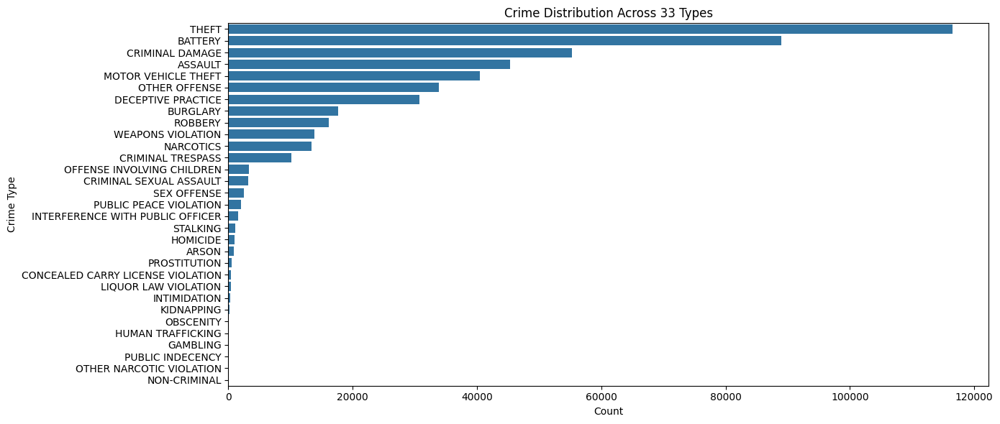

In [124]:
# 2 . EDA
#Crime Distribution Across 33 Crime Types
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")

# Standardize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Display section title
print("📊 Crime Distribution Across 33 Types")

# Create plot
plt.figure(figsize=(14, 6))
sns.countplot(data=df, y='primary_type', order=df['primary_type'].value_counts().index)
plt.title("Crime Distribution Across 33 Types")
plt.xlabel("Count")
plt.ylabel("Crime Type")
plt.tight_layout()
plt.show()


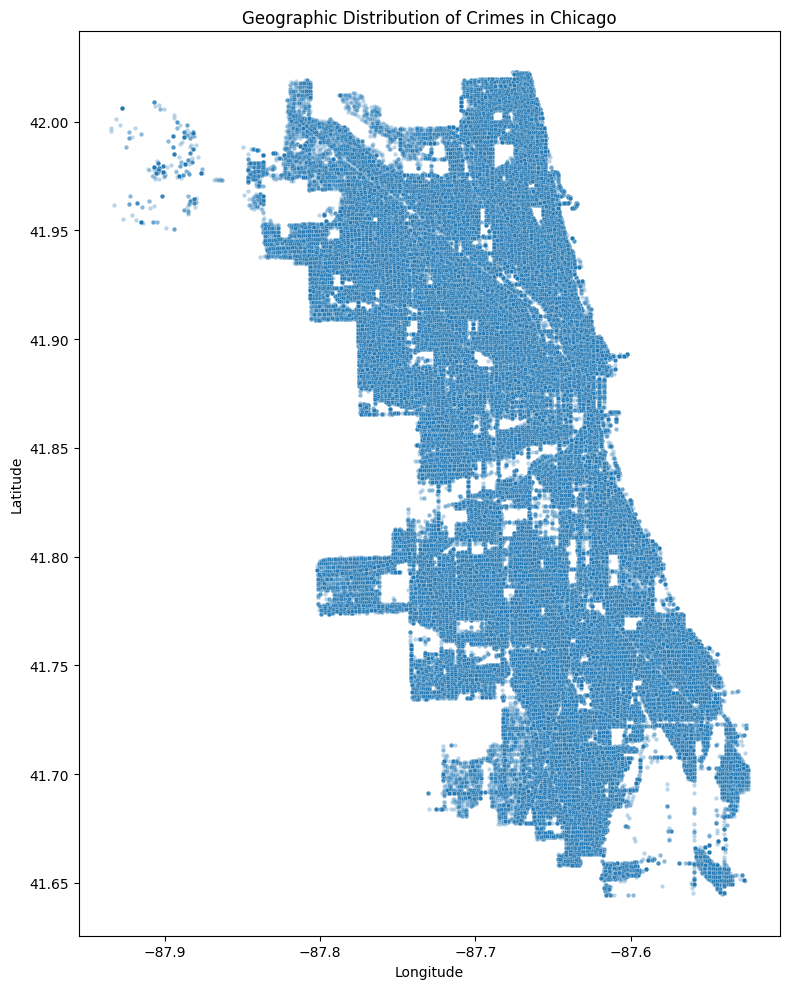

In [125]:
# Geographic Patterns (Latitude & Longitude)
# Scatter plot of crime locations
plt.figure(figsize=(8, 10))
sns.scatterplot(x='longitude', y='latitude', data=df, alpha=0.3, s=10)
plt.title("Geographic Distribution of Crimes in Chicago")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()



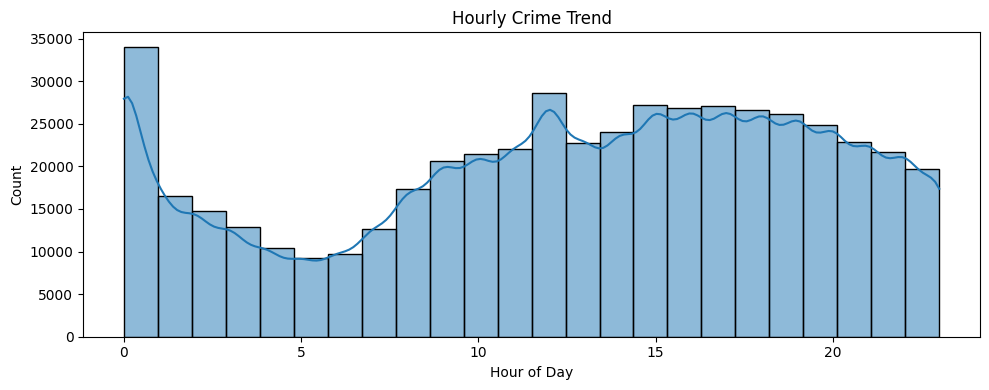

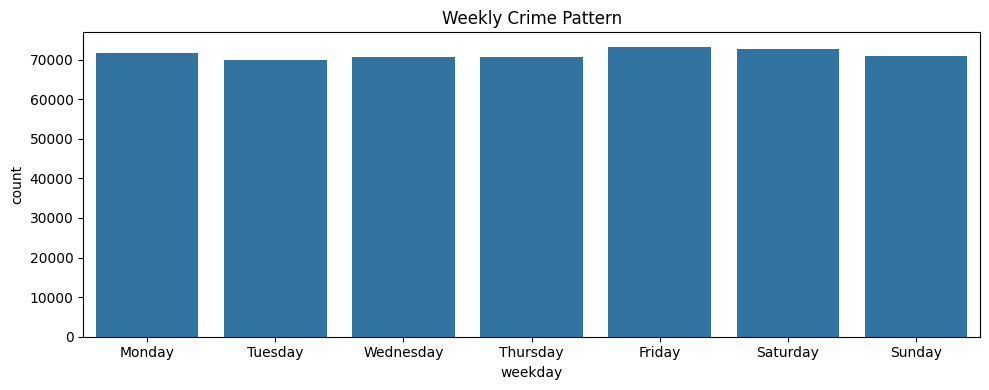

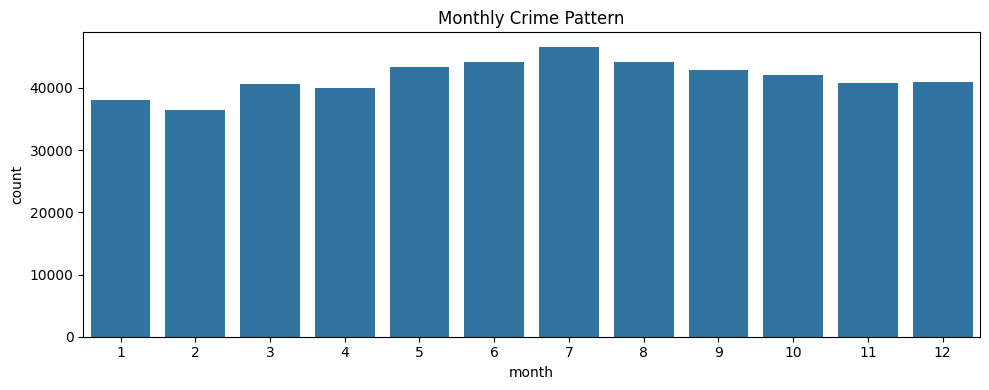

In [126]:
# Temporal Trends (Hourly, Daily, Monthly, Seasonal)
# Ensure 'date' is datetime
df['date'] = pd.to_datetime(df['date'], errors='coerce')
df['hour'] = df['date'].dt.hour
df['weekday'] = df['date'].dt.day_name()
df['month'] = df['date'].dt.month

# Hourly trend
plt.figure(figsize=(10, 4))
sns.histplot(df['hour'], bins=24, kde=True)
plt.title("Hourly Crime Trend")
plt.xlabel("Hour of Day")
plt.tight_layout()
plt.show()

# Weekday trend
plt.figure(figsize=(10, 4))
sns.countplot(x='weekday', data=df, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title("Weekly Crime Pattern")
plt.tight_layout()
plt.show()

# Monthly trend
plt.figure(figsize=(10, 4))
sns.countplot(x='month', data=df)
plt.title("Monthly Crime Pattern")
plt.tight_layout()
plt.show()



Arrest Rate by Crime Type:
 primary_type
HUMAN TRAFFICKING                    0.027027
MOTOR VEHICLE THEFT                  0.029559
DECEPTIVE PRACTICE                   0.031429
CRIMINAL SEXUAL ASSAULT              0.034729
CRIMINAL DAMAGE                      0.039366
INTIMIDATION                         0.040956
BURGLARY                             0.050062
STALKING                             0.055089
KIDNAPPING                           0.063830
THEFT                                0.074746
OFFENSE INVOLVING CHILDREN           0.077065
ROBBERY                              0.078828
SEX OFFENSE                          0.085511
ARSON                                0.094966
ASSAULT                              0.112967
BATTERY                              0.175517
OTHER OFFENSE                        0.195823
CRIMINAL TRESPASS                    0.299302
HOMICIDE                             0.332698
OBSCENITY                            0.482143
PUBLIC PEACE VIOLATION               0.

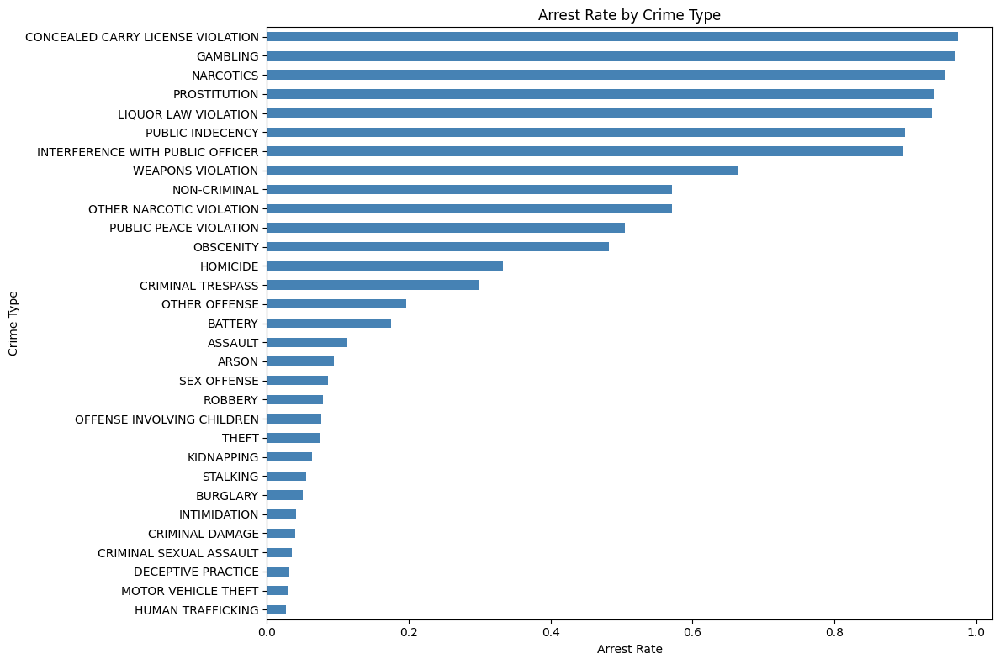

Domestic Incident Rate by Crime Type:
 primary_type
LIQUOR LAW VIOLATION                 0.000000
GAMBLING                             0.000000
OTHER NARCOTIC VIOLATION             0.000000
NON-CRIMINAL                         0.000000
PUBLIC INDECENCY                     0.000000
NARCOTICS                            0.001199
PROSTITUTION                         0.002033
CONCEALED CARRY LICENSE VIOLATION    0.002137
WEAPONS VIOLATION                    0.008160
DECEPTIVE PRACTICE                   0.015731
MOTOR VEHICLE THEFT                  0.017266
INTERFERENCE WITH PUBLIC OFFICER     0.019120
ROBBERY                              0.026938
PUBLIC PEACE VIOLATION               0.034843
BURGLARY                             0.035032
THEFT                                0.046635
CRIMINAL TRESPASS                    0.078194
ARSON                                0.083524
HOMICIDE                             0.089609
HUMAN TRAFFICKING                    0.108108
CRIMINAL DAMAGE             

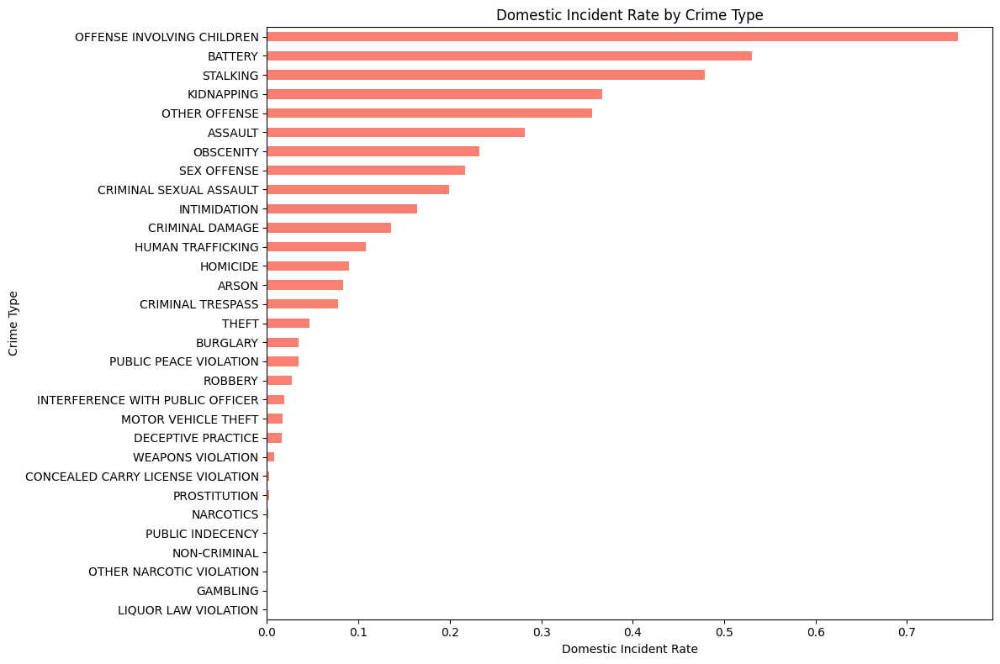

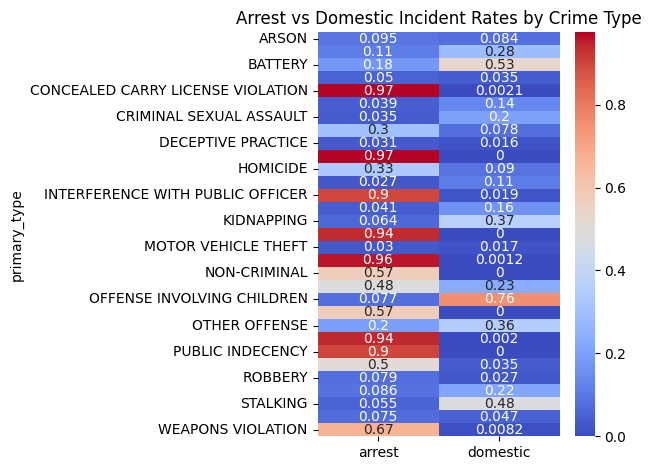

In [127]:
# Arrest Rates & Domestic Incident Correlations

# Standardize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Arrest Rate by Crime Type
arrest_rate = df.groupby('primary_type')['arrest'].mean().sort_values(ascending=True)
print("Arrest Rate by Crime Type:\n", arrest_rate)
plt.figure(figsize=(12, 8))
arrest_rate.plot(kind='barh', color='steelblue')
plt.title("Arrest Rate by Crime Type")
plt.xlabel("Arrest Rate")
plt.ylabel("Crime Type")
plt.tight_layout()
plt.show()

# Domestic Incident Rate by Crime Type
domestic_rate = df.groupby('primary_type')['domestic'].mean().sort_values(ascending=True)
print("Domestic Incident Rate by Crime Type:\n", domestic_rate)
plt.figure(figsize=(12, 8))
domestic_rate.plot(kind='barh', color='salmon')
plt.title("Domestic Incident Rate by Crime Type")
plt.xlabel("Domestic Incident Rate")
plt.ylabel("Crime Type")
plt.tight_layout()
plt.show()


# Heatmap of arrest vs domestic
pivot = df.pivot_table(index='primary_type', values=['arrest', 'domestic'], aggfunc='mean')
sns.heatmap(pivot, annot=True, cmap='coolwarm')
plt.title("Arrest vs Domestic Incident Rates by Crime Type")
plt.tight_layout()
plt.show()



Top 10 Crime Types:
 primary_type
THEFT                  116501
BATTERY                 88994
CRIMINAL DAMAGE         55327
ASSAULT                 45376
MOTOR VEHICLE THEFT     40427
OTHER OFFENSE           33852
DECEPTIVE PRACTICE      30704
BURGLARY                17698
ROBBERY                 16111
WEAPONS VIOLATION       13848
Name: count, dtype: int64


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_13036\306686009.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_crimes.values, y=top_crimes.index, palette='Blues_r')


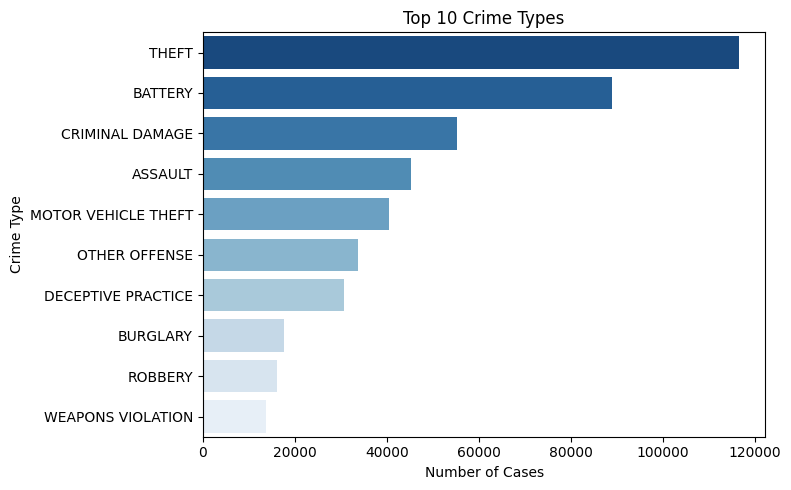

Overall Arrest Rate: 0.145054


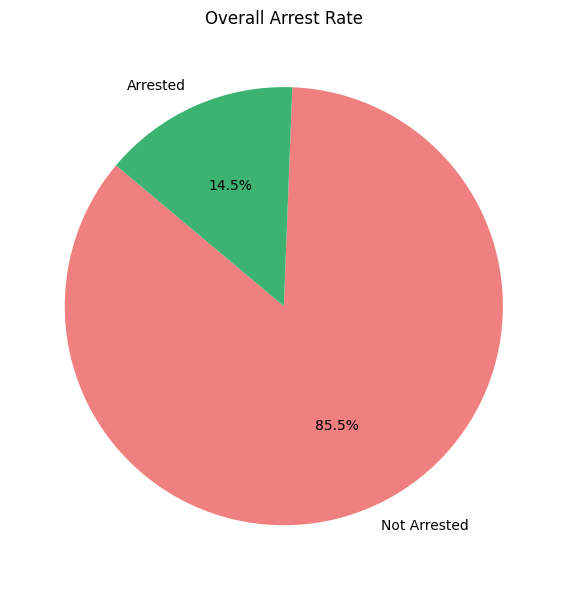

Overall Domestic Incident Rate: 0.185416


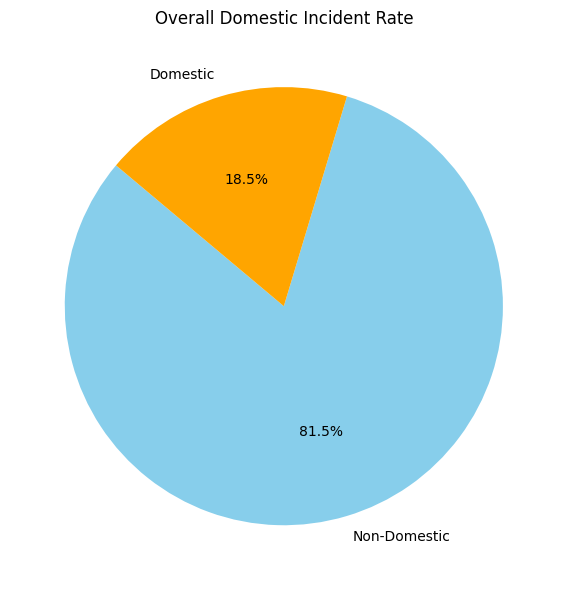

Numeric Summary:
                  id                           date           beat  \
count  5.000000e+05                         500000  500000.000000   
mean   1.361086e+07  2024-10-26 16:31:19.210206464    1153.078046   
min    2.783300e+04            2023-11-01 10:30:00     111.000000   
25%    1.345190e+07            2024-05-03 02:30:00     532.000000   
50%    1.363683e+07            2024-10-15 15:30:00    1033.000000   
75%    1.382586e+07            2025-04-30 13:19:15    1732.000000   
max    1.402182e+07            2025-10-31 00:00:00    2535.000000   
std    6.580929e+05                            NaN     709.401945   

            district          ward  community_area  x_coordinate  \
count  500000.000000  500000.00000   500000.000000  5.000000e+05   
mean       11.300926      23.15981       36.233256  1.165424e+06   
min         1.000000       1.00000        1.000000  1.092647e+06   
25%         5.000000      10.00000       22.000000  1.154177e+06   
50%        10.000000

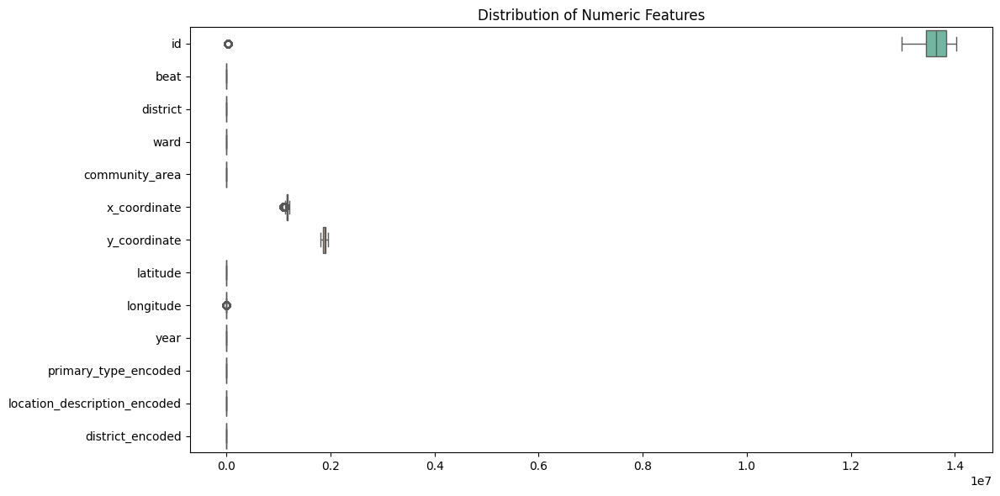

In [128]:
# Statistical Summaries & Insights

# Top 10 crime types
print("Top 10 Crime Types:\n", df['primary_type'].value_counts().head(10))
top_crimes = df['primary_type'].value_counts().head(10)
plt.figure(figsize=(8, 5))
sns.barplot(x=top_crimes.values, y=top_crimes.index, palette='Blues_r')
plt.title("Top 10 Crime Types")
plt.xlabel("Number of Cases")
plt.ylabel("Crime Type")
plt.tight_layout()
plt.show()

# Arrest rate overall
print("Overall Arrest Rate:", df['arrest'].mean())
arrest_counts = df['arrest'].value_counts()
labels = ['Not Arrested', 'Arrested']
colors = ['lightcoral', 'mediumseagreen']

plt.figure(figsize=(6, 6))
plt.pie(arrest_counts, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Overall Arrest Rate")
plt.tight_layout()
plt.show()

# Domestic incident rate
print("Overall Domestic Incident Rate:", df['domestic'].mean())
domestic_counts = df['domestic'].value_counts()
labels = ['Non-Domestic', 'Domestic']
colors = ['skyblue', 'orange']

plt.figure(figsize=(6, 6))
plt.pie(domestic_counts, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Overall Domestic Incident Rate")
plt.tight_layout()
plt.show()

# Summary stats
print("Numeric Summary:\n", df.describe())
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

plt.figure(figsize=(12, 6))
sns.boxplot(data=df[numeric_cols], orient='h', palette='Set2')
plt.title("Distribution of Numeric Features")
plt.tight_layout()
plt.show()


In [ ]:
#----------------------------------------------------------------------------------------------------

In [129]:
#3 . Feature Engineering

#temporal features (hour of day, day of week, weekend flag, season)
import pandas as pd

df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df['date'] = pd.to_datetime(df['date'], errors='coerce')

df['hour'] = df['date'].dt.hour
df['day_of_week'] = df['date'].dt.day_name()
df['is_weekend'] = df['day_of_week'].isin(['Saturday', 'Sunday']).astype(int)

def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

df['season'] = df['date'].dt.month.map(get_season)

print("✅ After Temporal Features:\n", df[['date', 'hour', 'day_of_week', 'is_weekend', 'season']].head(10))

✅ After Temporal Features:
         date  hour day_of_week  is_weekend season
0 2025-10-31     0      Friday           0   Fall
1 2025-10-31     0      Friday           0   Fall
2 2025-10-31     0      Friday           0   Fall
3 2025-10-31     0      Friday           0   Fall
4 2025-10-31     0      Friday           0   Fall
5 2025-10-31     0      Friday           0   Fall
6 2025-10-31     0      Friday           0   Fall
7 2025-10-31     0      Friday           0   Fall
8 2025-10-31     0      Friday           0   Fall
9 2025-10-31     0      Friday           0   Fall


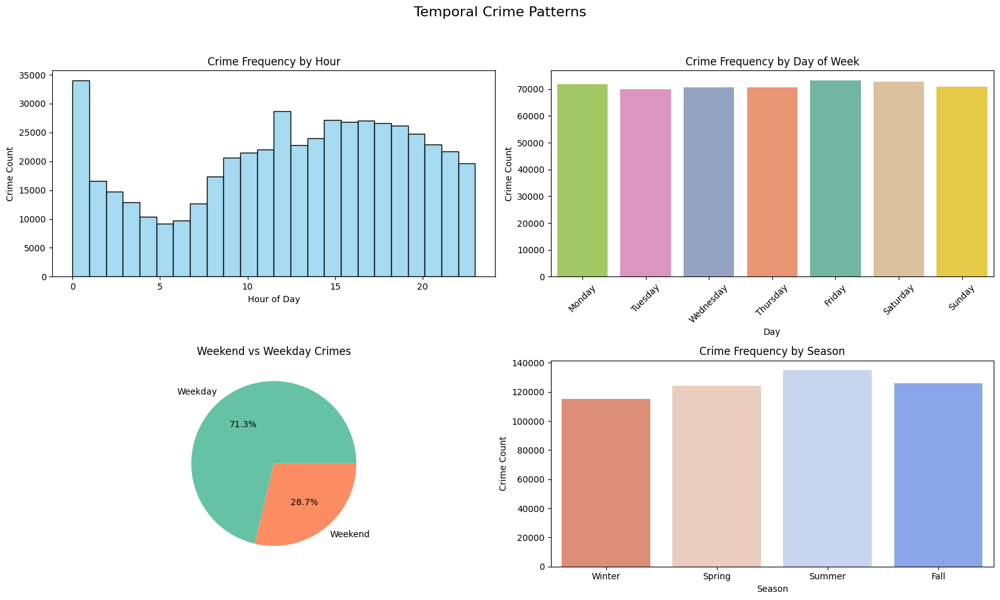

In [ ]:
# Visvalization of temporal features (hour of day, day of week, weekend flag, season)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 10))
fig.suptitle("Temporal Crime Patterns", fontsize=16)

# 1. Crime by Hour
sns.histplot(df['hour'], bins=24, ax=axs[0, 0], color='skyblue')
axs[0, 0].set_title("Crime Frequency by Hour")
axs[0, 0].set_xlabel("Hour of Day")
axs[0, 0].set_ylabel("Crime Count")

# 2. Crime by Day of Week
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.countplot(data=df, x='day_of_week', hue='day_of_week', order=order, ax=axs[0, 1], palette='Set2', legend=False)
axs[0, 1].set_title("Crime Frequency by Day of Week")
axs[0, 1].set_xlabel("Day")
axs[0, 1].set_ylabel("Crime Count")
axs[0, 1].tick_params(axis='x', rotation=45)

# 3. Weekend vs Weekday
weekend_counts = df['is_weekend'].value_counts().sort_index()
axs[1, 0].pie(weekend_counts, labels=['Weekday', 'Weekend'], autopct='%1.1f%%', colors=['#66c2a5', '#fc8d62'])
axs[1, 0].set_title("Weekend vs Weekday Crimes")

# 4. Crime by Season
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
sns.countplot(data=df, x='season', hue='season', order=season_order, ax=axs[1, 1], palette='coolwarm', legend=False)
axs[1, 1].set_title("Crime Frequency by Season")
axs[1, 1].set_xlabel("Season")
axs[1, 1].set_ylabel("Crime Count")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [137]:
# Geographic Feature

df['district_cluster'] = pd.qcut(df['district'], q=4, labels=['Low', 'Mid-Low', 'Mid-High', 'High'])
df['lat_bin'] = pd.cut(df['latitude'], bins=10)
df['lon_bin'] = pd.cut(df['longitude'], bins=10)

print("✅ After Geographic Features:\n", df[['district', 'district_cluster', 'latitude', 'lat_bin', 'longitude', 'lon_bin']].head(10))

✅ After Geographic Features:
    district district_cluster   latitude           lat_bin  longitude  \
0         6          Mid-Low  41.740998   (41.72, 41.758] -87.638606   
1        12         Mid-High  41.873220  (41.871, 41.909] -87.675869   
2         9          Mid-Low  41.837097  (41.834, 41.871] -87.642599   
3        19             High  41.943341  (41.909, 41.947] -87.643210   
4        24             High  41.991404  (41.985, 42.023] -87.656854   
5        10          Mid-Low  41.852198  (41.834, 41.871] -87.674377   
6        20             High  41.981320  (41.947, 41.985] -87.694846   
7         7          Mid-Low  41.767937  (41.758, 41.796] -87.642033   
8        19             High  41.932651  (41.909, 41.947] -87.653197   
9         3              Low  41.782953  (41.758, 41.796] -87.613265   

              lon_bin  
0  (-87.648, -87.607]  
1  (-87.689, -87.648]  
2  (-87.648, -87.607]  
3  (-87.648, -87.607]  
4  (-87.689, -87.648]  
5  (-87.689, -87.648]  
6   (-87.

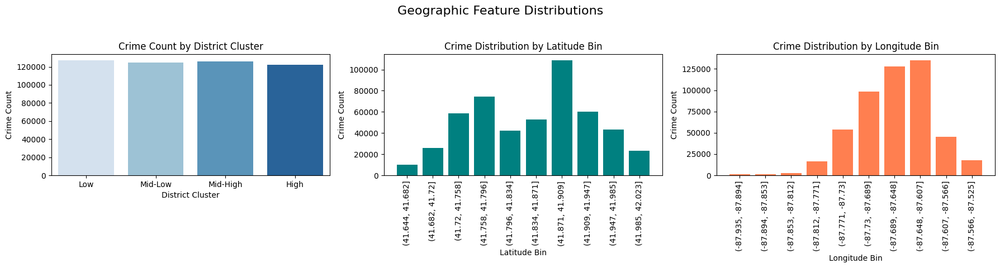

In [141]:
#Geographic Feature Visualization Code
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle("Geographic Feature Distributions", fontsize=16)

# 1. District Cluster Distribution
sns.countplot(data=df, x='district_cluster', hue='district_cluster', order=['Low', 'Mid-Low', 'Mid-High', 'High'], ax=axs[0], palette='Blues', legend=False)
axs[0].set_title("Crime Count by District Cluster")
axs[0].set_xlabel("District Cluster")
axs[0].set_ylabel("Crime Count")

# 2. Latitude Bin Distribution
lat_counts = df['lat_bin'].value_counts().sort_index()
axs[1].bar(lat_counts.index.astype(str), lat_counts.values, color='teal')
axs[1].set_title("Crime Distribution by Latitude Bin")
axs[1].set_xlabel("Latitude Bin")
axs[1].set_ylabel("Crime Count")
axs[1].tick_params(axis='x', rotation=90)

# 3. Longitude Bin Distribution
lon_counts = df['lon_bin'].value_counts().sort_index()
axs[2].bar(lon_counts.index.astype(str), lon_counts.values, color='coral')
axs[2].set_title("Crime Distribution by Longitude Bin")
axs[2].set_xlabel("Longitude Bin")
axs[2].set_ylabel("Crime Count")
axs[2].tick_params(axis='x', rotation=90)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [131]:
#Crime Severity Scores
severity_map = {
    'HOMICIDE': 5, 'CRIMINAL SEXUAL ASSAULT': 4, 'ROBBERY': 4,
    'BATTERY': 3, 'ASSAULT': 3, 'WEAPONS VIOLATION': 3,
    'THEFT': 2, 'BURGLARY': 2, 'MOTOR VEHICLE THEFT': 2,
    'DECEPTIVE PRACTICE': 1, 'OTHER OFFENSE': 1
}
df['severity_score'] = df['primary_type'].map(severity_map).fillna(0)

print("✅ After Severity Scoring:\n", df[['primary_type', 'severity_score']].head(10))



✅ After Severity Scoring:
          primary_type  severity_score
0       OTHER OFFENSE             1.0
1  DECEPTIVE PRACTICE             1.0
2               THEFT             2.0
3  DECEPTIVE PRACTICE             1.0
4  DECEPTIVE PRACTICE             1.0
5  DECEPTIVE PRACTICE             1.0
6             ASSAULT             3.0
7               THEFT             2.0
8               THEFT             2.0
9             BATTERY             3.0


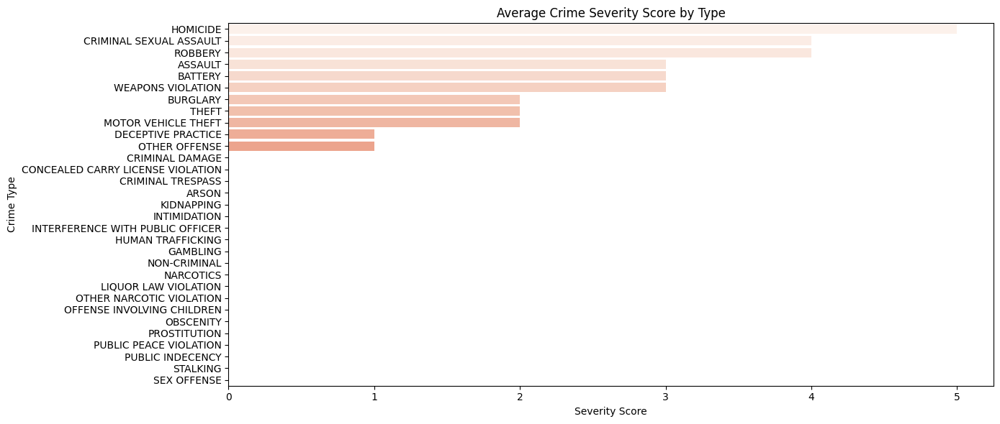

In [ ]:
# Crime Severity Scores Graph 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load and preprocess
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Severity scoring
severity_map = {
    'HOMICIDE': 5, 'CRIMINAL SEXUAL ASSAULT': 4, 'ROBBERY': 4,
    'BATTERY': 3, 'ASSAULT': 3, 'WEAPONS VIOLATION': 3,
    'THEFT': 2, 'BURGLARY': 2, 'MOTOR VEHICLE THEFT': 2,
    'DECEPTIVE PRACTICE': 1, 'OTHER OFFENSE': 1
}
df['severity_score'] = df['primary_type'].map(severity_map).fillna(0)

# Aggregate severity
severity_avg = df.groupby('primary_type')['severity_score'].mean().sort_values(ascending=False).reset_index()

# Plot
plt.figure(figsize=(14, 6))
sns.barplot(data=severity_avg, x='severity_score', y='primary_type', hue='primary_type', dodge=False, palette='Reds', legend=False)
plt.title("Average Crime Severity Score by Type")
plt.xlabel("Severity Score")
plt.ylabel("Crime Type")
plt.tight_layout()
plt.show()

In [144]:
# Categorical Encoding (already done)
# Already have one-hot encoded columns like 'primary_type_*' and 'location_description_*'
# So we skip re-encoding and just preview them
encoded_cols = df.filter(regex='^primary_type_|^location_description_')
print("✅ Encoded Columns Preview:\n", encoded_cols.head(10))

✅ Encoded Columns Preview:
    primary_type_encoded  location_description_encoded
0                    22                            16
1                     8                            78
2                    29                           121
3                     8                            16
4                     8                            16
5                     8                            64
6                     1                           121
7                    29                           121
8                    29                            47
9                     2                            16


In [133]:
#  Normalize Geographic Coordinates
from sklearn.preprocessing import MinMaxScaler  

scaler = MinMaxScaler()
df[['latitude_norm', 'longitude_norm']] = scaler.fit_transform(df[['latitude', 'longitude']])

print("✅ After Coordinate Normalization:\n", df[['latitude', 'longitude', 'latitude_norm', 'longitude_norm']].head(10))

✅ After Coordinate Normalization:
     latitude  longitude  latitude_norm  longitude_norm
0  41.740998 -87.638606       0.255068        0.721789
1  41.873220 -87.675869       0.604890        0.630914
2  41.837097 -87.642599       0.509319        0.712052
3  41.943341 -87.643210       0.790411        0.710561
4  41.991404 -87.656854       0.917574        0.677288
5  41.852198 -87.674377       0.549274        0.634551
6  41.981320 -87.694846       0.890894        0.584631
7  41.767937 -87.642033       0.326343        0.713433
8  41.932651 -87.653197       0.762129        0.686205
9  41.782953 -87.613265       0.366070        0.783591


In [145]:
#----------------------------------------------------------------------------------------------------

In [ ]:
# 4 . Unsupervised Learning - Clustering Analysis

#Geographic Crime Hotspot Clustering

In [11]:
# K-Means Clustering for identifying distinct crime concentration zones - without sample
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

In [12]:
#Load and Prepare Data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# Drop rows with missing coordinates
df = df.dropna(subset=['latitude', 'longitude'])
X = df[['latitude', 'longitude']]

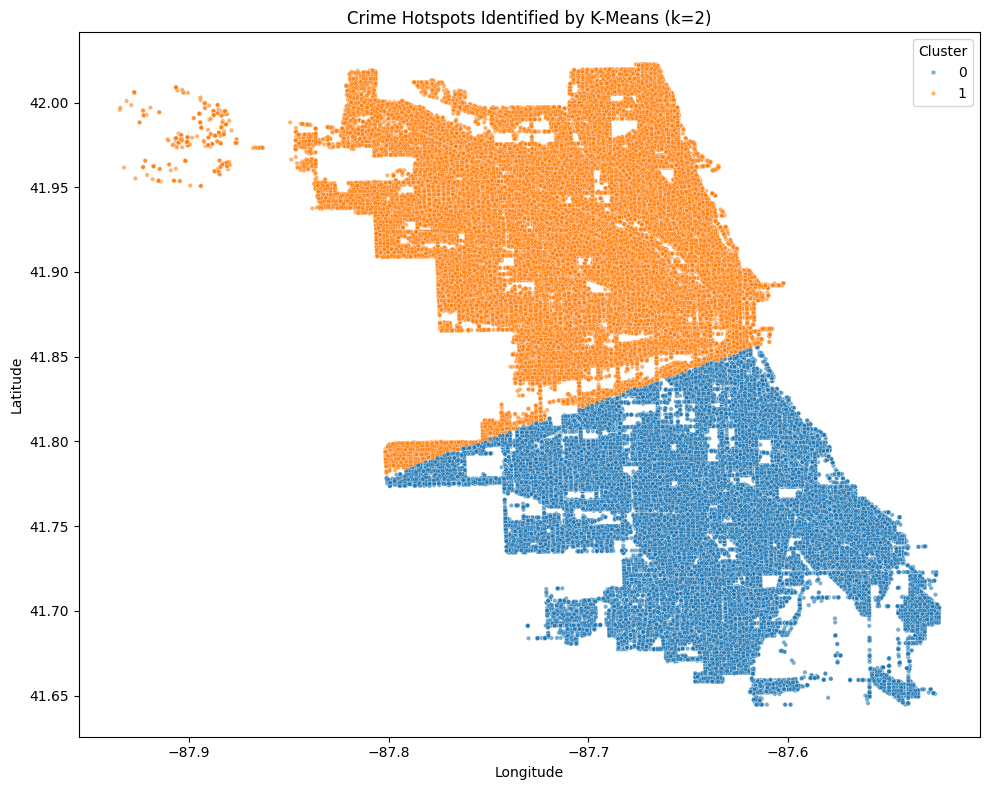

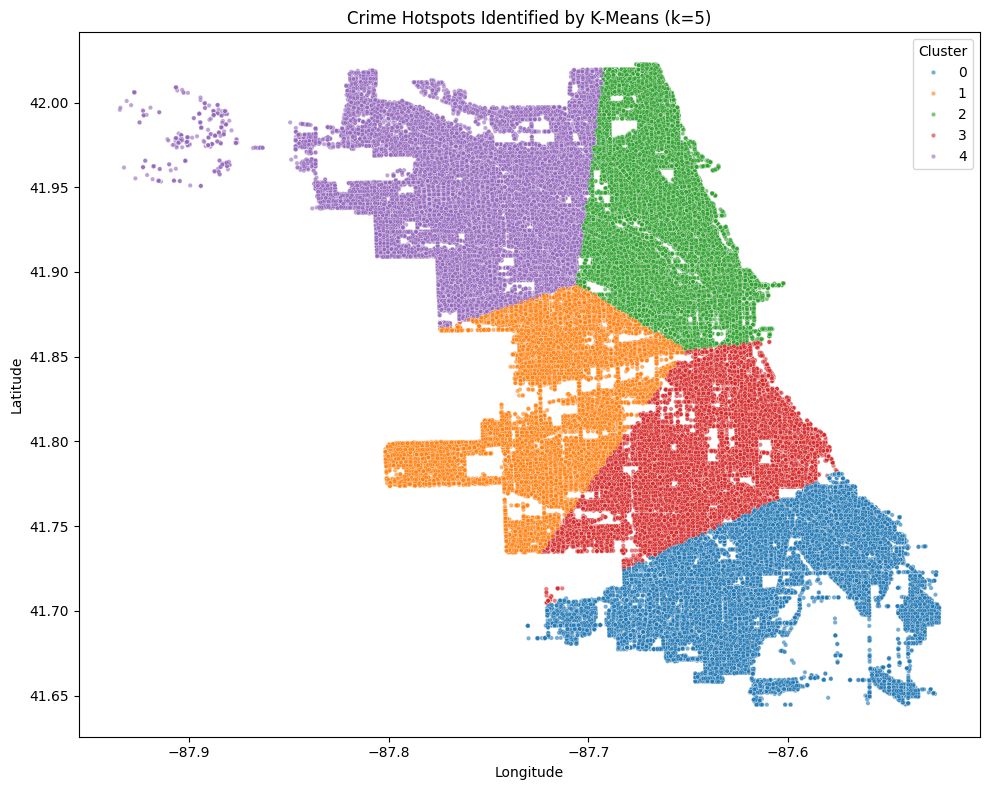

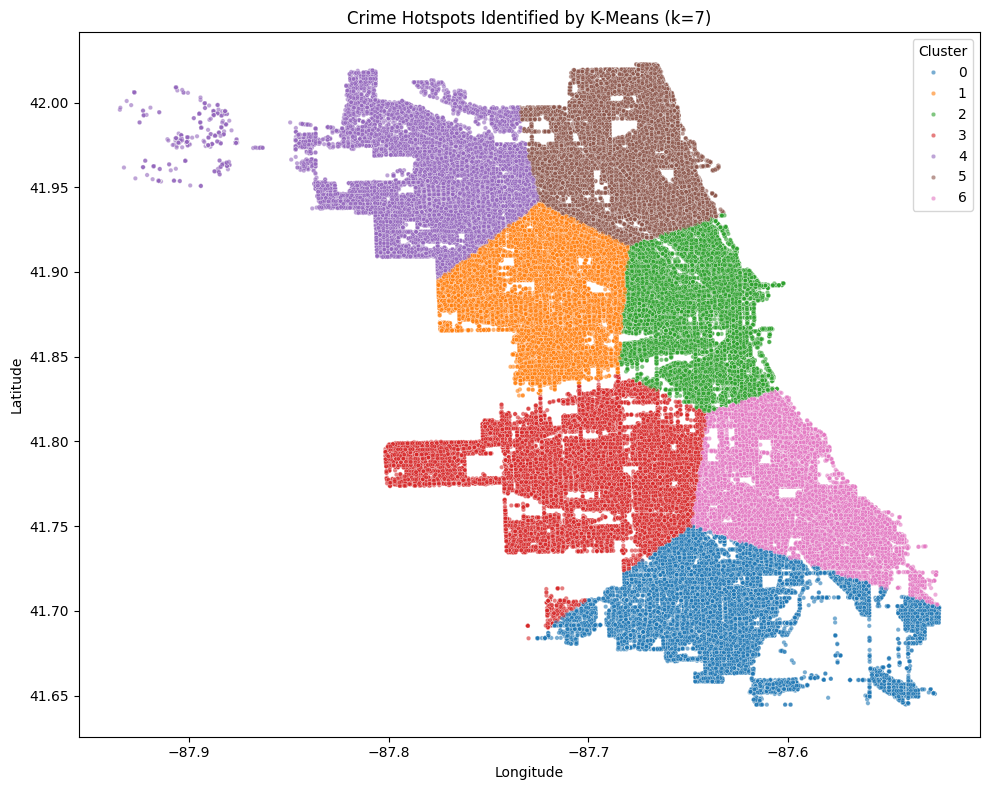

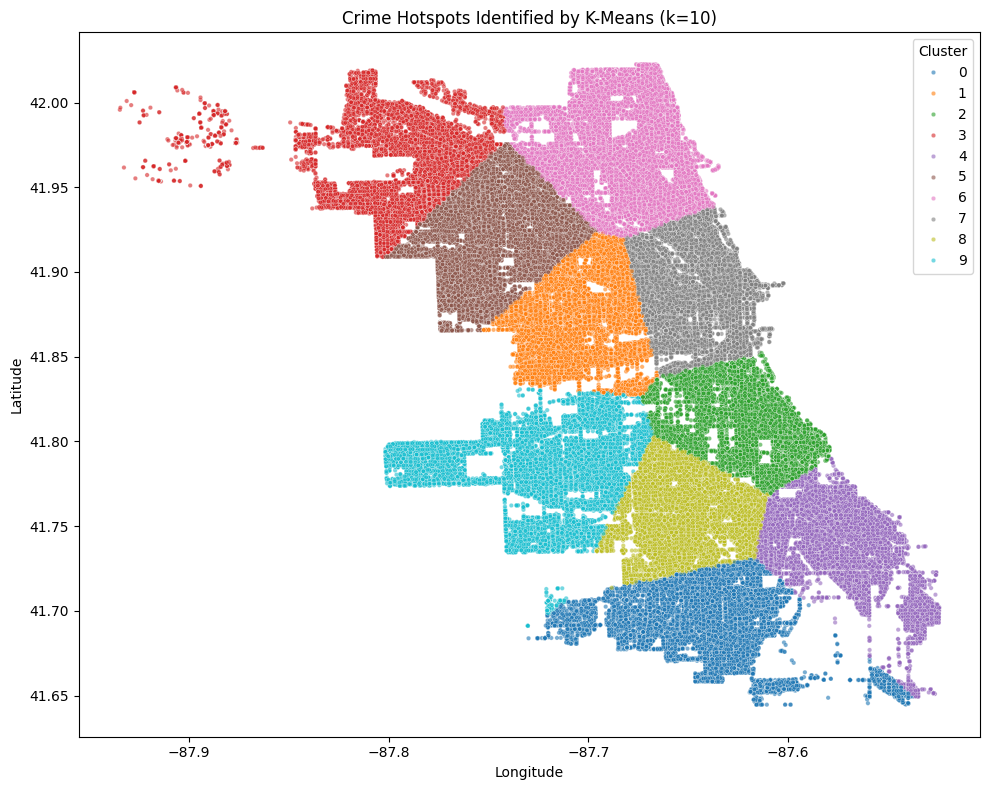

In [13]:
#Apply K-Means Clustering
for k in [2,5,7,10]:
    kmeans = KMeans(n_clusters=k, random_state=42)
    df[f'cluster_{k}'] = kmeans.fit_predict(X)

    # Plot clusters
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='longitude', y='latitude', hue=f'cluster_{k}', data=df, palette='tab10', s=10, alpha=0.6)
    plt.title(f"Crime Hotspots Identified by K-Means (k={k})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend(title="Cluster")
    plt.tight_layout()
    plt.show()

K=2: Silhouette=0.504, DBI=0.739, Inertia=2235.99
K=3: Silhouette=0.424, DBI=0.961, Inertia=1686.68
K=4: Silhouette=0.360, DBI=1.004, Inertia=1313.06
K=5: Silhouette=0.333, DBI=1.004, Inertia=1132.41
K=6: Silhouette=0.400, DBI=0.856, Inertia=836.12
K=7: Silhouette=0.416, DBI=0.813, Inertia=671.17
K=8: Silhouette=0.395, DBI=0.862, Inertia=615.88
K=9: Silhouette=0.376, DBI=0.892, Inertia=553.67
K=10: Silhouette=0.399, DBI=0.820, Inertia=465.79


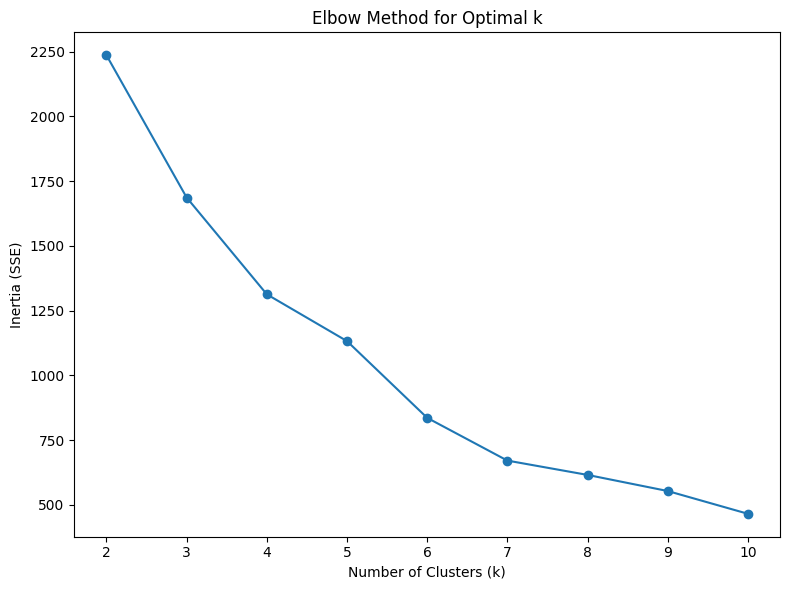

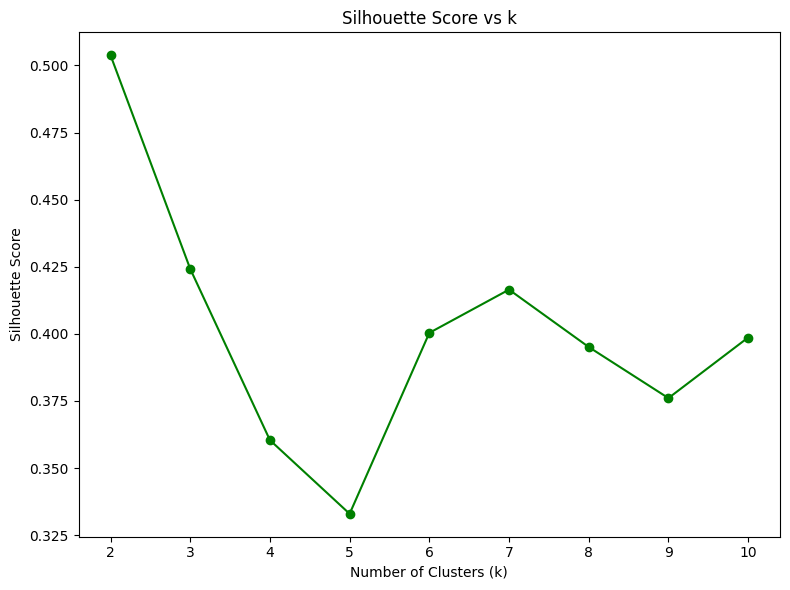

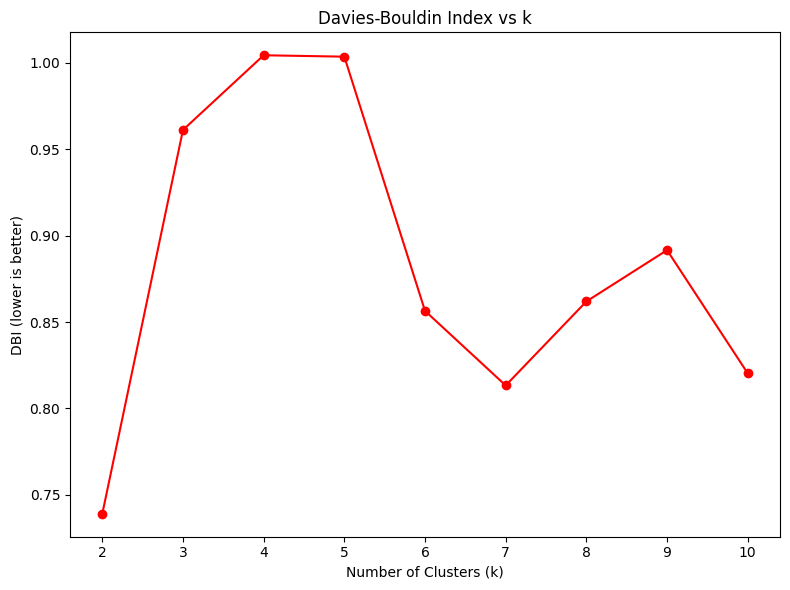

In [ ]:
#**************************************K - means evaluation********************************************
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Prepare coordinate data
X = df[['latitude', 'longitude']].dropna()

# Store evaluation metrics
inertia = []
sil_scores = []
dbi_scores = []
K_range = range(2, 11)

# Evaluate K-Means across multiple k values
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X)

    inertia.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(X, labels))
    dbi_scores.append(davies_bouldin_score(X, labels))

    print(f"K={k}: Silhouette={sil_scores[-1]:.3f}, DBI={dbi_scores[-1]:.3f}, Inertia={inertia[-1]:.2f}")

# Plot Elbow Curve
plt.figure(figsize=(8, 6))
plt.plot(K_range, inertia, marker='o')
plt.title("Elbow Method for Optimal k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (SSE)")
plt.tight_layout()
plt.show()

# Plot Silhouette Score
plt.figure(figsize=(8, 6))
plt.plot(K_range, sil_scores, marker='o', color='green')
plt.title("Silhouette Score vs k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.tight_layout()
plt.show()

# Plot Davies-Bouldin Index
plt.figure(figsize=(8, 6))
plt.plot(K_range, dbi_scores, marker='o', color='red')
plt.title("Davies-Bouldin Index vs k")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("DBI (lower is better)")
plt.tight_layout()
plt.show()

In [26]:
#DBSCAN for density-based spatial clustering with noise detection - with 500000 sample
from sklearn.cluster import DBSCAN
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [27]:
#Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

X = df[['latitude', 'longitude']]

In [28]:
# Sample 500,000 rows for faster DBSCAN
df_sample = df.sample(n=500000, random_state=42)
X_sample = df_sample[['latitude', 'longitude']]

# Apply DBSCAN
db = DBSCAN(eps=0.003, min_samples=30).fit(X_sample)
df_sample['dbscan_cluster'] = db.labels_


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_22564\1820010498.py:11: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\Akshiya George\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


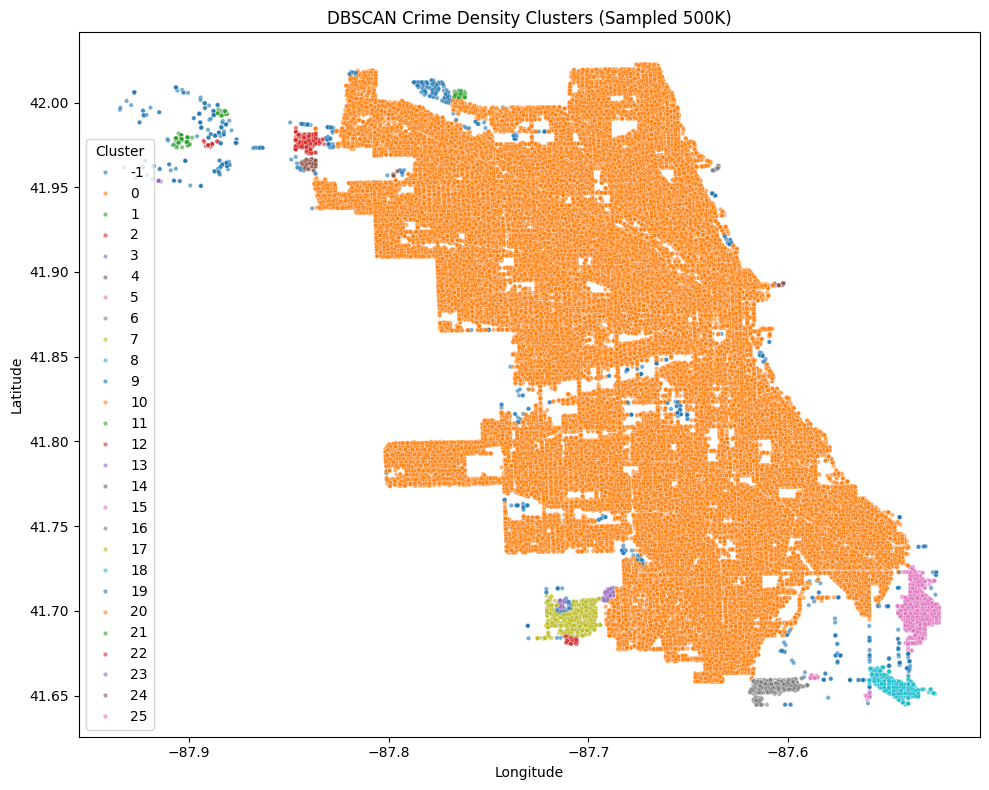

In [29]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='longitude', y='latitude',
    hue='dbscan_cluster', data=df_sample,
    palette='tab10', s=10, alpha=0.6
)
plt.title("DBSCAN Crime Density Clusters (Sampled 500K)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

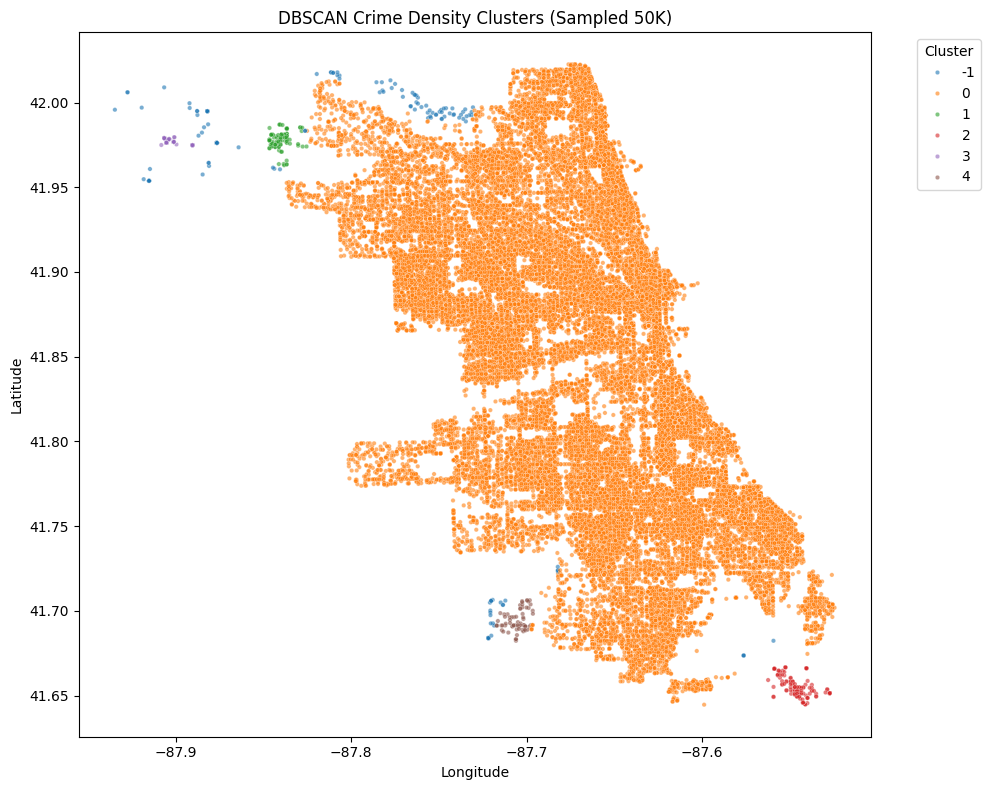

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN

# 1. Load and clean the data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# 2. Sample every 10th row (~50K points)
df_sample = df.iloc[::10, :].copy()
X_sample = df_sample[['latitude', 'longitude']].values

# 3. Run DBSCAN clustering
dbscan = DBSCAN(eps=0.01, min_samples=50)   # tune eps & min_samples for your dataset
labels = dbscan.fit_predict(X_sample)

# 4. Add cluster labels to dataframe
df_sample['dbscan_cluster'] = labels

# 5. Plot DBSCAN clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='longitude', y='latitude',
    hue='dbscan_cluster', data=df_sample,
    palette='tab10', s=10, alpha=0.6
)
plt.title("DBSCAN Crime Density Clusters (Sampled 50K)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

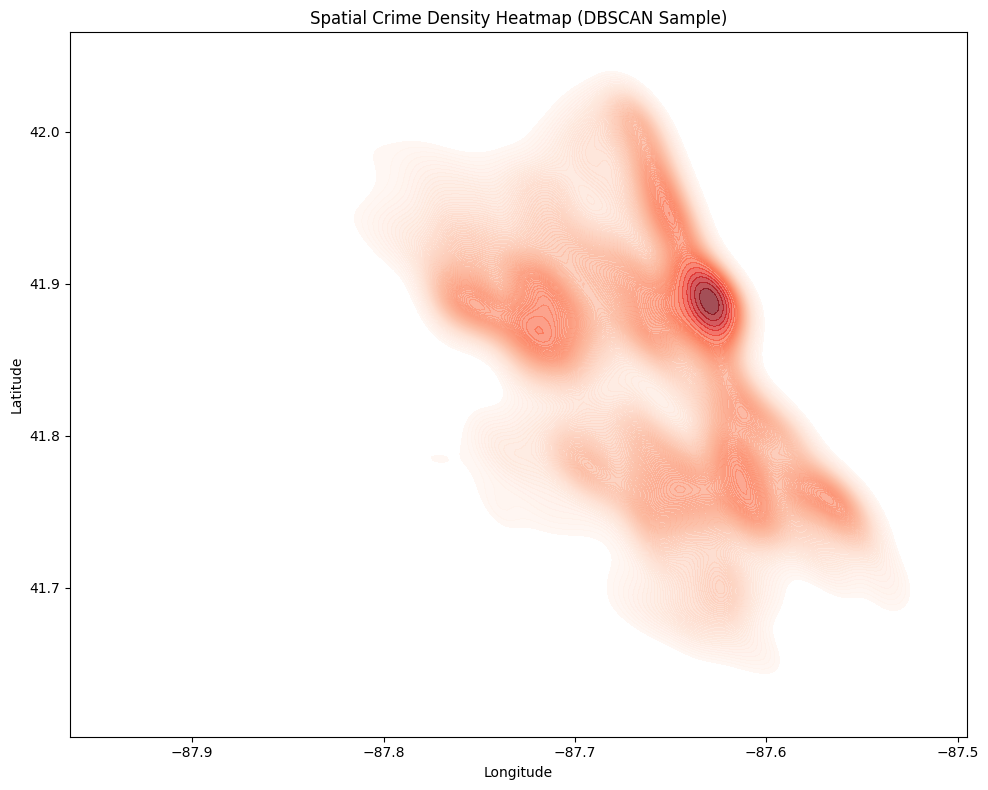

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.kdeplot(
    x=df_sample['longitude'], 
    y=df_sample['latitude'], 
    fill=True, cmap="Reds", levels=100, alpha=0.7
)
plt.title("Spatial Crime Density Heatmap (DBSCAN Sample)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_22564\2098828064.py:89: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.

C:\Users\Akshiya George\AppData\Roaming\Python\Python313\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 128205 (\N{ROUND PUSHPIN}) missing from font(s) DejaVu Sans.



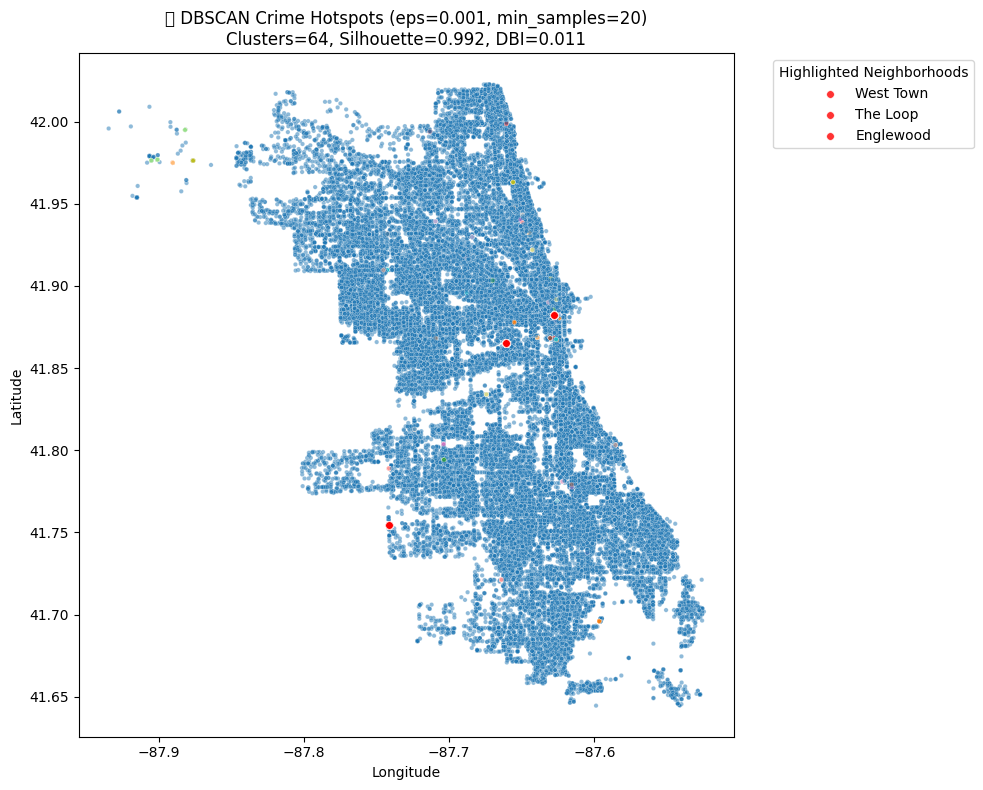

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances_argmin_min

# Load and clean data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# Sample and scale
df_sample = df.iloc[::10, :].copy()
X_sample = df_sample[['latitude', 'longitude']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)

# DBSCAN clustering
eps = 0.001
min_samples = 20
db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_scaled)
labels = db.labels_
df_sample['cluster'] = labels

# Metrics
mask = labels != -1
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
sil = silhouette_score(X_scaled[mask], labels[mask]) if n_clusters > 1 else None
dbi = davies_bouldin_score(X_scaled[mask], labels[mask]) if n_clusters > 1 else None

# Compute cluster centroids
centroids_df = df_sample[df_sample['cluster'] != -1].groupby('cluster')[['latitude', 'longitude']].mean().reset_index()

# Reference neighborhoods
neighborhoods = pd.DataFrame({
    'area_name': [
        'The Loop', 'Lincoln Park', 'Hyde Park', 'Englewood', 'Austin',
        'Lake View', 'South Shore', 'Rogers Park', 'West Town', 'Logan Square'
    ],
    'latitude': [41.8818, 41.9250, 41.8000, 41.7800, 41.9100,
                 41.9400, 41.7600, 42.0100, 41.9000, 41.9300],
    'longitude': [-87.6232, -87.6500, -87.5900, -87.6500, -87.7600,
                  -87.6500, -87.5600, -87.6700, -87.6800, -87.7100]
})

# Map centroids to nearest neighborhood
closest_idx, _ = pairwise_distances_argmin_min(
    centroids_df[['latitude', 'longitude']],
    neighborhoods[['latitude', 'longitude']]
)
centroids_df['area_name'] = neighborhoods.loc[closest_idx, 'area_name'].values

# Create cluster → neighborhood mapping
cluster_to_area = dict(zip(centroids_df['cluster'], centroids_df['area_name']))

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
palette = sns.color_palette("tab20", n_clusters + 1)

# Plot all clusters
sns.scatterplot(
    x='longitude', y='latitude',
    hue='cluster', data=df_sample,
    palette=palette, s=10, alpha=0.5, ax=ax, legend=False
)

# Highlight top clusters with neighborhood names
cluster_counts = df_sample[df_sample['cluster'] != -1]['cluster'].value_counts()
top_clusters = cluster_counts.head(3).index.tolist()

for cluster_id in top_clusters:
    subset = df_sample[df_sample['cluster'] == cluster_id]
    area_name = cluster_to_area.get(cluster_id, f"Cluster {cluster_id}")
    sns.scatterplot(
        x='longitude', y='latitude',
        data=subset, color='red', s=30, alpha=0.8, ax=ax,
        label=area_name
    )

# Annotate metrics
title = f"📍 DBSCAN Crime Hotspots (eps={eps}, min_samples={min_samples})\nClusters={n_clusters}, Silhouette={sil:.3f}, DBI={dbi:.3f}"
ax.set_title(title)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend(title="Highlighted Neighborhoods", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [34]:
# Sample reference list (expand as needed)
neighborhoods = pd.DataFrame({
    'area_name': [
        'The Loop', 'Lincoln Park', 'Hyde Park', 'Englewood', 'Austin',
        'Lake View', 'South Shore', 'Rogers Park', 'West Town', 'Logan Square'
    ],
    'latitude': [41.8818, 41.9250, 41.8000, 41.7800, 41.9100, 41.9400, 41.7600, 42.0100, 41.9000, 41.9300],
    'longitude': [-87.6232, -87.6500, -87.5900, -87.6500, -87.7600, -87.6500, -87.5600, -87.6700, -87.6800, -87.7100]
})

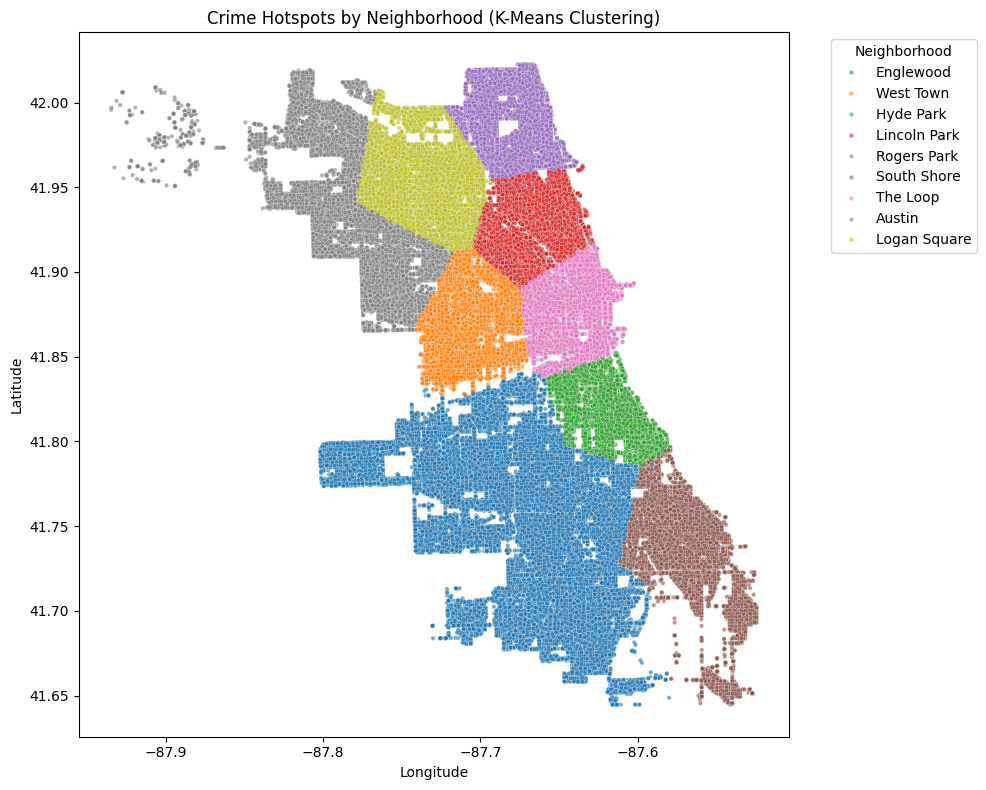

In [38]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin_min
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# 2. Filter data (you can add crime type, weekday, month filters here)
filtered_df = df.copy()

# 3. Run K-Means clustering
X_filtered = filtered_df[['latitude', 'longitude']].values
kmeans = KMeans(n_clusters=15, random_state=42)
filtered_df['cluster'] = kmeans.fit_predict(X_filtered)

# 4. Define reference neighborhoods with coordinates
neighborhoods = pd.DataFrame({
    'area_name': [
        'The Loop', 'Lincoln Park', 'Hyde Park', 'Englewood', 'Austin',
        'Lake View', 'South Shore', 'Rogers Park', 'West Town', 'Logan Square'
    ],
    'latitude': [41.8818, 41.9250, 41.8000, 41.7800, 41.9100, 41.9400, 41.7600, 42.0100, 41.9000, 41.9300],
    'longitude': [-87.6232, -87.6500, -87.5900, -87.6500, -87.7600, -87.6500, -87.5600, -87.6700, -87.6800, -87.7100]
})

# 5. Map cluster centroids to nearest neighborhood
centroids = kmeans.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns=['latitude', 'longitude'])
closest_idx, _ = pairwise_distances_argmin_min(centroid_df[['latitude', 'longitude']], neighborhoods[['latitude', 'longitude']])
centroid_df['area_name'] = neighborhoods.loc[closest_idx, 'area_name'].values

# 6. Map cluster labels to area names
cluster_to_area = dict(enumerate(centroid_df['area_name']))
filtered_df['area_name'] = filtered_df['cluster'].map(cluster_to_area)

# 7. Plot using area names
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='longitude', y='latitude',
    hue='area_name', data=filtered_df,
    palette='tab10', s=10, alpha=0.6
)
plt.title("Crime Hotspots by Neighborhood (K-Means Clustering)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Neighborhood", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

eps=0.001, min_samples=10 → clusters=295, Silhouette=0.987, DBI=0.022
eps=0.001, min_samples=20 → clusters=64, Silhouette=0.992, DBI=0.011
eps=0.001, min_samples=30 → clusters=23, Silhouette=0.991, DBI=0.011
eps=0.001, min_samples=50 → clusters=7, Silhouette=0.989, DBI=0.017
eps=0.002, min_samples=10 → clusters=380, Silhouette=0.974, DBI=0.044
eps=0.002, min_samples=20 → clusters=72, Silhouette=0.984, DBI=0.024
eps=0.002, min_samples=30 → clusters=27, Silhouette=0.988, DBI=0.018
eps=0.002, min_samples=50 → clusters=8, Silhouette=0.977, DBI=0.052
eps=0.003, min_samples=10 → clusters=442, Silhouette=0.964, DBI=0.060
eps=0.003, min_samples=20 → clusters=82, Silhouette=0.978, DBI=0.036
eps=0.003, min_samples=30 → clusters=30, Silhouette=0.976, DBI=0.044
eps=0.003, min_samples=50 → clusters=8, Silhouette=0.977, DBI=0.052
eps=0.005, min_samples=10 → clusters=524, Silhouette=0.940, DBI=0.100
eps=0.005, min_samples=20 → clusters=93, Silhouette=0.965, DBI=0.056
eps=0.005, min_samples=30 → clust

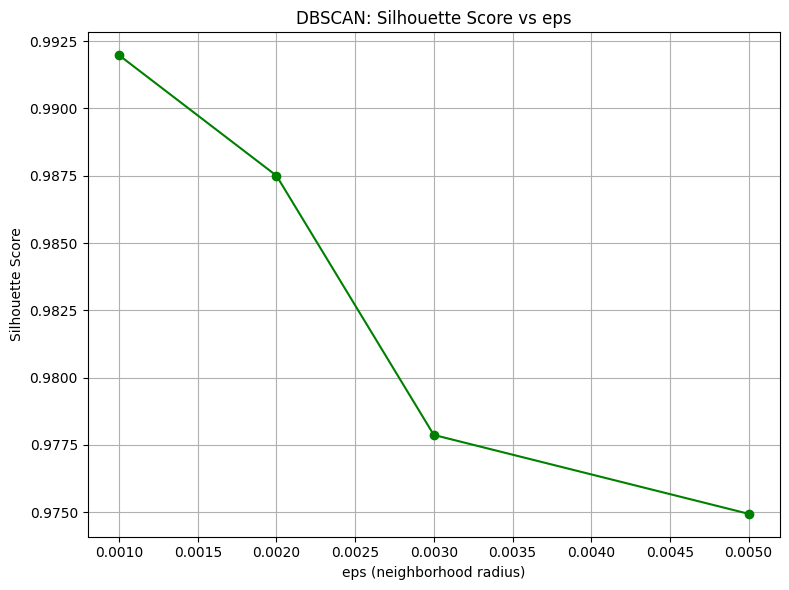

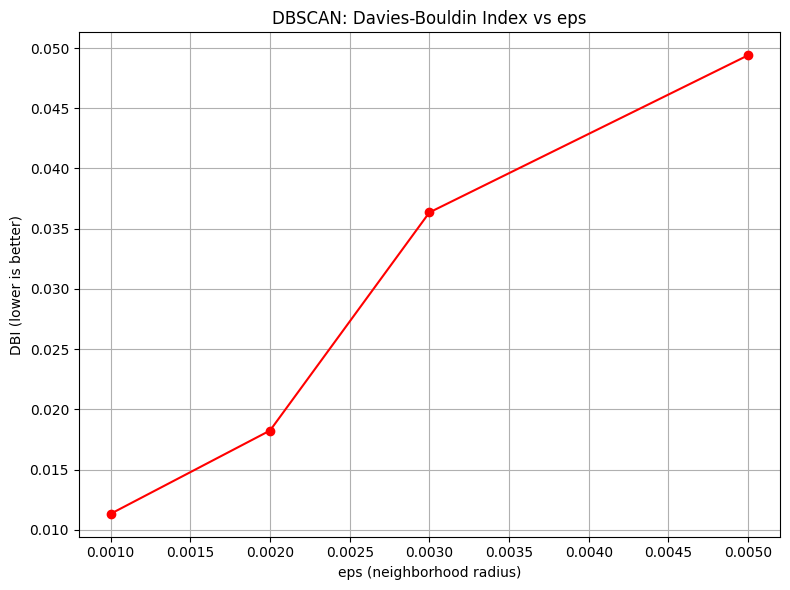

In [ ]:
#******************************** DBSCAN Evaluation with Systematic Sampling*************************
# DBSCAN Evaluation with Systematic Sampling and Visualization

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# 2. Systematic sampling (~50k evenly spread samples)
df_sample = df.iloc[::10, :].copy()
X_sample = df_sample[['latitude', 'longitude']].values

# 3. Scale coordinates (important for DBSCAN)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)

# 4. Parameter tuning loop
eps_values = [0.001, 0.002, 0.003, 0.005]
min_samples_values = [10, 20, 30, 50]

results = []

for eps in eps_values:
    for min_samples in min_samples_values:
        db = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean').fit(X_scaled)
        labels = db.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        mask = labels != -1
        
        if n_clusters > 1 and np.sum(mask) > 0:
            sil = silhouette_score(X_scaled[mask], labels[mask])
            dbi = davies_bouldin_score(X_scaled[mask], labels[mask])
            results.append((eps, min_samples, n_clusters, sil, dbi))
            print(f"eps={eps}, min_samples={min_samples} → clusters={n_clusters}, Silhouette={sil:.3f}, DBI={dbi:.3f}")
        else:
            print(f"eps={eps}, min_samples={min_samples} → only noise or one cluster")

# 5. Convert results into DataFrame
results_df = pd.DataFrame(results, columns=['eps', 'min_samples', 'clusters', 'silhouette', 'dbi'])

# Aggregate by eps (best silhouette and lowest DBI per eps)
agg_results = results_df.groupby('eps').agg({
    'silhouette': 'max',
    'dbi': 'min'
}).reset_index()

# 6. Plot Silhouette Score vs eps
plt.figure(figsize=(8, 6))
plt.plot(agg_results['eps'], agg_results['silhouette'], marker='o', color='green')
plt.title("DBSCAN: Silhouette Score vs eps")
plt.xlabel("eps (neighborhood radius)")
plt.ylabel("Silhouette Score")
plt.grid(True)
plt.tight_layout()
plt.show()

# 7. Plot Davies-Bouldin Index vs eps
plt.figure(figsize=(8, 6))
plt.plot(agg_results['eps'], agg_results['dbi'], marker='o', color='red')
plt.title("DBSCAN: Davies-Bouldin Index vs eps")
plt.xlabel("eps (neighborhood radius)")
plt.ylabel("DBI (lower is better)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [3]:
#Hierarchical Clustering for nested geographic area analysis - without sample
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import StandardScaler


In [4]:
#Load data 
import pandas as pd
from sklearn.preprocessing import StandardScaler

df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

In [7]:
# Optional: limit sample size for clarity
X_sample = X.sample(n=50000, random_state=42)

# Normalize coordinates
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)


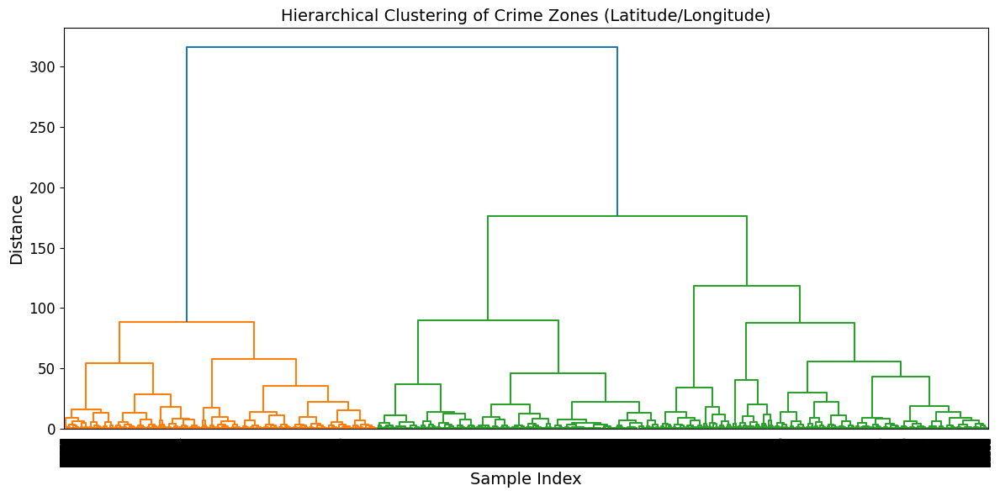

In [8]:
# Perform hierarchical clustering
Z = linkage(X_scaled, method='ward')

# Plot dendrogram
plt.figure(figsize=(12, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering of Crime Zones (Latitude/Longitude)', fontsize=14)
plt.xlabel('Sample Index', fontsize=14)
plt.ylabel('Distance', fontsize=14)
plt.xticks(fontsize=8)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


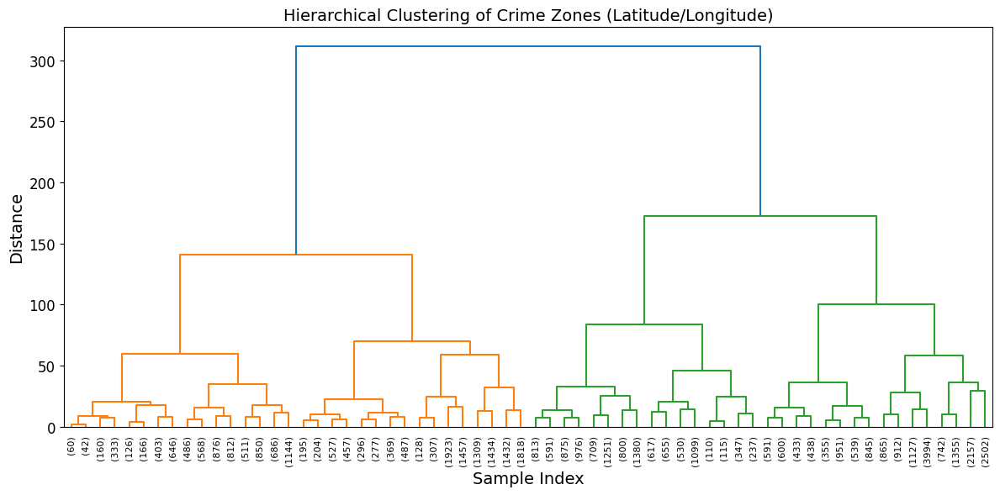

k=2: Silhouette=0.430, DBI=0.894
k=3: Silhouette=0.388, DBI=0.880
k=4: Silhouette=0.383, DBI=0.878
k=5: Silhouette=0.380, DBI=0.828
k=6: Silhouette=0.379, DBI=0.824
k=7: Silhouette=0.367, DBI=0.810
k=8: Silhouette=0.371, DBI=0.812
k=9: Silhouette=0.370, DBI=0.799
k=10: Silhouette=0.357, DBI=0.869

Best Scenario:
k=2 → Silhouette=0.430, DBI=0.894


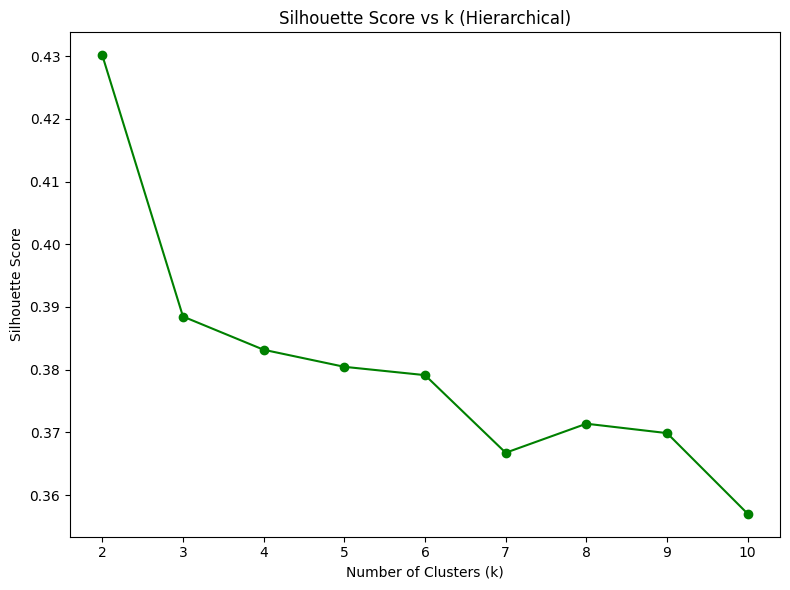

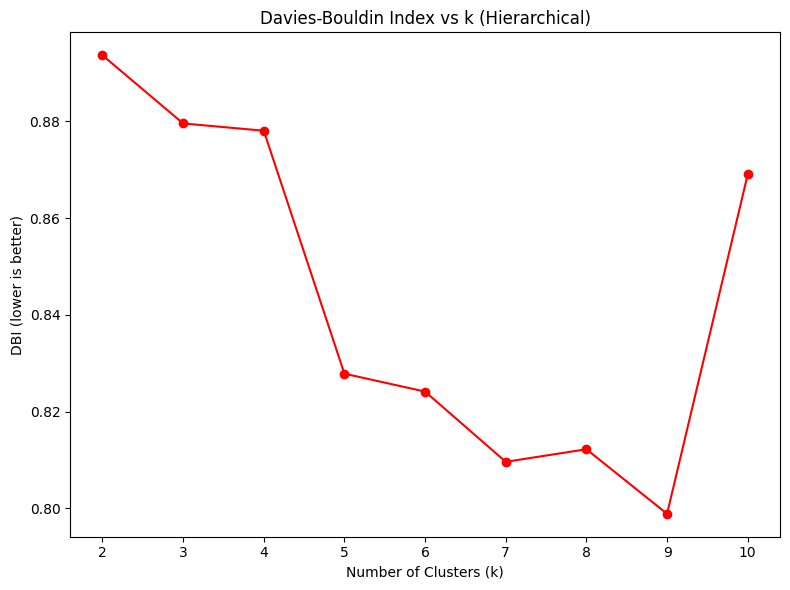

In [ ]:
#**************************************Hierarchical Evaluation***************************************
# DBSCAN Evaluation with Systematic Sampling and Visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.cluster.hierarchy import linkage, dendrogram

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# ✅ Systematic sampling: take every 10th row (~50k evenly spread samples)
df_sample = df.iloc[::10, :].copy()
X_sample = df_sample[['latitude', 'longitude']].values

# 2. Scale coordinates
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)

# 3. Perform hierarchical clustering (Ward linkage)
Z = linkage(X_scaled, method='ward')

# 4. Plot dendrogram (truncated for readability)
plt.figure(figsize=(12, 6))
dendrogram(Z, truncate_mode='level', p=5)
plt.title('Hierarchical Clustering of Crime Zones (Latitude/Longitude)', fontsize=14)
plt.xlabel('Sample Index', fontsize=14)
plt.ylabel('Distance', fontsize=14)
plt.xticks(fontsize=8)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

# 5. Evaluate multiple scenarios (different k values)
results = []
for k in range(2, 11):   # test k=2 to k=10
    hier_model = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels_hier = hier_model.fit_predict(X_scaled)

    sil = silhouette_score(X_scaled, labels_hier)
    dbi = davies_bouldin_score(X_scaled, labels_hier)
    results.append((k, sil, dbi))
    print(f"k={k}: Silhouette={sil:.3f}, DBI={dbi:.3f}")

# 6. Find best k based on silhouette score
best = max(results, key=lambda x: x[1])  # highest silhouette
print("\nBest Scenario:")
print(f"k={best[0]} → Silhouette={best[1]:.3f}, DBI={best[2]:.3f}")

# 7. Plot evaluation curves
k_values = [r[0] for r in results]
sil_scores = [r[1] for r in results]
dbi_scores = [r[2] for r in results]

plt.figure(figsize=(8, 6))
plt.plot(k_values, sil_scores, marker='o', color='green')
plt.title("Silhouette Score vs k (Hierarchical)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(k_values, dbi_scores, marker='o', color='red')
plt.title("Davies-Bouldin Index vs k (Hierarchical)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("DBI (lower is better)")
plt.tight_layout()
plt.show()


=== Linkage: ward ===
k=2: Silhouette=0.219, DBI=1.636
k=3: Silhouette=0.134, DBI=2.211
k=4: Silhouette=0.106, DBI=2.328
k=5: Silhouette=0.118, DBI=2.129
k=6: Silhouette=0.103, DBI=2.169
k=7: Silhouette=0.115, DBI=2.098
k=8: Silhouette=0.109, DBI=2.104
k=9: Silhouette=0.122, DBI=1.920
k=10: Silhouette=0.127, DBI=1.958

=== Linkage: complete ===
k=2: Silhouette=0.257, DBI=1.129
k=3: Silhouette=0.147, DBI=1.463
k=4: Silhouette=0.093, DBI=2.170
k=5: Silhouette=0.074, DBI=2.190
k=6: Silhouette=0.070, DBI=2.395
k=7: Silhouette=0.057, DBI=2.620
k=8: Silhouette=0.052, DBI=2.558
k=9: Silhouette=0.045, DBI=2.654
k=10: Silhouette=0.040, DBI=2.636

=== Linkage: average ===
k=2: Silhouette=0.327, DBI=0.955
k=3: Silhouette=0.194, DBI=1.409
k=4: Silhouette=0.122, DBI=1.754
k=5: Silhouette=0.089, DBI=1.892
k=6: Silhouette=0.042, DBI=1.872
k=7: Silhouette=0.046, DBI=2.004
k=8: Silhouette=0.078, DBI=1.980
k=9: Silhouette=0.104, DBI=1.806
k=10: Silhouette=0.102, DBI=1.807

Best Scenario:
Linkage=averag

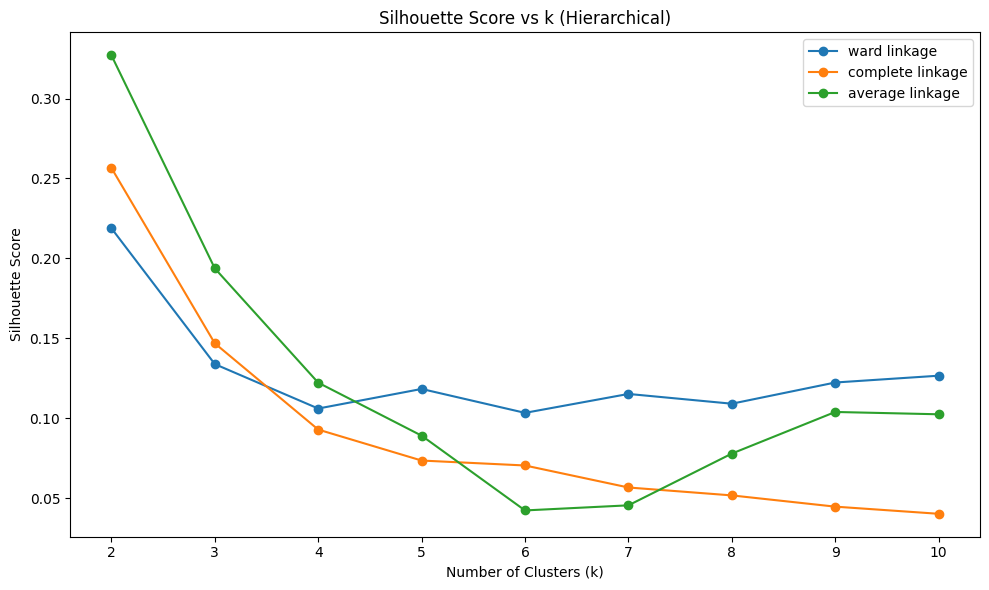

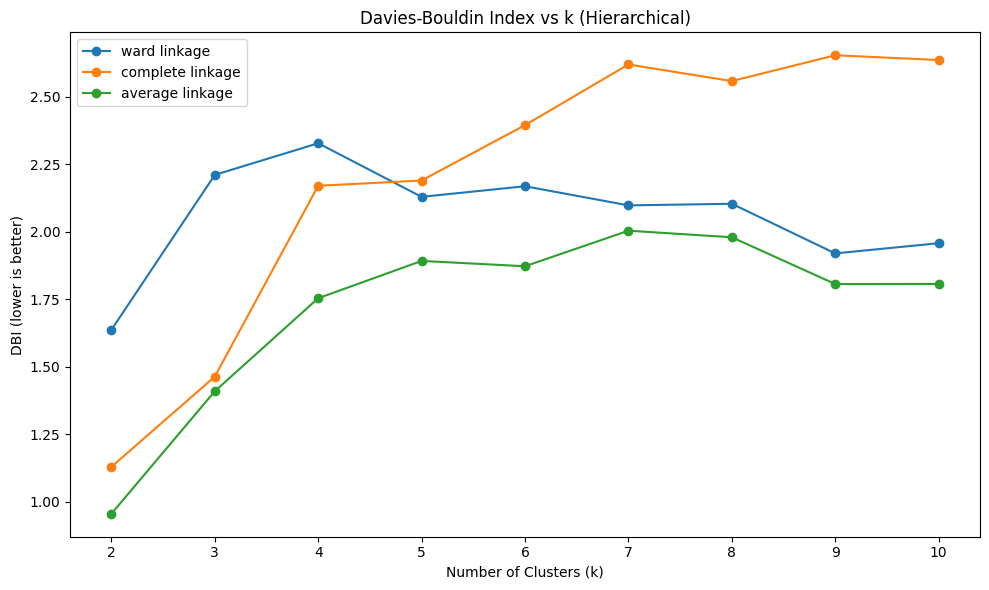

In [ ]:
# *************************Hierarchical Evaluation (ward, complete, average)***************************
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from scipy.cluster.hierarchy import linkage, dendrogram
from datetime import datetime

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude', 'primary_type', 'date'])

# ✅ Systematic sampling: take every 10th row (~50k evenly spread samples)
df_sample = df.iloc[::10, :].copy()

# 2. Feature engineering
# Extract time-of-day buckets
df_sample['date'] = pd.to_datetime(df_sample['date'], errors='coerce')
df_sample['hour'] = df_sample['date'].dt.hour
df_sample['time_bucket'] = pd.cut(
    df_sample['hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],
    right=False
)

# Select features: lat/long + crime type + time bucket
features = ['latitude', 'longitude', 'primary_type', 'time_bucket']

# 3. Preprocessing: scale numeric + one-hot categorical
numeric_features = ['latitude', 'longitude']
categorical_features = ['primary_type', 'time_bucket']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

# Preprocessing
X_processed = preprocessor.fit_transform(df_sample[features])

# Force dense conversion
if hasattr(X_processed, "todense"):
    X_processed = np.array(X_processed.todense())

# Now safe for clustering
for link in linkages:
    print(f"\n=== Linkage: {link} ===")
    for k in range(2, 11):
        hier_model = AgglomerativeClustering(n_clusters=k, linkage=link)
        labels_hier = hier_model.fit_predict(X_processed)

        sil = silhouette_score(X_processed, labels_hier)
        dbi = davies_bouldin_score(X_processed, labels_hier)
        results.append((link, k, sil, dbi))
        print(f"k={k}: Silhouette={sil:.3f}, DBI={dbi:.3f}")

# 5. Find best scenario
best = max(results, key=lambda x: x[2])  # highest silhouette
print("\nBest Scenario:")
print(f"Linkage={best[0]}, k={best[1]} → Silhouette={best[2]:.3f}, DBI={best[3]:.3f}")

# 6. Plot evaluation curves for each linkage
plt.figure(figsize=(10, 6))
for link in linkages:
    k_values = [r[1] for r in results if r[0] == link]
    sil_scores = [r[2] for r in results if r[0] == link]
    plt.plot(k_values, sil_scores, marker='o', label=f'{link} linkage')
plt.title("Silhouette Score vs k (Hierarchical)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
for link in linkages:
    k_values = [r[1] for r in results if r[0] == link]
    dbi_scores = [r[3] for r in results if r[0] == link]
    plt.plot(k_values, dbi_scores, marker='o', label=f'{link} linkage')
plt.title("Davies-Bouldin Index vs k (Hierarchical)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("DBI (lower is better)")
plt.legend()
plt.tight_layout()
plt.show()

In [7]:
# # *************************Hierarchical Evaluation with 20k (ward, complete, average)***************************

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude', 'primary_type', 'date'])

# ✅ Stratified sampling: take 20k rows evenly across crime types
df_sample = df.groupby('primary_type', group_keys=False).apply(lambda x: x.sample(min(len(x), 1000), random_state=42))

# 2. Feature engineering
df_sample['date'] = pd.to_datetime(df_sample['date'], errors='coerce')
df_sample['hour'] = df_sample['date'].dt.hour
df_sample['day_of_week'] = df_sample['date'].dt.day_name()
df_sample['time_bucket'] = pd.cut(
    df_sample['hour'],
    bins=[0, 6, 12, 18, 24],
    labels=['Night', 'Morning', 'Afternoon', 'Evening'],
    right=False
)

features = ['latitude', 'longitude', 'primary_type', 'time_bucket', 'day_of_week']

# 3. Preprocessing
numeric_features = ['latitude', 'longitude']
categorical_features = ['primary_type', 'time_bucket', 'day_of_week']

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_features)
    ]
)

X_processed = preprocessor.fit_transform(df_sample[features])

# 4. Dimensionality reduction (PCA)
pca = PCA(n_components=5)  # reduce to 5 components
X_pca = pca.fit_transform(X_processed)

# 5. Hierarchical clustering with multiple linkage methods
linkages = ['ward', 'complete', 'average']
results = []

for link in linkages:
    print(f"\n=== Linkage: {link} ===")
    for k in range(2, 11):
        hier_model = AgglomerativeClustering(n_clusters=k, linkage=link)
        labels = hier_model.fit_predict(X_pca)

        sil = silhouette_score(X_pca, labels)
        dbi = davies_bouldin_score(X_pca, labels)
        results.append((link, k, sil, dbi))
        print(f"k={k}: Silhouette={sil:.3f}, DBI={dbi:.3f}")

# 6. Best scenario
best = max(results, key=lambda x: x[2])
print("\nBest Scenario:")
print(f"Linkage={best[0]}, k={best[1]} → Silhouette={best[2]:.3f}, DBI={best[3]:.3f}")

C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_18312\426469775.py:17: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_sample = df.groupby('primary_type', group_keys=False).apply(lambda x: x.sample(min(len(x), 1000), random_state=42))



=== Linkage: ward ===
k=2: Silhouette=0.309, DBI=1.179
k=3: Silhouette=0.221, DBI=1.947
k=4: Silhouette=0.201, DBI=1.635
k=5: Silhouette=0.248, DBI=1.596
k=6: Silhouette=0.284, DBI=1.387
k=7: Silhouette=0.295, DBI=1.164
k=8: Silhouette=0.281, DBI=1.228
k=9: Silhouette=0.313, DBI=1.197
k=10: Silhouette=0.309, DBI=1.149

=== Linkage: complete ===
k=2: Silhouette=0.232, DBI=1.197
k=3: Silhouette=0.197, DBI=1.455
k=4: Silhouette=0.198, DBI=1.485
k=5: Silhouette=0.187, DBI=1.384
k=6: Silhouette=0.145, DBI=1.596
k=7: Silhouette=0.141, DBI=1.662
k=8: Silhouette=0.133, DBI=1.834
k=9: Silhouette=0.120, DBI=1.829
k=10: Silhouette=0.140, DBI=1.717

=== Linkage: average ===
k=2: Silhouette=0.441, DBI=0.694
k=3: Silhouette=0.290, DBI=1.104
k=4: Silhouette=0.217, DBI=1.004
k=5: Silhouette=0.137, DBI=1.144
k=6: Silhouette=0.101, DBI=1.073
k=7: Silhouette=0.123, DBI=1.226
k=8: Silhouette=0.167, DBI=1.228
k=9: Silhouette=0.214, DBI=1.103
k=10: Silhouette=0.246, DBI=1.166

Best Scenario:
Linkage=averag

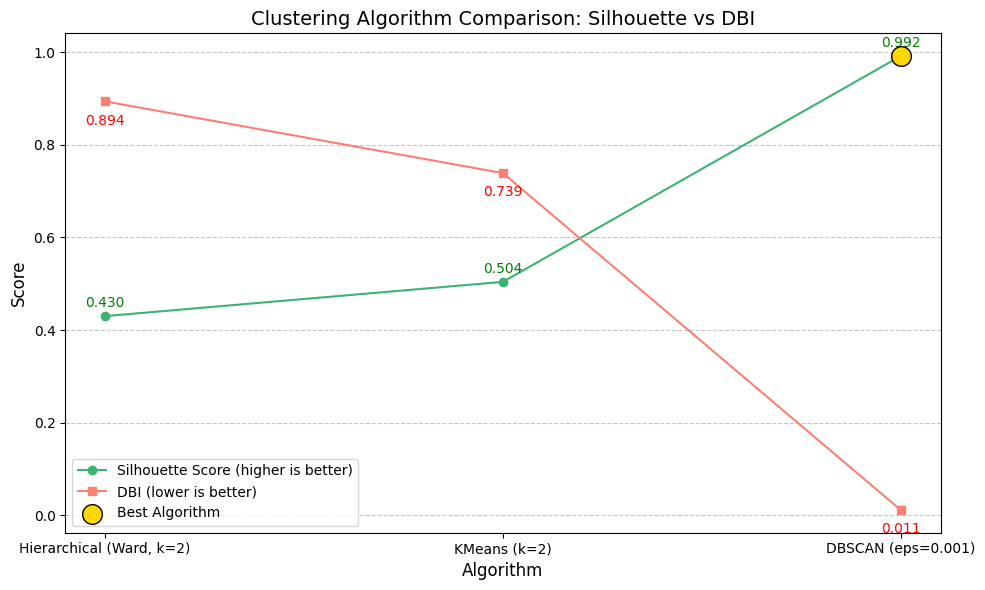

In [10]:
#***************************Comparison of 3 Algorithm for best performance****************************

import matplotlib.pyplot as plt

# Data
algorithms = ['Hierarchical (Ward, k=2)', 'KMeans (k=2)', 'DBSCAN (eps=0.001)']
silhouette_scores = [0.430, 0.504, 0.992]
dbi_scores = [0.894, 0.739, 0.011]

# Identify best algorithm (highest silhouette)
best_index = silhouette_scores.index(max(silhouette_scores))

# Plot
plt.figure(figsize=(10, 6))

# Silhouette line
plt.plot(algorithms, silhouette_scores, marker='o', color='mediumseagreen', label='Silhouette Score (higher is better)')
# DBI line
plt.plot(algorithms, dbi_scores, marker='s', color='salmon', label='DBI (lower is better)')

# Highlight best algorithm point
plt.scatter(algorithms[best_index], silhouette_scores[best_index], 
            color='gold', s=200, edgecolor='black', zorder=5, label='Best Algorithm')

# Labels and title
plt.title('Clustering Algorithm Comparison: Silhouette vs DBI', fontsize=14)
plt.xlabel('Algorithm', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate points
for i, val in enumerate(silhouette_scores):
    plt.text(i, val + 0.02, f"{val:.3f}", ha='center', fontsize=10, color='green')
for i, val in enumerate(dbi_scores):
    plt.text(i, val - 0.05, f"{val:.3f}", ha='center', fontsize=10, color='red')

plt.tight_layout()
plt.show()

In [ ]:
#K means Cluster evaluation _ for result 
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score
import pandas as pd

# Step 1: Prepare Data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

X = df[['latitude', 'longitude']]
X_scaled = StandardScaler().fit_transform(X)

# Step 2: Run K-Means with k=5 and k=10
kmeans_5 = KMeans(n_clusters=5, random_state=42).fit(X_scaled)
df['cluster_5'] = kmeans_5.labels_

kmeans_10 = KMeans(n_clusters=10, random_state=42).fit(X_scaled)
df['cluster_10'] = kmeans_10.labels_

# Step 3: Define Evaluation Function
def evaluate_clusters_sampled(X_scaled, labels, name, sample_size=10000):
    import numpy as np
    sample_idx = np.random.choice(len(X_scaled), size=min(sample_size, len(X_scaled)), replace=False)
    X_sample = X_scaled[sample_idx]
    labels_sample = labels[sample_idx]

    sil = silhouette_score(X_sample, labels_sample)
    dbi = davies_bouldin_score(X_sample, labels_sample)
    print(f"{name} → Silhouette: {sil:.3f}, Davies-Bouldin: {dbi:.3f}")

# Step 4: Evaluate Both Clusterings
evaluate_clusters_sampled(X_scaled, df['cluster_5'].values, "K-Means (k=5)")
evaluate_clusters_sampled(X_scaled, df['cluster_10'].values, "K-Means (k=10)")

K-Means (k=5) → Silhouette: 0.361, Davies-Bouldin: 0.958
K-Means (k=10) → Silhouette: 0.412, Davies-Bouldin: 0.775


In [ ]:
#Cluster profiling :

def profile_clusters(df, cluster_col):
    summary = df.groupby(cluster_col).agg(
        total_crimes=('primary_type', 'count'),
        top_crime=('primary_type', lambda x: x.value_counts().idxmax()),
        arrest_rate=('arrest', lambda x: x.mean().round(2))
    ).reset_index()
    print(summary)
profile_clusters(df, 'cluster_5')
profile_clusters(df, 'cluster_10')

   cluster_5  total_crimes top_crime  arrest_rate
0          0         91588   BATTERY         0.13
1          1         74360   BATTERY         0.18
2          2        142161     THEFT         0.13
3          3        101043   BATTERY         0.14
4          4         90848     THEFT         0.17
   cluster_10  total_crimes top_crime  arrest_rate
0           0         32574   BATTERY         0.15
1           1         61057   BATTERY         0.22
2           2         47126     THEFT         0.12
3           3         17350     THEFT         0.12
4           4         49136   BATTERY         0.12
5           5         56218     THEFT         0.17
6           6         62592     THEFT         0.12
7           7         85841     THEFT         0.13
8           8         49121   BATTERY         0.15
9           9         38985     THEFT         0.14


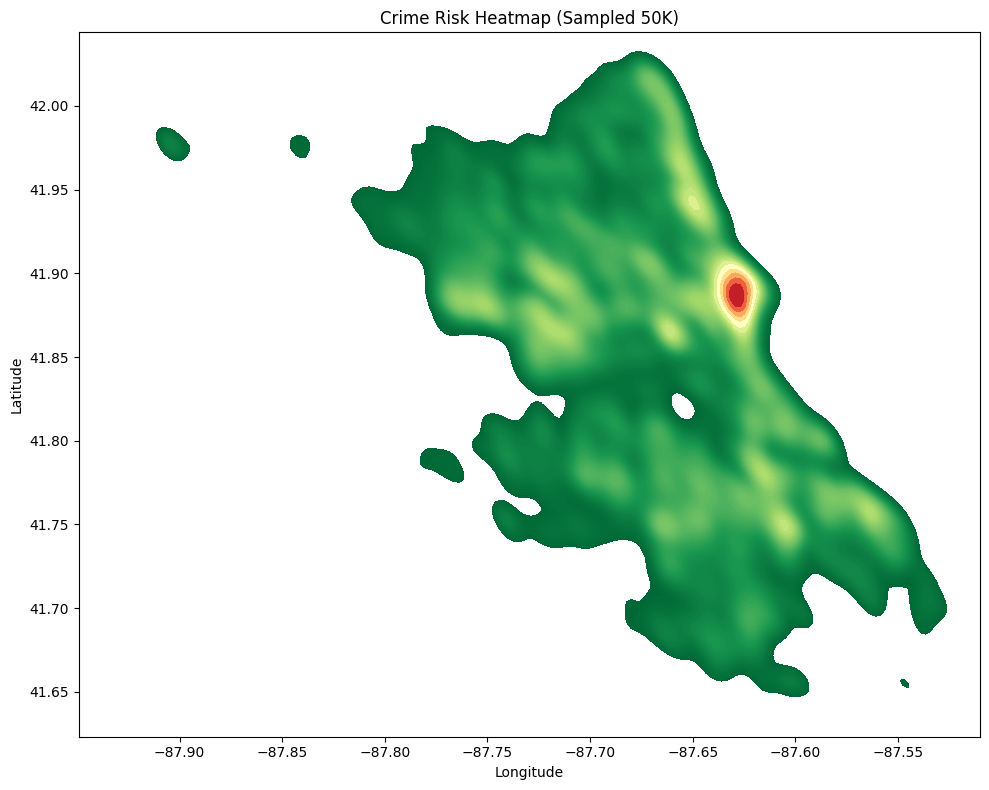

In [ ]:
#Heat map 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load and clean data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

def plot_risk_heatmap_sampled(df, sample_size=50000):
    df_sample = df.sample(n=sample_size, random_state=42)
    plt.figure(figsize=(10, 8))
    sns.kdeplot(
        data=df_sample, x='longitude', y='latitude',
        fill=True, cmap='RdYlGn_r', bw_adjust=0.5, levels=100, thresh=0.05
    )
    plt.title("Crime Risk Heatmap (Sampled 50K)")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.tight_layout()
    plt.show()
plot_risk_heatmap_sampled(df)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score

#  Load and Prepare Data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])
X = df[['latitude', 'longitude']]

#  Sample for DBSCAN 
sample_size = 300000
df_sample = df.sample(n=sample_size, random_state=42)
X_sample = df_sample[['latitude', 'longitude']]

#  Apply DBSCAN 
db = DBSCAN(eps=0.003, min_samples=30).fit(X_sample)
df_sample['dbscan_cluster'] = db.labels_



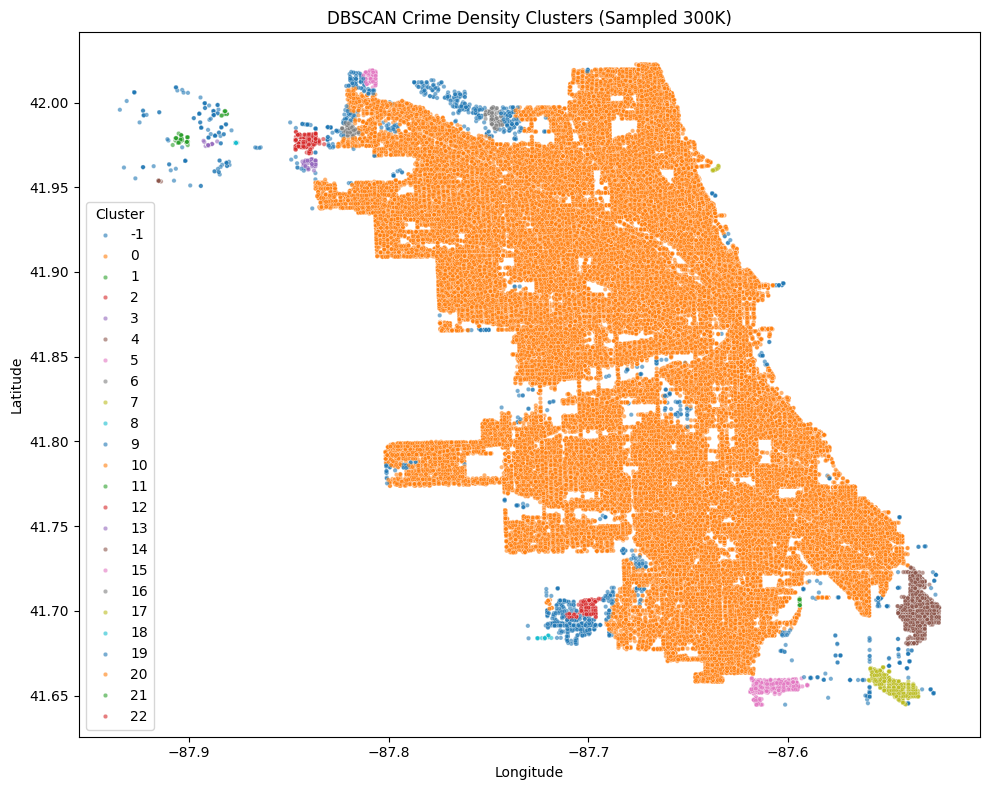

In [ ]:
#  Plot Clusters 
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='longitude', y='latitude',
    hue='dbscan_cluster', data=df_sample,
    palette='tab10', s=10, alpha=0.6
)
plt.title("DBSCAN Crime Density Clusters (Sampled 300K)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()



In [ ]:
#  Evaluate Clustering (Sampled) 
def evaluate_dbscan_sampled(X_sample, labels, sample_size=30000):
    sample = X_sample.copy()
    sample['label'] = labels
    sample = sample[sample['label'] != -1]  # Remove noise

    available = len(sample)
    if available < sample_size:
        print(f"Only {available} core points available. Sampling all.")
        sample_size = available

    sample = sample.sample(n=sample_size, random_state=42)
    sil = silhouette_score(sample[['latitude', 'longitude']], sample['label'])
    dbi = davies_bouldin_score(sample[['latitude', 'longitude']], sample['label'])
    print(f"DBSCAN (Sampled {sample_size}) → Silhouette: {sil:.3f}, Davies-Bouldin: {dbi:.3f}")

evaluate_dbscan_sampled(X_sample, df_sample['dbscan_cluster'])



Only 150 core points available. Sampling all.
DBSCAN (Sampled 150) → Silhouette: 0.324, Davies-Bouldin: 0.454


In [ ]:
#  Profile Clusters 
def profile_clusters(df, cluster_col):
    summary = df.groupby(cluster_col).agg(
        total_crimes=('primary_type', 'count'),
        top_crime=('primary_type', lambda x: x.value_counts().idxmax()),
        arrest_rate=('arrest', lambda x: x.mean().round(2))
    ).reset_index()
    print(summary)

profile_clusters(df_sample[core_mask], 'dbscan_cluster')


    dbscan_cluster  total_crimes            top_crime  arrest_rate
0                0        291893                THEFT         0.15
1                1           682                THEFT         0.28
2                2           511                THEFT         0.08
3                3            74                THEFT         0.14
4                4          1724              BATTERY         0.10
5                5          1350              BATTERY         0.11
6                6            71                THEFT         0.10
7                7           654              BATTERY         0.07
8                8           189                THEFT         0.01
9                9           281              BATTERY         0.10
10              10           120                THEFT         0.07
11              11           223   DECEPTIVE PRACTICE         0.05
12              12           131                THEFT         0.15
13              13           208                THEFT         

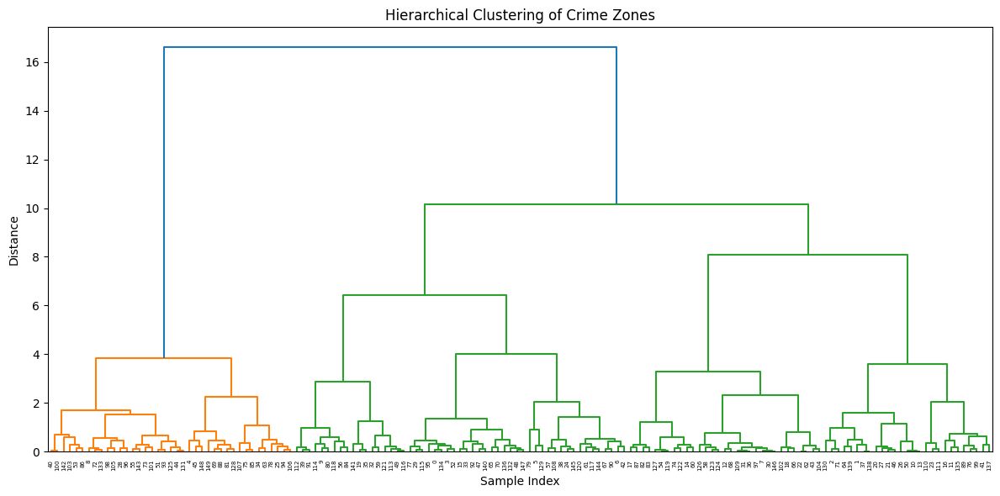

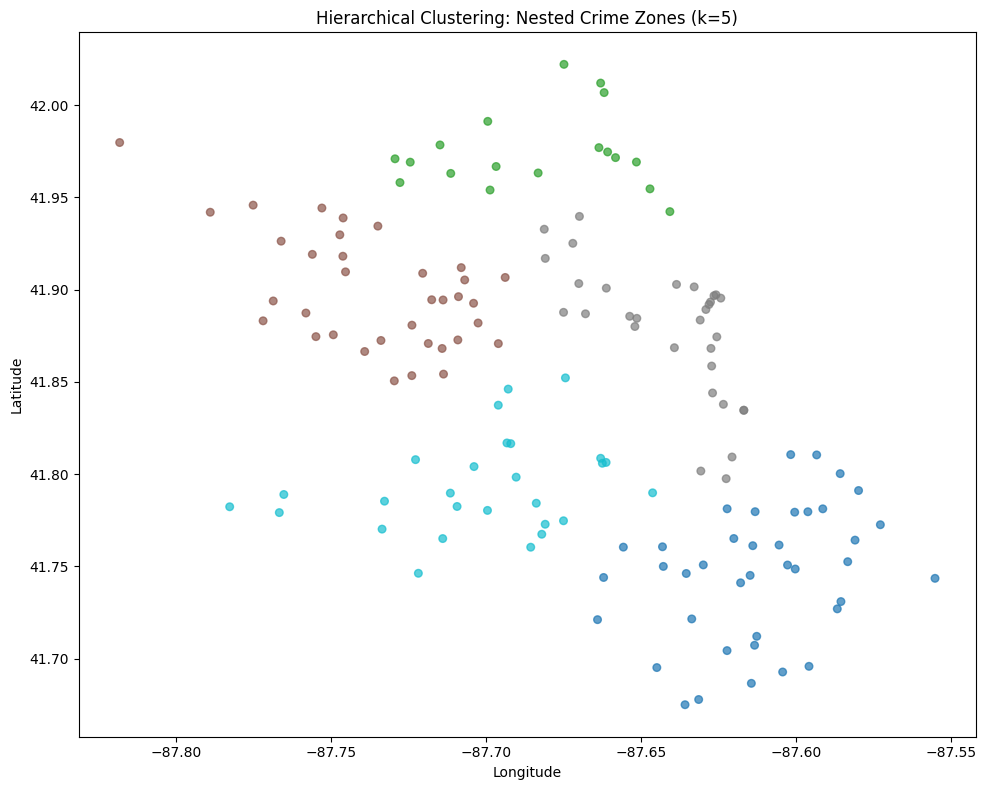

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.preprocessing import StandardScaler

# ------------------ 1. Load and Prepare Data ------------------
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# ------------------ 2. Sample and Normalize ------------------
X = df[['latitude', 'longitude']]
X_sample = X.sample(n=150, random_state=42)  # Small sample for dendrogram clarity
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)

# ------------------ 3. Perform Hierarchical Clustering ------------------
Z = linkage(X_scaled, method='ward')

# ------------------ 4. Plot Dendrogram ------------------
plt.figure(figsize=(12, 6))
dendrogram(Z)
plt.title('Hierarchical Clustering of Crime Zones')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

# ------------------ 5. Extract Flat Clusters ------------------
cluster_labels = fcluster(Z, t=5, criterion='maxclust')
X_sample['cluster'] = cluster_labels

# ------------------ 6. Visualize Clusters ------------------
plt.figure(figsize=(10, 8))
plt.scatter(X_sample['longitude'], X_sample['latitude'], c=X_sample['cluster'], cmap='tab10', s=30, alpha=0.7)
plt.title("Hierarchical Clustering: Nested Crime Zones (k=5)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.tight_layout()
plt.show()

In [ ]:
#Temporal Feature Extraction
def extract_temporal_features(df):
    df['datetime'] = pd.to_datetime(df['date'])
    df['hour'] = df['datetime'].dt.hour
    df['dayofweek'] = df['datetime'].dt.dayofweek  # 0 = Monday, 6 = Sunday
    df['month'] = df['datetime'].dt.month
    return df
df = extract_temporal_features(df)

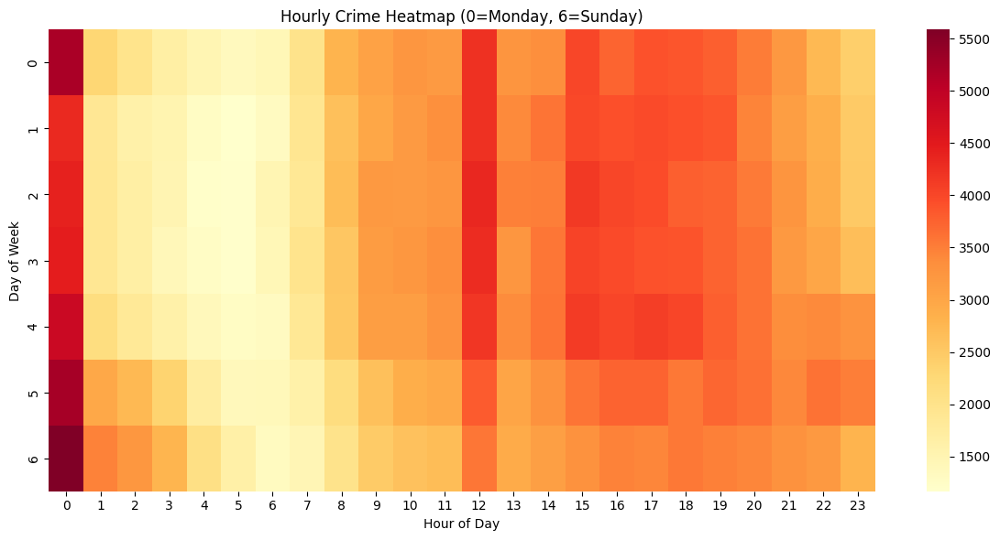

In [ ]:

#Hourly Crime Heatmap

def plot_hourly_heatmap(df):
    heatmap_data = df.groupby(['dayofweek', 'hour']).size().unstack(fill_value=0)
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, cmap='YlOrRd')
    plt.title("Hourly Crime Heatmap (0=Monday, 6=Sunday)")
    plt.xlabel("Hour of Day")
    plt.ylabel("Day of Week")
    plt.tight_layout()
    plt.show()

plot_hourly_heatmap(df)



In [ ]:
#Temporal Pattern Clustering: with 500k data 
#K-Means on temporal features (hour, day, month)
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler



In [ ]:

# Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['hour', 'weekday', 'month'])


In [ ]:
# Select temporal features
# Map weekday names to numeric codes
weekday_map = {
    'Monday': 0, 'Tuesday': 1, 'Wednesday': 2,
    'Thursday': 3, 'Friday': 4, 'Saturday': 5, 'Sunday': 6
}
df['weekday'] = df['weekday'].map(weekday_map)
X_time = df[['hour', 'weekday', 'month']]
X_scaled = StandardScaler().fit_transform(X_time)


In [ ]:
# Apply K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
df['time_cluster'] = kmeans.fit_predict(X_scaled)


In [ ]:
# Add Cluster 4 interpretation
cluster_labels = {
    0: 'Late-night weekend crimes',
    1: 'Weekday rush-hour incidents',
    2: 'Seasonal spikes',
    3: 'Low-activity mornings',
}
df['cluster_label'] = df['time_cluster'].map(cluster_labels)

# Filter for clusters 0–4
df_filtered = df[df['time_cluster'].isin([0, 1, 2, 3])]


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_25304\3208018303.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster_label', y='hour', data=df_filtered, palette='Set2')


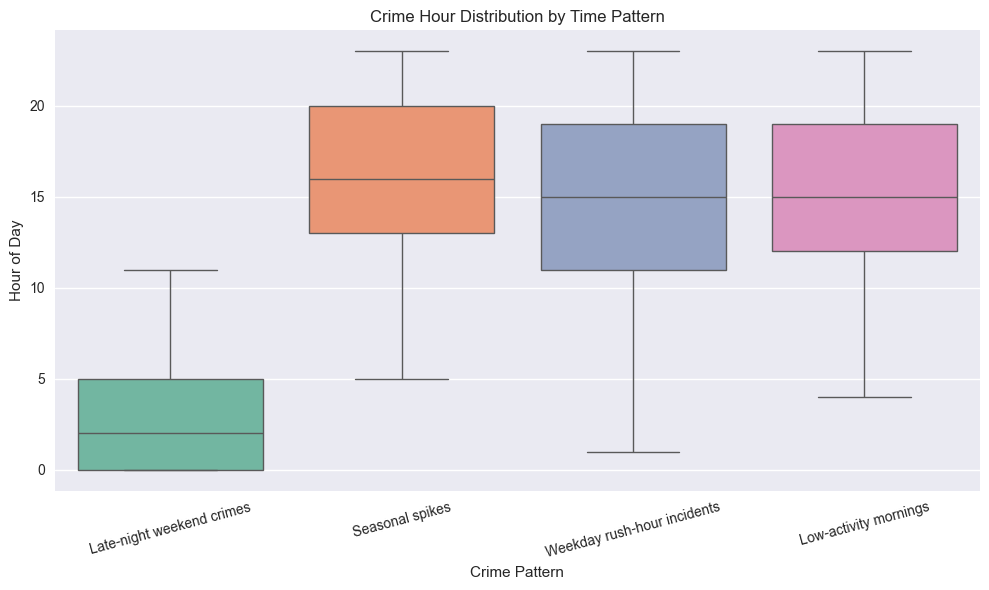

C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_25304\3208018303.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster_label', y='weekday', data=df_filtered, palette='Set2')


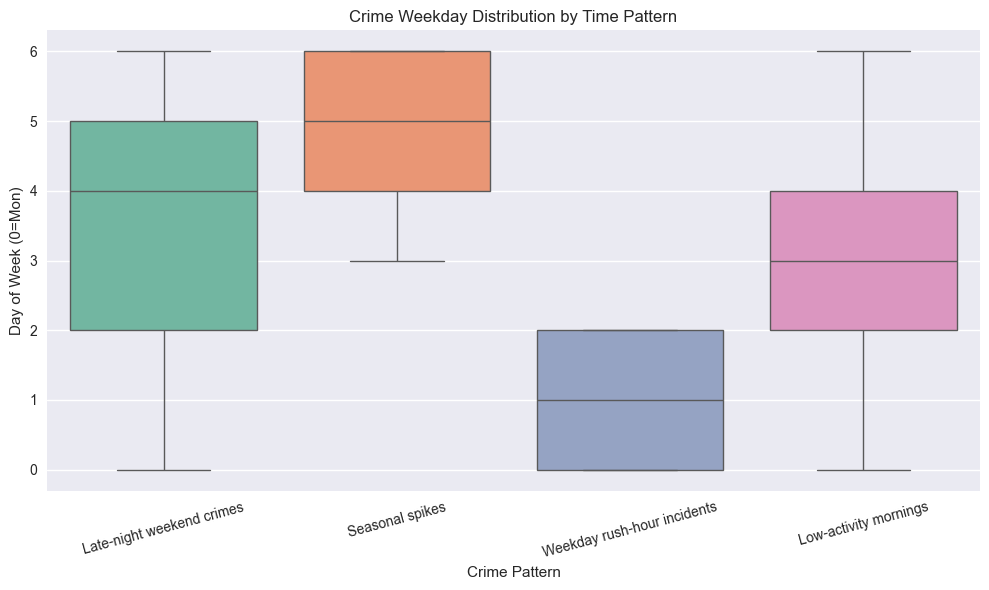

C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_25304\3208018303.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='cluster_label', y='month', data=df_filtered, palette='Set2')


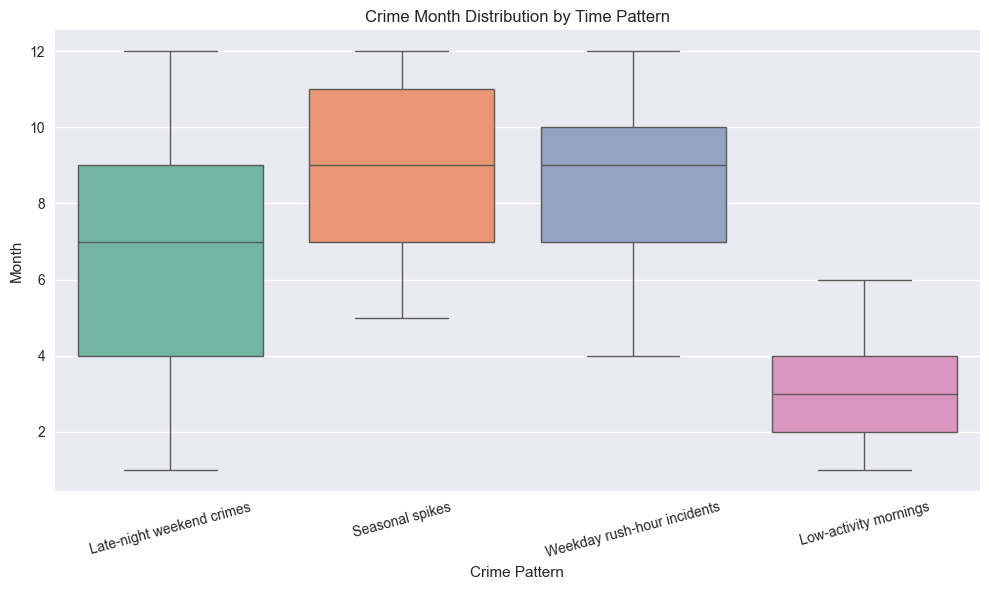

In [ ]:
# Hour distribution
plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='hour', data=df_filtered, palette='Set2')
plt.title('Crime Hour Distribution by Time Pattern')
plt.xlabel('Crime Pattern')
plt.ylabel('Hour of Day')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

# Weekday distribution
plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='weekday', data=df_filtered, palette='Set2')
plt.title('Crime Weekday Distribution by Time Pattern')
plt.xlabel('Crime Pattern')
plt.ylabel('Day of Week (0=Mon)')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

# Month distribution
plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='month', data=df_filtered, palette='Set2')
plt.title('Crime Month Distribution by Time Pattern')
plt.xlabel('Crime Pattern')
plt.ylabel('Month')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()


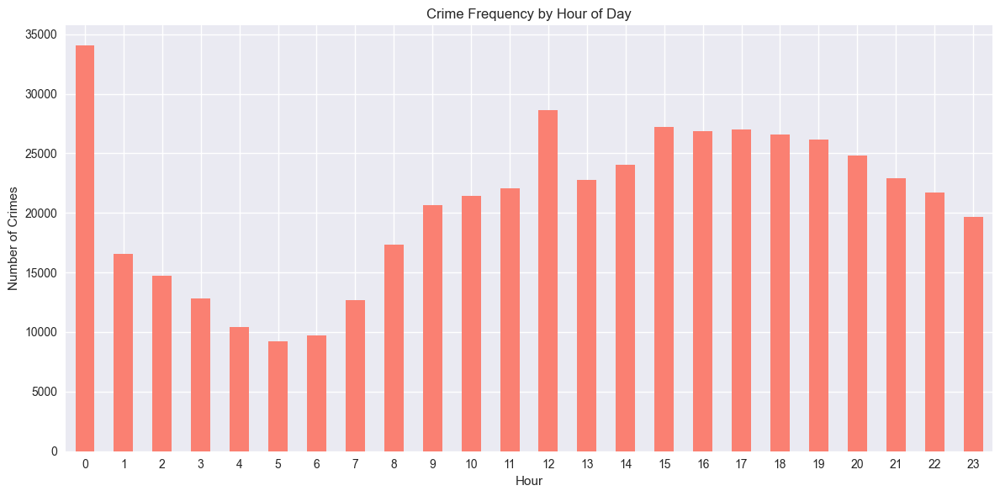

C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_25304\793199297.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='weekday_name', data=df, order=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], palette='coolwarm')


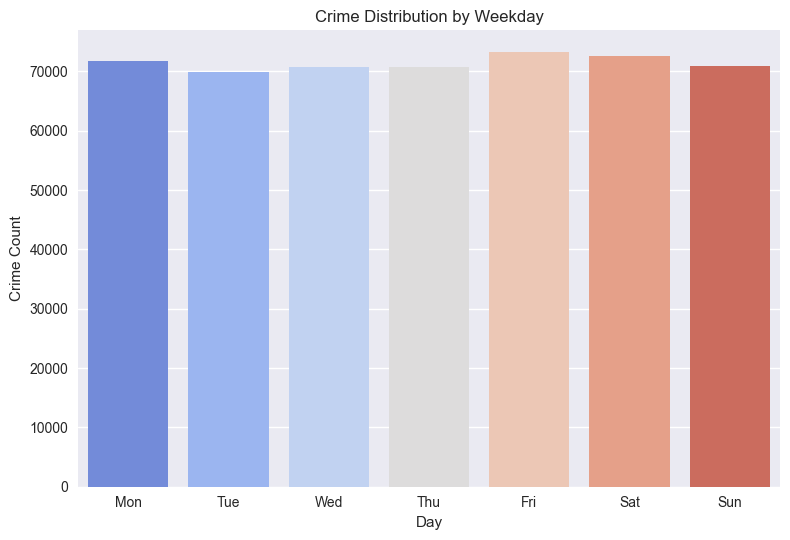

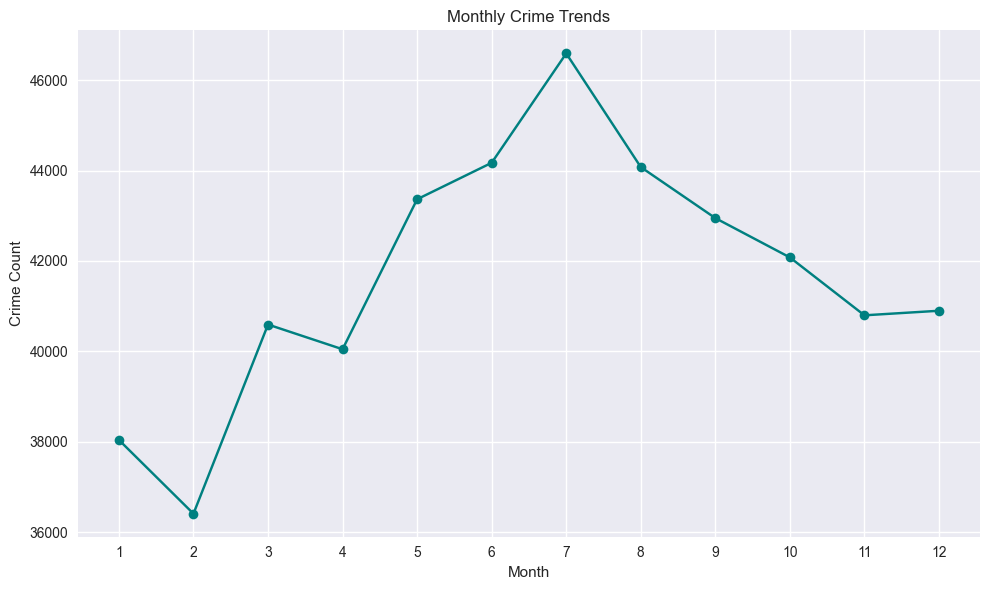

In [ ]:
#Identify peak crime time periods and seasonal patterns

#Hourly Crime Heatmap
hourly_counts = df['hour'].value_counts().sort_index()
hourly_counts.plot(kind='bar', figsize=(12, 6), color='salmon')
plt.title('Crime Frequency by Hour of Day')
plt.xlabel('Hour')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


#Weekday Crime Distribution
weekday_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
df['weekday_name'] = df['weekday'].map(weekday_map)
sns.countplot(x='weekday_name', data=df, order=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], palette='coolwarm')
plt.title('Crime Distribution by Weekday')
plt.xlabel('Day')
plt.ylabel('Crime Count')
plt.tight_layout()
plt.show()


#Monthly Crime Trends
monthly_counts = df['month'].value_counts().sort_index()
monthly_counts.plot(kind='line', marker='o', figsize=(10, 6), color='teal')
plt.title('Monthly Crime Trends')
plt.xlabel('Month')
plt.ylabel('Crime Count')
plt.xticks(range(1, 13))
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#Group similar time-based crime behaviors

#Calculate the average hour, weekday, and month for each primary_type

crime_profiles = df.groupby('primary_type')[['hour', 'weekday', 'month']].mean().reset_index()

In [ ]:
#Standardize the Features
from sklearn.preprocessing import StandardScaler
X_scaled = StandardScaler().fit_transform(crime_profiles[['hour', 'weekday', 'month']])

In [ ]:
#Apply K-Means Clustering
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, random_state=42)
crime_profiles['time_behavior_cluster'] = kmeans.fit_predict(X_scaled)

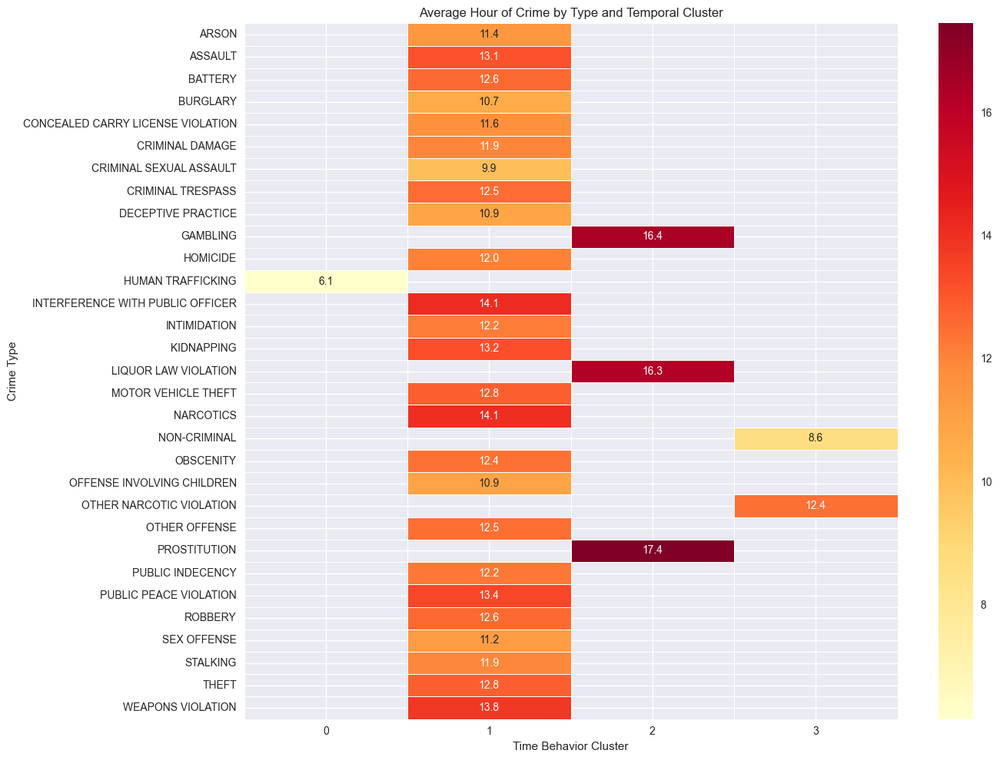

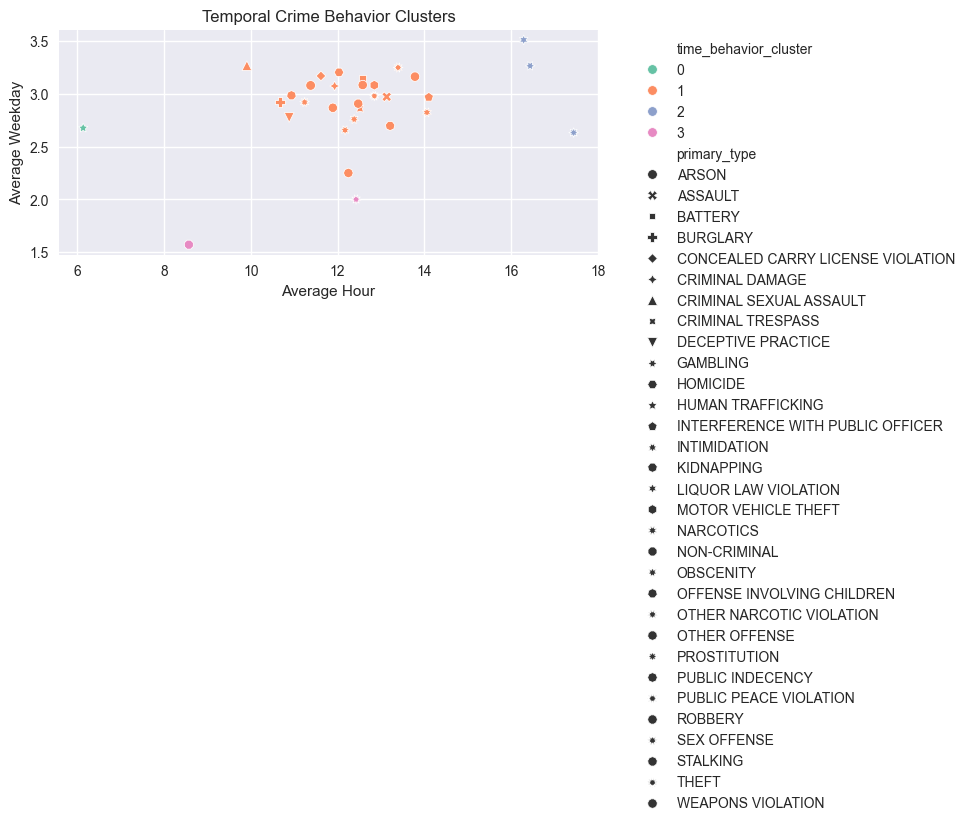

In [ ]:
# Visualize Clustered Crime Profiles

#Heat map

# Pivot table: rows = crime types, columns = cluster, values = average hour
heatmap_data = crime_profiles.pivot_table(
    index='primary_type',
    columns='time_behavior_cluster',
    values='hour'
)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title('Average Hour of Crime by Type and Temporal Cluster')
plt.xlabel('Time Behavior Cluster')
plt.ylabel('Crime Type')
plt.tight_layout()
plt.show()

# scatter plot 

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.scatterplot(data=crime_profiles, x='hour', y='weekday', hue='time_behavior_cluster', style='primary_type', palette='Set2')
plt.title('Temporal Crime Behavior Clusters')
plt.xlabel('Average Hour')
plt.ylabel('Average Weekday')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
#--------------------------------------------------------------------------------------------------

In [177]:
# 5 .Unsupervised Learning - Dimensionality Reduction with 500k data 

#PCA (Principal Component Analysis) for feature reduction and variance explanation

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
print(df.columns.tolist())


['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description', 'location_description', 'arrest', 'domestic', 'beat', 'district', 'ward', 'community_area', 'fbi_code', 'x_coordinate', 'y_coordinate', 'latitude', 'longitude', 'location', 'year', 'updated_on', 'primary_type_encoded', 'location_description_encoded', 'district_encoded', 'hour', 'weekday', 'month', 'cluster_5', 'cluster_8', 'cluster_10']


In [178]:
# Load dataset
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")

# Select numerical features (exclude identifiers and labels)
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])


In [ ]:
# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# Apply PCA
# Fit PCA without limiting components first
pca = PCA()
pca.fit(X_scaled)

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

print("Explained variance per component:", explained_variance)
print("Cumulative variance:", cumulative_variance)


Explained variance per component: [3.94915078e-01 1.08928898e-01 9.88633385e-02 8.20152172e-02
 7.30429314e-02 6.93504600e-02 6.15296650e-02 4.40044941e-02
 2.79785499e-02 2.41022490e-02 1.52558534e-02 1.32026922e-05
 6.06230752e-08 1.43441852e-09]
Cumulative variance: [0.39491508 0.50384398 0.60270732 0.68472253 0.75776546 0.82711592
 0.88864559 0.93265008 0.96062863 0.98473088 0.99998674 0.99999994
 1.         1.        ]


In [182]:
# Reduce to chosen number of components
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

# Add PCA components back to dataframe
for i in range(n_components):
    df[f'PC{i+1}'] = X_pca[:, i]

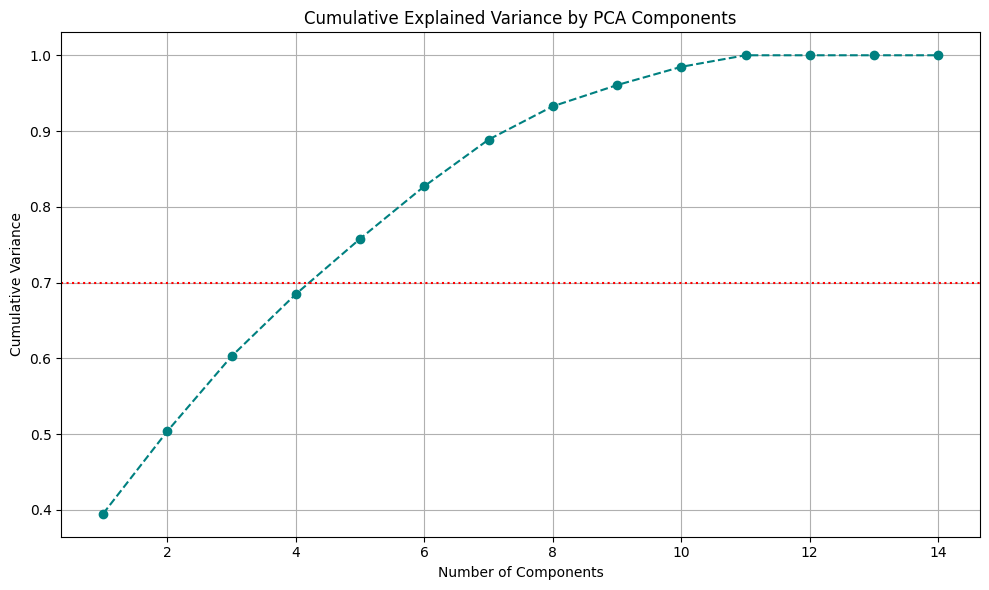

In [183]:
# Plot explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o', linestyle='--', color='teal')
plt.axhline(y=0.70, color='red', linestyle=':')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')
plt.grid(True)
plt.tight_layout()
plt.show()



In [184]:
# Number of components for 70%+ variance
import numpy as np
n_components_70 = np.argmax(cumulative_variance >= 0.70) + 1
print(f"Components needed for 70%+ variance: {n_components_70}")



Components needed for 70%+ variance: 5


In [186]:
# Top 5 contributing features
# Correct loadings DataFrame
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=features.columns
)

# Top 5 contributing features overall
top_features = loadings.abs().sum(axis=1).sort_values(ascending=False).head(5)
print("Top 5 features driving crime patterns:")
print(top_features)

Top 5 features driving crime patterns:
district_encoded    1.207946
longitude           1.189633
x_coordinate        1.183824
beat                1.078424
district            1.078294
dtype: float64


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_22564\2500667507.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_features.values, y=top_features.index, palette="viridis", ax=ax)


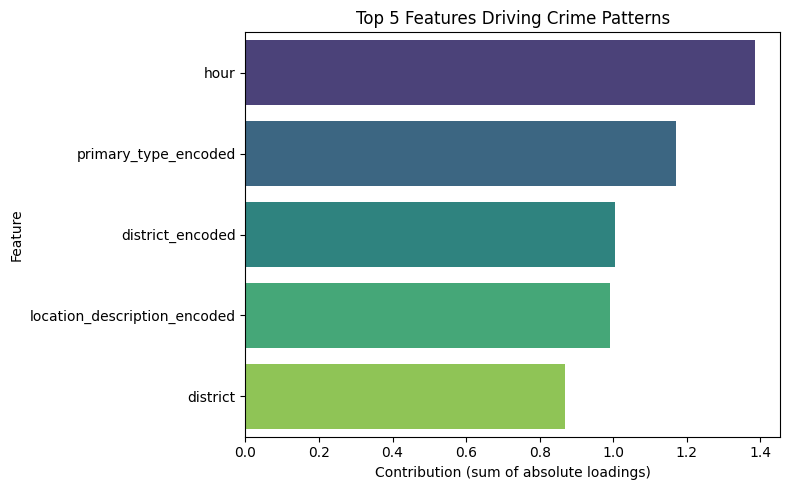

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Top 5 contributing features overall
top_features = loadings.abs().sum(axis=1).sort_values(ascending=False).head(5)

# Plot as horizontal bar chart
fig, ax = plt.subplots(figsize=(8, 5))
sns.barplot(x=top_features.values, y=top_features.index, palette="viridis", ax=ax)

ax.set_title("Top 5 Features Driving Crime Patterns")
ax.set_xlabel("Contribution (sum of absolute loadings)")
ax.set_ylabel("Feature")
plt.tight_layout()
plt.show()

In [187]:
#t-SNE or UMAP for 2D visualization of high-dimensional crime patterns

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")

# Sample 10K rows for speed
df_sampled = df.sample(n=10000, random_state=42)

# Drop non-numeric columns
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df_sampled.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# Apply PCA to reduce to 10 dimensions
pca = PCA(n_components=10, random_state=42)
X_pca = pca.fit_transform(X_scaled)


c:\Users\Akshiya George\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


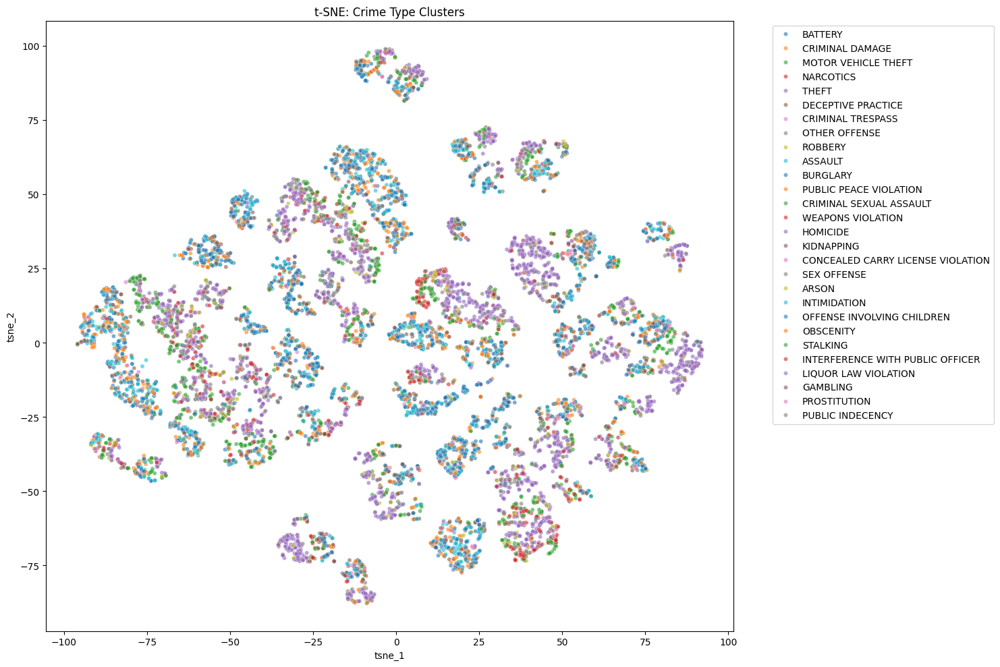

In [ ]:
# t-SNE Visualization - 2D with Visualize separation between different crime types and geographic zones

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_pca)
df_sampled['tsne_1'] = X_tsne[:, 0]
df_sampled['tsne_2'] = X_tsne[:, 1]


plt.figure(figsize=(15, 10))
sns.scatterplot(
    data=df_sampled, x='tsne_1', y='tsne_2',
    hue='primary_type', palette='tab10', alpha=0.6, s=20
)
plt.title('t-SNE: Crime Type Clusters')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # move legend outside
plt.tight_layout()
plt.show()



c:\Users\Akshiya George\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


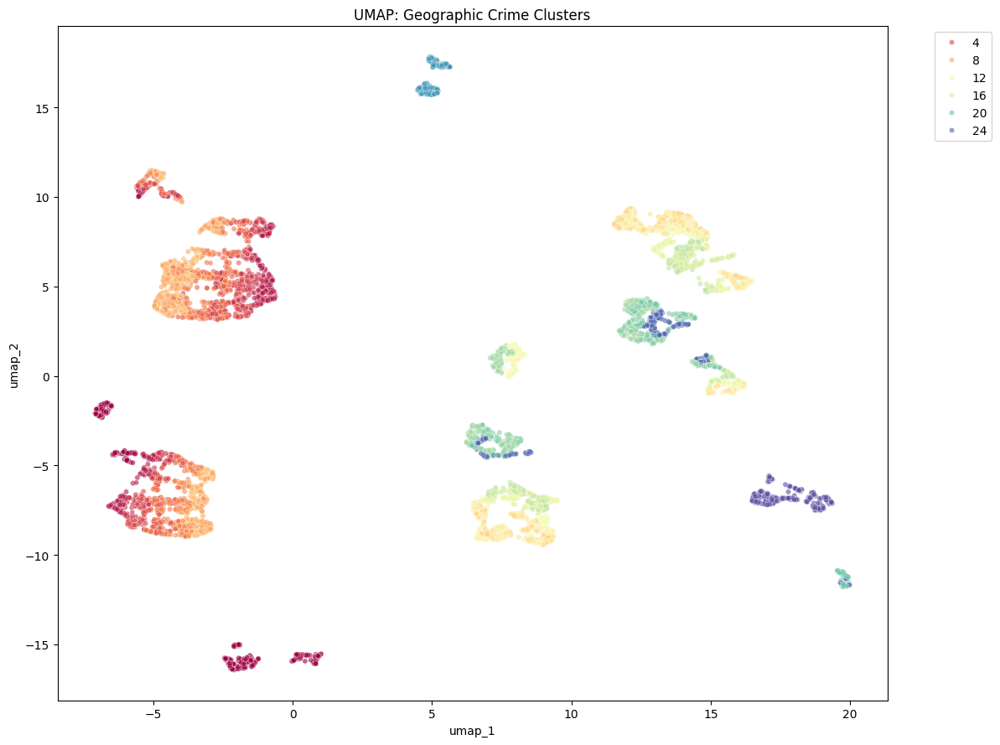

In [192]:
# UMAP Visualization
umap_model = umap.UMAP(n_components=2, random_state=42, n_neighbors=15)
X_umap = umap_model.fit_transform(X_pca)
df_sampled['umap_1'] = X_umap[:, 0]
df_sampled['umap_2'] = X_umap[:, 1]

plt.figure(figsize=(12, 9))
sns.scatterplot(
    data=df_sampled, x='umap_1', y='umap_2',
    hue='district', palette='Spectral', alpha=0.6, s=20
)
plt.title('UMAP: Geographic Crime Clusters')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



In [193]:
#Reduce 22+ features to 2–3 principal components

#Select Relevant Features

exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

In [194]:
# Standardize the Data
from sklearn.preprocessing import StandardScaler
X_scaled = StandardScaler().fit_transform(features)


In [195]:
#Apply PCA

from sklearn.decomposition import PCA
pca = PCA(n_components=7)
X_pca = pca.fit_transform(X_scaled)
print(pca.explained_variance_ratio_.cumsum()[-1])

0.8886455888093598


In [ ]:
# **** Check Explained Variance - 70–80% of original data variance in reduced dimensions ****
# This is better than expected —  retaining more information in fewer dimensions.

explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()
print(f"Explained variance by 3 components: {cumulative_variance[-1]:.2%}")

Explained variance by 3 components: 88.86%


Explained variance by 7 components: 88.86%
Top 5 features driving PCA components:
primary_type_encoded            1.840764
location_description_encoded    1.742232
hour                            1.678385
district_encoded                1.484003
longitude                       1.391998
dtype: float64


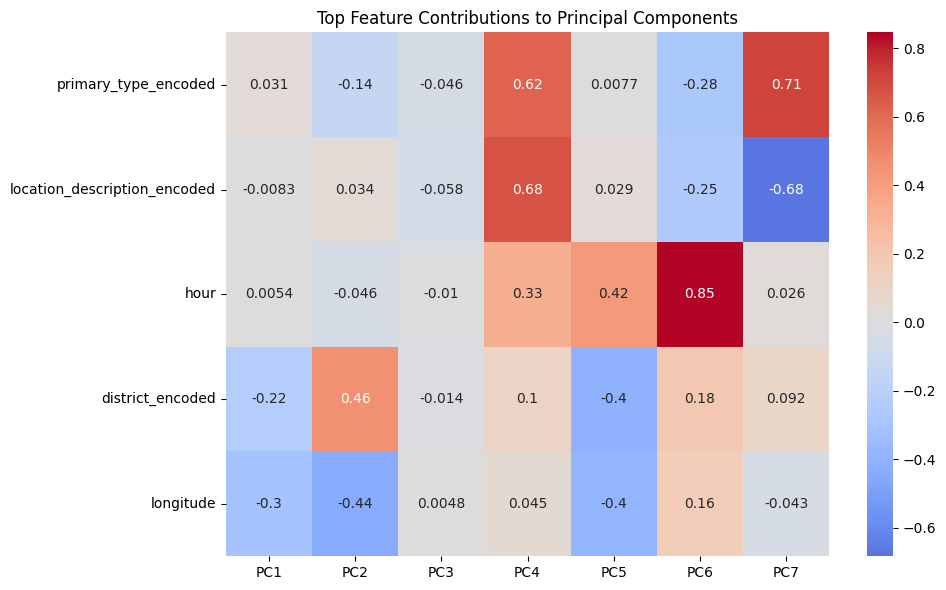

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")

# Drop non-numeric columns
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# Apply PCA with 7 components (adjustable)
pca = PCA(n_components=7)
X_pca = pca.fit_transform(X_scaled)

# Explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()
print(f"Explained variance by 7 components: {cumulative_variance[-1]:.2%}")

# Dynamically generate component labels
component_labels = [f'PC{i+1}' for i in range(pca.n_components_)]
loadings = pd.DataFrame(pca.components_.T, columns=component_labels, index=features.columns)

# Top 5 contributing features across all components
top_features = loadings.abs().sum(axis=1).sort_values(ascending=False).head(5)
print("Top 5 features driving PCA components:")
print(top_features)

# Heatmap of top feature contributions
plt.figure(figsize=(10, 6))
sns.heatmap(loadings.loc[top_features.index], annot=True, cmap='coolwarm', center=0)
plt.title('Top Feature Contributions to Principal Components')
plt.tight_layout()
plt.show()

In [199]:
# Visualize crime clusters in lower-dimensional space

# Prepare the Data
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

In [200]:
# Standardize and Apply PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X_scaled = StandardScaler().fit_transform(features)
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['primary_type'] = df['primary_type']

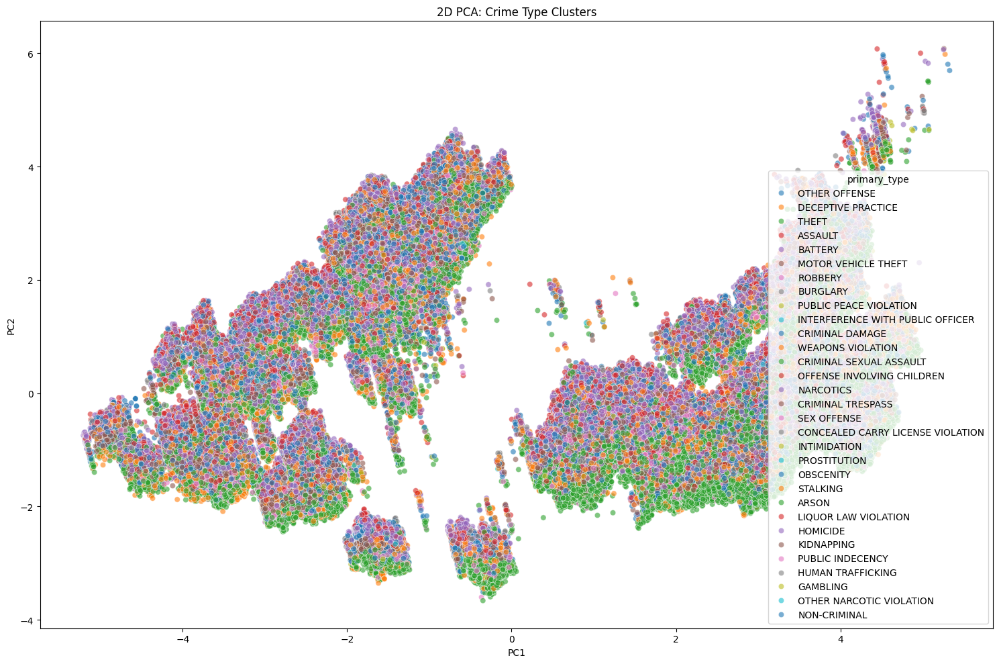

In [201]:
# 2D Interactive Plot (Plotly)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 10))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='primary_type', palette='tab10', alpha=0.6)
plt.title('2D PCA: Crime Type Clusters')
plt.tight_layout()
plt.show()


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_13036\2891581380.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab20', len(unique_types))


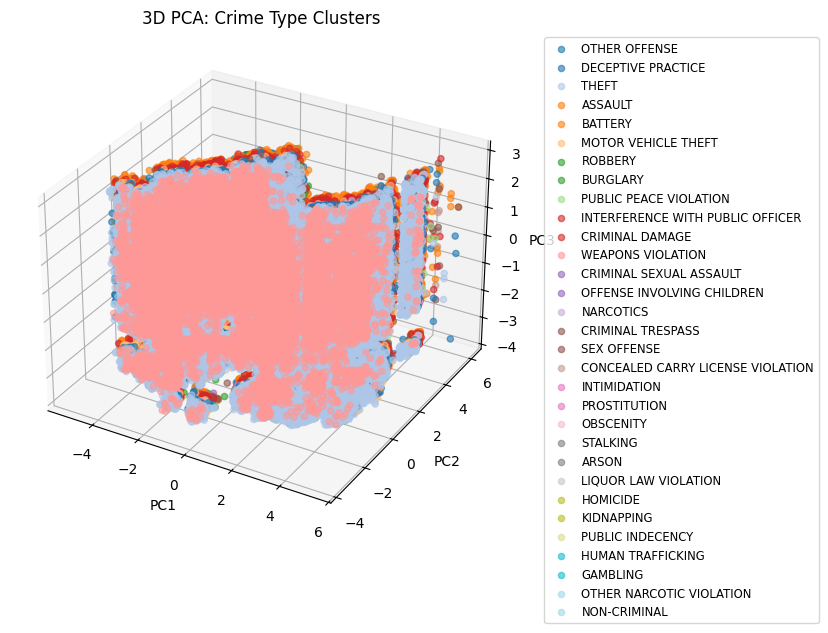

In [204]:
# 3D Interactive Plot (Plotly)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create 3D scatter plot using PC1, PC2, PC3
fig = plt.figure(figsize=(8, 7))
ax = fig.add_subplot(111, projection='3d')

# Map crime types to colors
crime_types = df_pca['primary_type'].astype(str)
unique_types = crime_types.unique()
colors = plt.cm.get_cmap('tab20', len(unique_types))

for i, crime in enumerate(unique_types):
    subset = df_pca[crime_types == crime]
    ax.scatter(subset['PC1'], subset['PC2'], subset['PC3'],
               label=crime, alpha=0.6, s=20, color=colors(i))

ax.set_title('3D PCA: Crime Type Clusters')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.tight_layout()
plt.show()

Explained variance by 7 components: 88.86%
Top 10 features driving crime patterns:
primary_type_encoded            1.840764
location_description_encoded    1.742232
hour                            1.678385
district_encoded                1.484003
longitude                       1.391998
x_coordinate                    1.384576
beat                            1.250605
district                        1.250082
community_area                  0.991903
month                           0.841085
dtype: float64


C:\Users\Akshiya George\AppData\Local\Temp\ipykernel_27048\2984064993.py:44: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




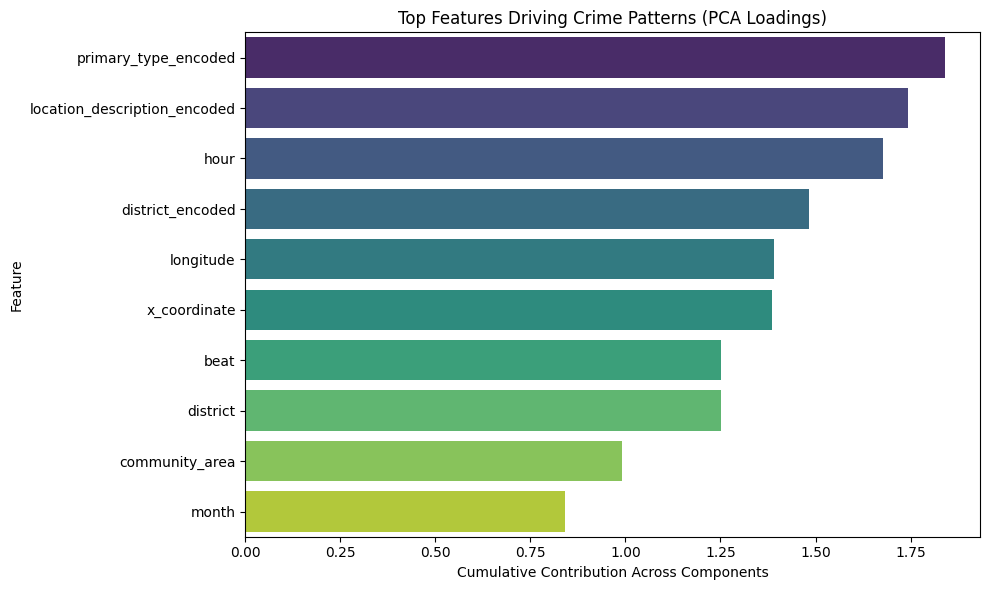

In [ ]:
# Identify most important features driving crime patterns

# Import libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")

# Drop irrelevant columns
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# Apply PCA with 7 components
pca = PCA(n_components=7)
X_pca = pca.fit_transform(X_scaled)

# Explained variance
explained_variance = pca.explained_variance_ratio_
print(f"Explained variance by 7 components: {explained_variance.sum():.2%}")

# Create loadings DataFrame
component_labels = [f'PC{i+1}' for i in range(pca.n_components_)]
loadings = pd.DataFrame(pca.components_.T, columns=component_labels, index=features.columns)

# Rank features by cumulative contribution
feature_importance = loadings.abs().sum(axis=1).sort_values(ascending=False)

# Display top 10 features
print("Top 10 features driving crime patterns:")
print(feature_importance.head(10))

# Visualize as horizontal bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance.head(10), y=feature_importance.head(10).index, palette='viridis')
plt.title('Top Features Driving Crime Patterns (PCA Loadings)')
plt.xlabel('Cumulative Contribution Across Components')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

In [ ]:
#---------------------------------------------------------------------------------------------------

In [1]:
#Step 1 : Configure MLflow Tracking Server
import mlflow

mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment("Crime Clustering Experiments")

2025/11/18 22:46:40 INFO mlflow.tracking.fluent: Experiment with name 'Crime Clustering Experiments' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/960592133619495839', creation_time=1763486200859, experiment_id='960592133619495839', last_update_time=1763486200859, lifecycle_stage='active', name='Crime Clustering Experiments', tags={}>

In [2]:
# Step 2: Log Clustering Parameters_Bestresult

params_kmeans = {
    "algorithm": "KMeans",
    "k": 2
}

params_dbscan = {
    "algorithm": "DBSCAN",
    "eps": 0.001,
    "min_samples": 20
}

params_hier = {
    "algorithm": "AgglomerativeClustering",
    "k": 2,
    "linkage": "ward"
}


In [3]:
# Step 3: Track Dimensionality Reduction Metrics (PCA)
import mlflow
import mlflow.sklearn
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- Load dataset ---
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")

# --- Select numerical features ---
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name']
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

# --- Standardize features ---
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features)

# --- Fit PCA without limiting components ---
pca_full = PCA()
pca_full.fit(X_scaled)

explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# --- Determine components for 70%+ variance ---
n_components_70 = np.argmax(cumulative_variance >= 0.70) + 1
print(f"Components needed for 70%+ variance: {n_components_70}")

# --- Fit PCA with optimal components ---
pca = PCA(n_components=n_components_70)
X_pca = pca.fit_transform(X_scaled)

# --- Add PCA components to dataframe ---
for i in range(n_components_70):
    df[f'PC{i+1}'] = X_pca[:, i]

# --- Compute reconstruction error ---
recon_error = ((X_scaled - pca.inverse_transform(X_pca))**2).mean()

# --- Compute top contributing features ---
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)],
    index=features.columns
)
top_features = loadings.abs().sum(axis=1).sort_values(ascending=False).head(5)

# --- Log to MLflow ---
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name=f"PCA (n={n_components_70})"):
    mlflow.log_param("n_components", n_components_70)
    mlflow.log_metric("explained_variance", pca.explained_variance_ratio_.sum())
    mlflow.log_metric("reconstruction_error", recon_error)
    mlflow.log_dict(top_features.to_dict(), "top_features.json")
    mlflow.sklearn.log_model(pca, "pca_model")

print("✅ PCA metrics and model logged to MLflow.")

Components needed for 70%+ variance: 5


2025/11/18 22:47:18 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 22:47:18 WARNING mlflow.sklearn: Model was missing function: predict. Not logging python_function flavor!
2025/11/18 22:47:26 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run PCA (n=5) at: http://localhost:5000/#/experiments/960592133619495839/runs/6683bb6cdf574e449b8e8796a1b02981
🧪 View experiment at: http://localhost:5000/#/experiments/960592133619495839
✅ PCA metrics and model logged to MLflow.


In [4]:
#Step 4: Compare Algorithm Performances
from sklearn.metrics import silhouette_score, davies_bouldin_score

def log_clustering_run(run_name, model, X, labels, params):
    with mlflow.start_run(run_name=run_name) as run:
        mlflow.log_params(params)
        sil = silhouette_score(X, labels)
        dbi = davies_bouldin_score(X, labels)
        print(f"[DEBUG] {run_name} → Silhouette={sil:.3f}, DBI={dbi:.3f}, n_samples={X.shape[0]}")
        mlflow.log_metric("silhouette", sil)
        mlflow.log_metric("dbi", dbi)
        mlflow.sklearn.log_model(model, run_name.replace(" ", "_").lower())
        return run.info.run_id, sil


In [5]:
# Step 5: Select Best Model Based on Scores
best_score = -1
best_model_uri = None
best_model_name = None



KMeans (k=2, full data) → Silhouette=0.449, DBI=0.828
DBSCAN (eps=0.001, min_samples=20, sample) → Silhouette=0.992, DBI=0.011
Hierarchical (Ward, k=2, sample) → Silhouette=0.430, DBI=0.894


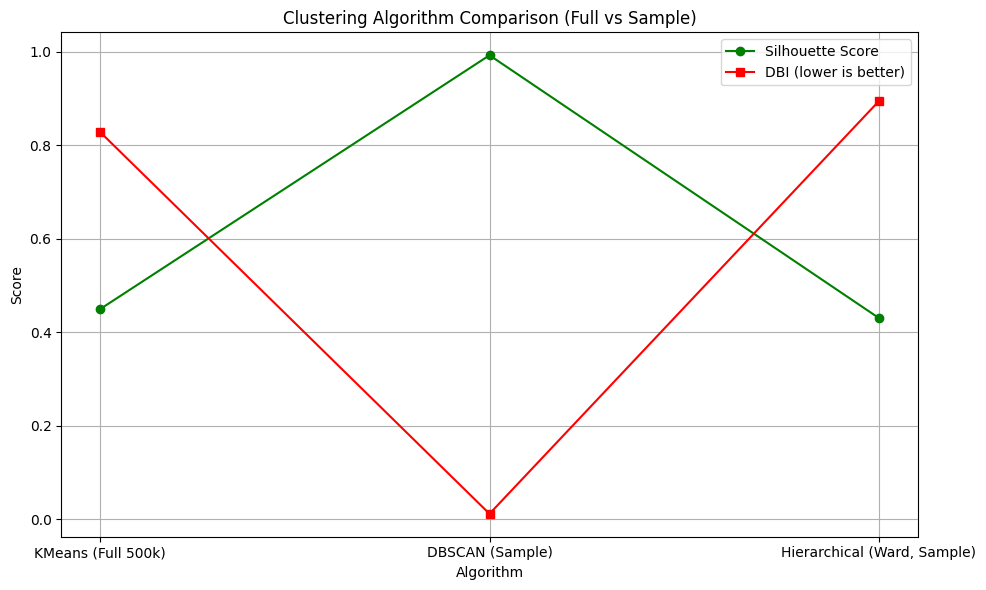

In [1]:
# Step 6: Run Clustering Algorithms and Track
#******************************** Clustering Evaluation with Systematic Sampling *************************

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# 2. Systematic sampling (~50k evenly spread samples) for DBSCAN & Hierarchical
df_sample = df.iloc[::10, :].copy()
X_sample = df_sample[['latitude', 'longitude']].values
scaler_sample = StandardScaler()
X_scaled_sample = scaler_sample.fit_transform(X_sample)

# 3. Full dataset for KMeans
X_full = df[['latitude', 'longitude']].values
scaler_full = StandardScaler()
X_scaled_full = scaler_full.fit_transform(X_full)

# 4. Best parameters
params_kmeans = {"algorithm": "KMeans", "k": 2}
params_dbscan = {"algorithm": "DBSCAN", "eps": 0.001, "min_samples": 20}
params_hier = {"algorithm": "AgglomerativeClustering", "k": 2, "linkage": "ward"}

results = []

# --- KMeans on full dataset ---
kmeans = KMeans(n_clusters=params_kmeans["k"], random_state=42)
labels_kmeans = kmeans.fit_predict(X_scaled_full)
sil_kmeans = silhouette_score(X_scaled_full, labels_kmeans)
dbi_kmeans = davies_bouldin_score(X_scaled_full, labels_kmeans)
results.append(("KMeans (Full 500k)", params_kmeans["k"], sil_kmeans, dbi_kmeans))
print(f"KMeans (k=2, full data) → Silhouette={sil_kmeans:.3f}, DBI={dbi_kmeans:.3f}")

# --- DBSCAN on sample ---
dbscan = DBSCAN(eps=params_dbscan["eps"], min_samples=params_dbscan["min_samples"])
labels_dbscan = dbscan.fit_predict(X_scaled_sample)
core_mask = labels_dbscan != -1
if core_mask.sum() > 0:
    sil_dbscan = silhouette_score(X_scaled_sample[core_mask], labels_dbscan[core_mask])
    dbi_dbscan = davies_bouldin_score(X_scaled_sample[core_mask], labels_dbscan[core_mask])
    results.append(("DBSCAN (Sample)", f"eps={params_dbscan['eps']}, min_samples={params_dbscan['min_samples']}", sil_dbscan, dbi_dbscan))
    print(f"DBSCAN (eps=0.001, min_samples=20, sample) → Silhouette={sil_dbscan:.3f}, DBI={dbi_dbscan:.3f}")
else:
    print("DBSCAN produced only noise or one cluster")

# --- Hierarchical (Ward) on sample ---
hier = AgglomerativeClustering(n_clusters=params_hier["k"], linkage=params_hier["linkage"])
labels_hier = hier.fit_predict(X_scaled_sample)
sil_hier = silhouette_score(X_scaled_sample, labels_hier)
dbi_hier = davies_bouldin_score(X_scaled_sample, labels_hier)
results.append(("Hierarchical (Ward, Sample)", params_hier["k"], sil_hier, dbi_hier))
print(f"Hierarchical (Ward, k=2, sample) → Silhouette={sil_hier:.3f}, DBI={dbi_hier:.3f}")

# 5. Convert results into DataFrame
results_df = pd.DataFrame(results, columns=['Algorithm', 'Params', 'Silhouette', 'DBI'])

# 6. Plot comparison
plt.figure(figsize=(10, 6))
plt.plot(results_df['Algorithm'], results_df['Silhouette'], marker='o', color='green', label='Silhouette Score')
plt.plot(results_df['Algorithm'], results_df['DBI'], marker='s', color='red', label='DBI (lower is better)')
plt.title("Clustering Algorithm Comparison (Full vs Sample)")
plt.xlabel("Algorithm")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

KMeans (k=2, full data, raw coords) → Silhouette=0.504, DBI=0.739
DBSCAN (eps=0.001, min_samples=20, sample, scaled) → Silhouette=0.992, DBI=0.011
Hierarchical (Ward, k=2, sample, scaled) → Silhouette=0.430, DBI=0.894


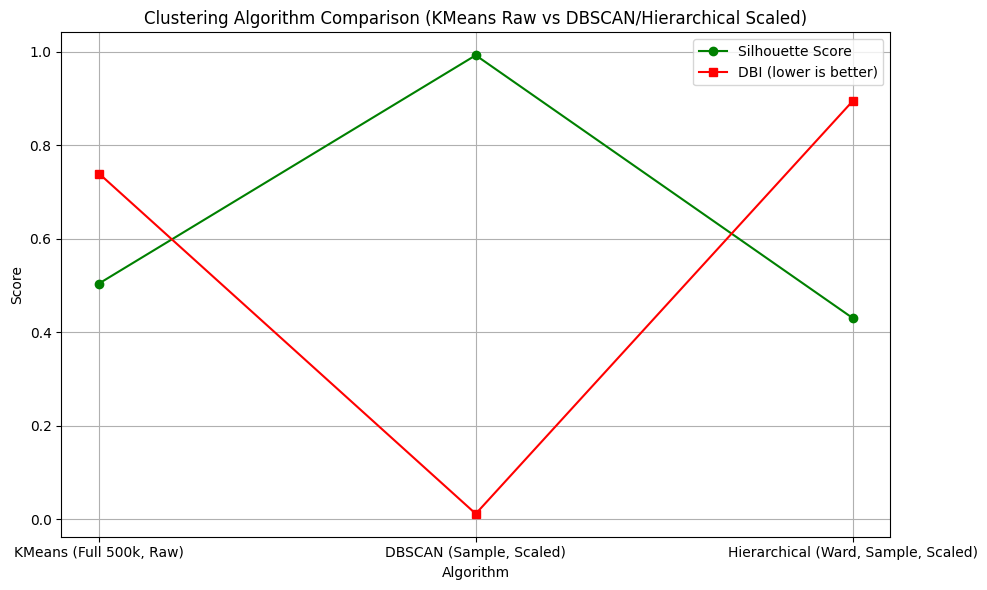

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# 2. Systematic sampling (~50k evenly spread samples) for DBSCAN & Hierarchical
df_sample = df.iloc[::10, :].copy()
X_sample = df_sample[['latitude', 'longitude']].values
scaler_sample = StandardScaler()
X_scaled_sample = scaler_sample.fit_transform(X_sample)

# 3. Full dataset for KMeans (NO SCALING)
X_full = df[['latitude', 'longitude']].values   # raw coordinates

# 4. Best parameters
params_kmeans = {"algorithm": "KMeans", "k": 2}
params_dbscan = {"algorithm": "DBSCAN", "eps": 0.001, "min_samples": 20}
params_hier = {"algorithm": "AgglomerativeClustering", "k": 2, "linkage": "ward"}

results = []

# --- KMeans on full dataset (no scaling) ---
kmeans = KMeans(n_clusters=params_kmeans["k"], random_state=42)
labels_kmeans = kmeans.fit_predict(X_full)
sil_kmeans = silhouette_score(X_full, labels_kmeans)
dbi_kmeans = davies_bouldin_score(X_full, labels_kmeans)
results.append(("KMeans (Full 500k, Raw)", params_kmeans["k"], sil_kmeans, dbi_kmeans))
print(f"KMeans (k=2, full data, raw coords) → Silhouette={sil_kmeans:.3f}, DBI={dbi_kmeans:.3f}")

# --- DBSCAN on scaled sample ---
dbscan = DBSCAN(eps=params_dbscan["eps"], min_samples=params_dbscan["min_samples"])
labels_dbscan = dbscan.fit_predict(X_scaled_sample)
core_mask = labels_dbscan != -1
if core_mask.sum() > 0:
    sil_dbscan = silhouette_score(X_scaled_sample[core_mask], labels_dbscan[core_mask])
    dbi_dbscan = davies_bouldin_score(X_scaled_sample[core_mask], labels_dbscan[core_mask])
    results.append(("DBSCAN (Sample, Scaled)", f"eps={params_dbscan['eps']}, min_samples={params_dbscan['min_samples']}", sil_dbscan, dbi_dbscan))
    print(f"DBSCAN (eps=0.001, min_samples=20, sample, scaled) → Silhouette={sil_dbscan:.3f}, DBI={dbi_dbscan:.3f}")
else:
    print("DBSCAN produced only noise or one cluster")

# --- Hierarchical (Ward) on scaled sample ---
hier = AgglomerativeClustering(n_clusters=params_hier["k"], linkage=params_hier["linkage"])
labels_hier = hier.fit_predict(X_scaled_sample)
sil_hier = silhouette_score(X_scaled_sample, labels_hier)
dbi_hier = davies_bouldin_score(X_scaled_sample, labels_hier)
results.append(("Hierarchical (Ward, Sample, Scaled)", params_hier["k"], sil_hier, dbi_hier))
print(f"Hierarchical (Ward, k=2, sample, scaled) → Silhouette={sil_hier:.3f}, DBI={dbi_hier:.3f}")

# 5. Convert results into DataFrame
results_df = pd.DataFrame(results, columns=['Algorithm', 'Params', 'Silhouette', 'DBI'])

# 6. Plot comparison
plt.figure(figsize=(10, 6))
plt.plot(results_df['Algorithm'], results_df['Silhouette'], marker='o', color='green', label='Silhouette Score')
plt.plot(results_df['Algorithm'], results_df['DBI'], marker='s', color='red', label='DBI (lower is better)')
plt.title("Clustering Algorithm Comparison (KMeans Raw vs DBSCAN/Hierarchical Scaled)")
plt.xlabel("Algorithm")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

KMeans (k=2, scaled sample) → Silhouette=0.450, DBI=0.824
DBSCAN (eps=0.001, min_samples=20, scaled sample) → Silhouette=0.992, DBI=0.011
Hierarchical (Ward, k=2, scaled sample) → Silhouette=0.430, DBI=0.894


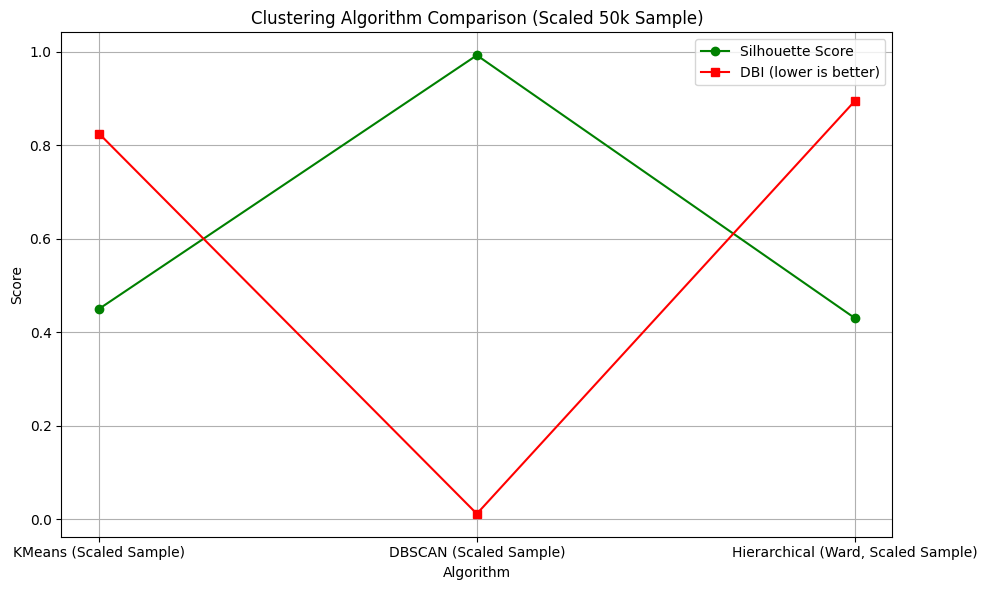

In [6]:
#50k sample for all 3 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler

# 1. Load and prepare data
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
df = df.dropna(subset=['latitude', 'longitude'])

# 2. Systematic sampling (~50k evenly spread samples)
df_sample = df.iloc[::10, :].copy()   # 500k → ~50k
X_sample = df_sample[['latitude', 'longitude']].values

# 3. Scale the sample (important for fair comparison across algorithms)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_sample)

# 4. Parameters
params_kmeans = {"algorithm": "KMeans", "k": 2}
params_dbscan = {"algorithm": "DBSCAN", "eps": 0.001, "min_samples": 20}
params_hier = {"algorithm": "AgglomerativeClustering", "k": 2, "linkage": "ward"}

results = []

# --- KMeans on scaled sample ---
kmeans = KMeans(n_clusters=params_kmeans["k"], random_state=42)
labels_kmeans = kmeans.fit_predict(X_scaled)
sil_kmeans = silhouette_score(X_scaled, labels_kmeans)
dbi_kmeans = davies_bouldin_score(X_scaled, labels_kmeans)
results.append(("KMeans (Scaled Sample)", params_kmeans["k"], sil_kmeans, dbi_kmeans))
print(f"KMeans (k=2, scaled sample) → Silhouette={sil_kmeans:.3f}, DBI={dbi_kmeans:.3f}")

# --- DBSCAN on scaled sample ---
dbscan = DBSCAN(eps=params_dbscan["eps"], min_samples=params_dbscan["min_samples"])
labels_dbscan = dbscan.fit_predict(X_scaled)
core_mask = labels_dbscan != -1
if core_mask.sum() > 0:
    sil_dbscan = silhouette_score(X_scaled[core_mask], labels_dbscan[core_mask])
    dbi_dbscan = davies_bouldin_score(X_scaled[core_mask], labels_dbscan[core_mask])
    results.append(("DBSCAN (Scaled Sample)", f"eps={params_dbscan['eps']}, min_samples={params_dbscan['min_samples']}", sil_dbscan, dbi_dbscan))
    print(f"DBSCAN (eps=0.001, min_samples=20, scaled sample) → Silhouette={sil_dbscan:.3f}, DBI={dbi_dbscan:.3f}")
else:
    print("DBSCAN produced only noise or one cluster")

# --- Hierarchical (Ward) on scaled sample ---
hier = AgglomerativeClustering(n_clusters=params_hier["k"], linkage=params_hier["linkage"])
labels_hier = hier.fit_predict(X_scaled)
sil_hier = silhouette_score(X_scaled, labels_hier)
dbi_hier = davies_bouldin_score(X_scaled, labels_hier)
results.append(("Hierarchical (Ward, Scaled Sample)", params_hier["k"], sil_hier, dbi_hier))
print(f"Hierarchical (Ward, k=2, scaled sample) → Silhouette={sil_hier:.3f}, DBI={dbi_hier:.3f}")

# 5. Convert results into DataFrame
results_df = pd.DataFrame(results, columns=['Algorithm', 'Params', 'Silhouette', 'DBI'])

# 6. Plot comparison
plt.figure(figsize=(10, 6))
plt.plot(results_df['Algorithm'], results_df['Silhouette'], marker='o', color='green', label='Silhouette Score')
plt.plot(results_df['Algorithm'], results_df['DBI'], marker='s', color='red', label='DBI (lower is better)')
plt.title("Clustering Algorithm Comparison (Scaled 50k Sample)")
plt.xlabel("Algorithm")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [7]:
# Step 7: Select Best Model based on Silhouette Score
import mlflow
models_results = {
    "KMeans": {"score": 0.450, "dbi": 0.824, "uri": "runs:/<run_id>/kmeans_model"},
    "DBSCAN": {"score": 0.992, "dbi": 0.011, "uri": "runs:/<run_id>/dbscan_model"},
    "Hierarchical": {"score": 0.430, "dbi": 0.894, "uri": "runs:/<run_id>/hierarchical_model"}
}

# Pick the model with the highest silhouette score
best_model_name = max(models_results, key=lambda m: models_results[m]["score"])
best_score = models_results[best_model_name]["score"]
best_dbi = models_results[best_model_name]["dbi"]
best_model_uri = models_results[best_model_name]["uri"]

print(f"📊 Best model selected: {best_model_name} "
      f"(Silhouette={best_score:.3f}, DBI={best_dbi:.3f})")

📊 Best model selected: DBSCAN (Silhouette=0.992, DBI=0.011)


In [15]:
#Step 7: Register Best Model for Version Control
import mlflow
import mlflow.sklearn

with mlflow.start_run(run_name="DBSCAN_50k_scaled") as run:
    mlflow.sklearn.log_model(dbscan, "dbscan_model")
    run_id = run.info.run_id
    best_model_uri = f"runs:/{run_id}/dbscan_model"
    best_model_name = "DBSCAN"
    best_score = sil_dbscan
    best_dbi = dbi_dbscan


2025/11/18 23:14:28 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 23:14:28 WARNING mlflow.sklearn: Model was missing function: predict. Not logging python_function flavor!
2025/11/18 23:14:32 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run DBSCAN_50k_scaled at: http://localhost:5000/#/experiments/960592133619495839/runs/60f5468fd87440ad94b4f0053b18f3e9
🧪 View experiment at: http://localhost:5000/#/experiments/960592133619495839


In [16]:
# Step 1: Configure MLflow Tracking Server and Experiment
import mlflow
import mlflow.sklearn

mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment("Crime Clustering Experiments")


<Experiment: artifact_location='mlflow-artifacts:/960592133619495839', creation_time=1763486200859, experiment_id='960592133619495839', last_update_time=1763486200859, lifecycle_stage='active', name='Crime Clustering Experiments', tags={}>

In [18]:
# Step 2: Load and prepare data (50k sample for clustering; full feature set for PCA)
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load dataset
df = pd.read_csv(r"C:\Users\Akshiya George\OneDrive\Desktop\Data Science\PatrollQ\Crimes_500K_Cleaned.csv")
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# For clustering (lat/long only, sampled)
df_geo = df.dropna(subset=['latitude', 'longitude'])
df_sample = df_geo.iloc[::10, :].copy()   # 500k → ~50k
X_clust = df_sample[['latitude', 'longitude']].values
scaler_clust = StandardScaler()
X_clust_scaled = scaler_clust.fit_transform(X_clust)

# For PCA (full numeric features, no sampling)
exclude_cols = ['id', 'case_number', 'date', 'block', 'iucr', 'primary_type', 'description',
                'location_description', 'location', 'updated_on', 'cluster_label', 'weekday_name',
                'latitude', 'longitude']  # exclude geo from PCA if not part of feature space
features = df.drop(columns=exclude_cols, errors='ignore').select_dtypes(include=['int64', 'float64'])

scaler_pca = StandardScaler()
X_pca_input = scaler_pca.fit_transform(features)


In [19]:
# Step 3: PCA metrics (explained variance, reconstruction error) + log model in MLflow
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error

# Fit PCA without limiting components to find optimal n_components for 70%+ variance
pca_full = PCA()
pca_full.fit(X_pca_input)
explained_ratio = pca_full.explained_variance_ratio_
cumulative = explained_ratio.cumsum()
n_components_70 = int(np.argmax(cumulative >= 0.70) + 1)

# Fit PCA with optimal components
pca = PCA(n_components=n_components_70, random_state=42)
X_pca = pca.fit_transform(X_pca_input)
X_reconstructed = pca.inverse_transform(X_pca)
explained_variance_total = float(pca.explained_variance_ratio_.sum())
reconstruction_error = float(mean_squared_error(X_pca_input, X_reconstructed))

# Top contributing features by absolute loading sum
loadings = pd.DataFrame(pca.components_.T,
                        columns=[f'PC{i+1}' for i in range(pca.n_components_)],
                        index=features.columns)
top_features = loadings.abs().sum(axis=1).sort_values(ascending=False).head(10).to_dict()

# Log PCA run
if mlflow.active_run():
    mlflow.end_run()

with mlflow.start_run(run_name=f"PCA_n={n_components_70}") as run:
    mlflow.log_param("n_components", n_components_70)
    mlflow.log_metric("explained_variance_total", explained_variance_total)
    mlflow.log_metric("reconstruction_error_mse", reconstruction_error)
    mlflow.log_dict(top_features, "top_features.json")
    mlflow.sklearn.log_model(pca, "pca_model")

print(f"✅ PCA logged: n={n_components_70}, explained_variance={explained_variance_total:.3f}, "
      f"reconstruction_error={reconstruction_error:.6f}")

2025/11/18 23:17:03 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 23:17:03 WARNING mlflow.sklearn: Model was missing function: predict. Not logging python_function flavor!
2025/11/18 23:17:07 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run PCA_n=5 at: http://localhost:5000/#/experiments/960592133619495839/runs/6aa81d2dbaa94fcebfe8730b09f63d67
🧪 View experiment at: http://localhost:5000/#/experiments/960592133619495839
✅ PCA logged: n=5, explained_variance=0.752, reconstruction_error=0.247608


In [20]:
# Step 4: Compare clustering algorithms (KMeans, DBSCAN, Hierarchical) and log runs
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score

def log_clustering_run(run_name, model, X, labels, params):
    if mlflow.active_run():
        mlflow.end_run()
    with mlflow.start_run(run_name=run_name) as run:
        mlflow.log_params(params)
        sil = float(silhouette_score(X, labels))
        dbi = float(davies_bouldin_score(X, labels))
        mlflow.log_metric("silhouette", sil)
        mlflow.log_metric("dbi", dbi)
        artifact_name = run_name.replace(" ", "_").lower() + "_model"
        mlflow.sklearn.log_model(model, artifact_name)
        model_uri = f"runs:/{run.info.run_id}/{artifact_name}"
        return {"algorithm": params.get("algorithm", run_name), "silhouette": sil, "dbi": dbi, "model_uri": model_uri}

results = []

# KMeans
kmeans_params = {"algorithm": "KMeans", "n_clusters": 2, "random_state": 42}
kmeans = KMeans(n_clusters=2, random_state=42)
labels_kmeans = kmeans.fit_predict(X_clust_scaled)
results.append(log_clustering_run("KMeans Clustering", kmeans, X_clust_scaled, labels_kmeans, kmeans_params))

# DBSCAN
dbscan_params = {"algorithm": "DBSCAN", "eps": 0.001, "min_samples": 20}
dbscan = DBSCAN(eps=0.001, min_samples=20)
labels_dbscan = dbscan.fit_predict(X_clust_scaled)
core_mask = labels_dbscan != -1
if core_mask.sum() > 0 and len(np.unique(labels_dbscan[core_mask])) > 1:
    # compute metrics on core points only
    results.append(log_clustering_run("DBSCAN Clustering", dbscan, X_clust_scaled[core_mask],
                                      labels_dbscan[core_mask], dbscan_params))
else:
    print("⚠️ DBSCAN produced only noise or a single cluster; skipping metric logging run.")

# Hierarchical (Ward)
hier_params = {"algorithm": "AgglomerativeClustering", "n_clusters": 2, "linkage": "ward"}
hier = AgglomerativeClustering(n_clusters=2, linkage="ward")
labels_hier = hier.fit_predict(X_clust_scaled)
results.append(log_clustering_run("Hierarchical Clustering", hier, X_clust_scaled, labels_hier, hier_params))

# Create a DataFrame for inspection
results_df = pd.DataFrame(results)
print("Results:\n", results_df)

2025/11/18 23:17:47 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 23:17:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run KMeans Clustering at: http://localhost:5000/#/experiments/960592133619495839/runs/f61e9ffc41164f9281121316a0f1c2ab
🧪 View experiment at: http://localhost:5000/#/experiments/960592133619495839


2025/11/18 23:17:53 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 23:17:53 WARNING mlflow.sklearn: Model was missing function: predict. Not logging python_function flavor!
2025/11/18 23:17:58 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run DBSCAN Clustering at: http://localhost:5000/#/experiments/960592133619495839/runs/f374015fa454489497fcd6f745c83f8d
🧪 View experiment at: http://localhost:5000/#/experiments/960592133619495839


2025/11/18 23:32:19 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.
2025/11/18 23:32:20 WARNING mlflow.sklearn: Model was missing function: predict. Not logging python_function flavor!
2025/11/18 23:32:31 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run Hierarchical Clustering at: http://localhost:5000/#/experiments/960592133619495839/runs/e9df9e2fdc0b4d269261269fd92a26e0
🧪 View experiment at: http://localhost:5000/#/experiments/960592133619495839
Results:
                  algorithm  silhouette       dbi  \
0                   KMeans    0.449589  0.824397   
1                   DBSCAN    0.991977  0.011325   
2  AgglomerativeClustering    0.430136  0.893677   

                                           model_uri  
0  runs:/f61e9ffc41164f9281121316a0f1c2ab/kmeans_...  
1  runs:/f374015fa454489497fcd6f745c83f8d/dbscan_...  
2  runs:/e9df9e2fdc0b4d269261269fd92a26e0/hierarc...  


In [21]:
# Step 5: Select best model (maximize silhouette; optionally combine with DBI)
def combined_score(sil, dbi, alpha=0.7):
    # Higher is better; trade-off between separation (sil) and compactness (1/(1+dbi))
    return alpha * sil + (1 - alpha) * (1.0 / (1.0 + dbi))

if results_df.empty:
    raise ValueError("No clustering results to select from. Ensure at least one algorithm logged a run.")

# Choose selection strategy: 'silhouette' or 'combined'
selection_strategy = 'silhouette'  # change to 'combined' to use the combined score

if selection_strategy == 'silhouette':
    best_idx = results_df['silhouette'].idxmax()
else:
    scores = results_df.apply(lambda r: combined_score(r['silhouette'], r['dbi']), axis=1)
    best_idx = scores.idxmax()

best_row = results_df.loc[best_idx]
best_algorithm = best_row['algorithm']
best_sil = float(best_row['silhouette'])
best_dbi = float(best_row['dbi'])
best_model_uri = best_row['model_uri']
best_model_name = "CrimeClusteringModel"

print(f"📊 Best model: {best_algorithm} (silhouette={best_sil:.3f}, dbi={best_dbi:.3f})")

📊 Best model: DBSCAN (silhouette=0.992, dbi=0.011)


In [23]:
# Step 6: Register best model for version control in MLflow Model Registry
# Only register if silhouette is reasonably high; you can also gate on DBI if desired
sil_threshold = 0.5

if best_model_uri and best_sil > sil_threshold:
    model_version = mlflow.register_model(model_uri=best_model_uri, name=best_model_name)
    print(f"✅ Registered best model: {best_model_name} ({best_algorithm}) "
          f"with silhouette={best_sil:.3f}, dbi={best_dbi:.3f}. "
          f"Model version: {model_version.version}")
else:
    print("⚠️ Best model did not meet the silhouette threshold; skipping registration.")

Registered model 'CrimeClusteringModel' already exists. Creating a new version of this model...
2025/11/18 23:34:26 WARNING mlflow.tracking._model_registry.fluent: Run with id f374015fa454489497fcd6f745c83f8d has no artifacts at artifact path 'dbscan_clustering_model', registering model based on models:/m-ce5f57a297674d0a9fad49d82e2a80ac instead
2025/11/18 23:34:26 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: CrimeClusteringModel, version 2
Created version '2' of model 'CrimeClusteringModel'.


✅ Registered best model: CrimeClusteringModel (DBSCAN) with silhouette=0.992, dbi=0.011. Model version: 2


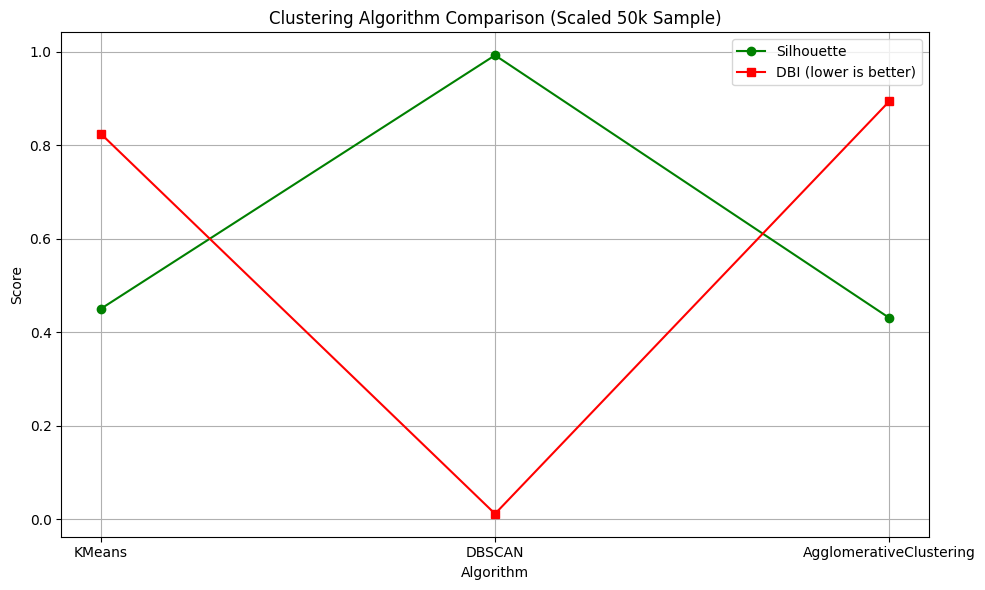

In [24]:
# Step 7 (optional): Visual comparison of metrics
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(results_df['algorithm'], results_df['silhouette'], marker='o', color='green', label='Silhouette')
plt.plot(results_df['algorithm'], results_df['dbi'], marker='s', color='red', label='DBI (lower is better)')
plt.title("Clustering Algorithm Comparison (Scaled 50k Sample)")
plt.xlabel("Algorithm")
plt.ylabel("Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
#------------------------------------------------------------------------------------------------------